In [ ]:
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt


In [ ]:
#visualization function
def show(tensor, ch=1, size=(28,28), num=16):
  data = tensor.detach().cpu().view(-1,ch,*size) #detach the tensor from gradient computation & you don't need gpu for visualization
  # the tensor size is batch_size * image_size : 128 * 784 >> view >> 128 * 1 * 28 * 28 (batch, channel, width, height)
  grid = make_grid(data[:num],nrow=4).permute(1,2,0)
  # order of tensor in pytorch : (batch, channel, width,height)
  # order required for plt : (width,height,channel) >> so use permute to change the order of data
  plt.imshow(grid)
  plt.show()

In [ ]:
# setup of the main parameters and hyperparameters
epochs = 500
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),shuffle=True, batch_size=bs)

# number of steps = 60000 / 128 = 468.75  (# of steps =number of images in the dataset / batch size)

100%|██████████| 9912422/9912422 [00:00<00:00, 80792915.69it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 43201032.03it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 33537123.19it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 21285507.00it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
#Generator

def genBlock(inp,out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self,z_dim=64,i_dim= 784, h_dim=128): #h_dim: size of hidden neurons i_dim:size of the output image
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim,h_dim),
        genBlock(h_dim,h_dim*2),
        genBlock(h_dim*2,h_dim*4),
        genBlock(h_dim*4,h_dim*8),
        nn.Linear(h_dim*8,i_dim),
        nn.Sigmoid()
    )

  def forward(self,noise):
      return self.gen(noise)

def gen_noise(number,z_dim):
  return torch.randn(number,z_dim).to(device)


def discBlock(inp,out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc = nn.Sequential(
        discBlock(i_dim,h_dim*4),
        discBlock(h_dim*4,h_dim*2),
        discBlock(h_dim*2,h_dim),
        nn.Linear(h_dim,1)
    )
  def forward(self,image):
    return self.disc(image)

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [ ]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([8, 9, 6, 9, 8, 1, 6, 2, 2, 9])


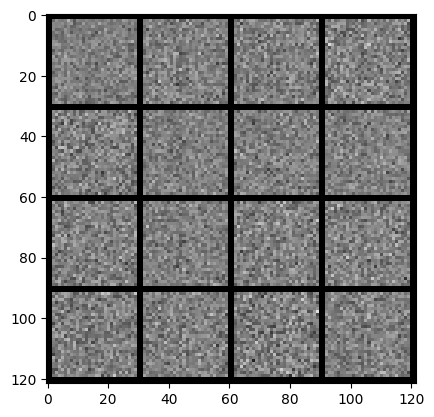

In [ ]:
x,y = next(iter(dataloader))
print(x.shape,y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [ ]:
# calculating the loss

# generator loss
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   pred = disc(fake)
   #the generator wants to fool the disc and convince it that the images are real and real== label or target 1
   targets=torch.ones_like(pred)
   gen_loss=loss_func(pred,targets)

   return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   disc_fake = disc(fake.detach())
   disc_fake_targets=torch.zeros_like(disc_fake)
   disc_fake_loss=loss_func(disc_fake, disc_fake_targets)

   disc_real = disc(real)
   disc_real_targets=torch.ones_like(disc_real)
   disc_real_loss=loss_func(disc_real, disc_real_targets)

   disc_loss=(disc_fake_loss+disc_real_loss)/2

   return disc_loss

  0%|          | 0/469 [00:00<?, ?it/s]

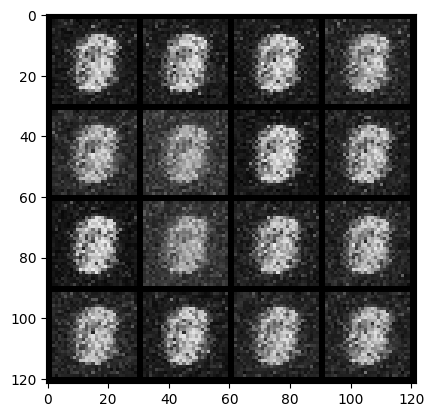

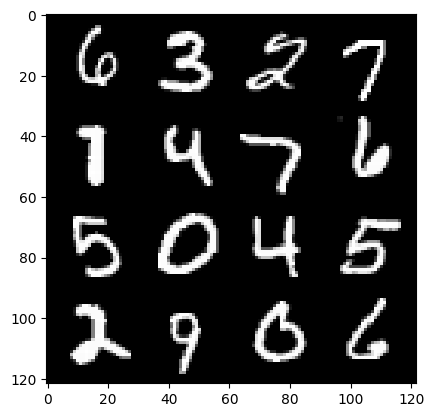

0: step 300 / Gen loss: 1.906547756393751 / disc_loss: 0.35224235907197


  0%|          | 0/469 [00:00<?, ?it/s]

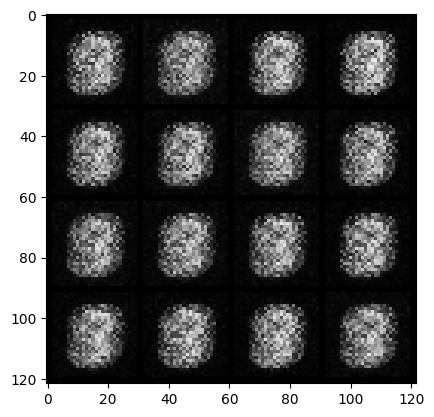

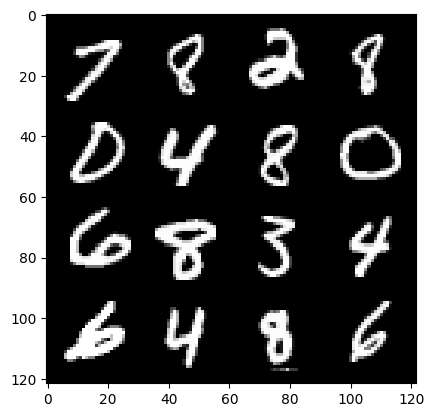

1: step 600 / Gen loss: 3.4111257179578174 / disc_loss: 0.12630388356745242


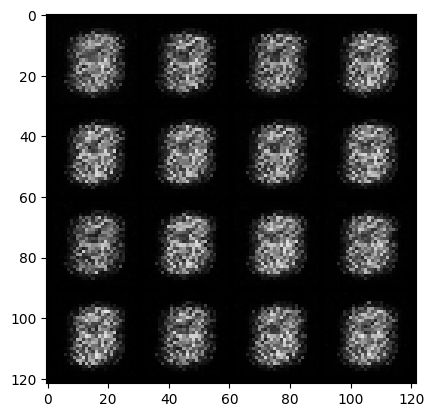

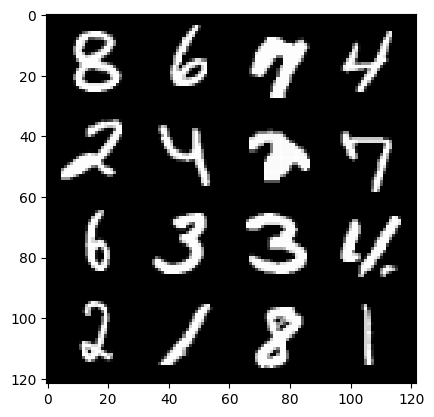

1: step 900 / Gen loss: 3.432160964012143 / disc_loss: 0.05675624707092842


  0%|          | 0/469 [00:00<?, ?it/s]

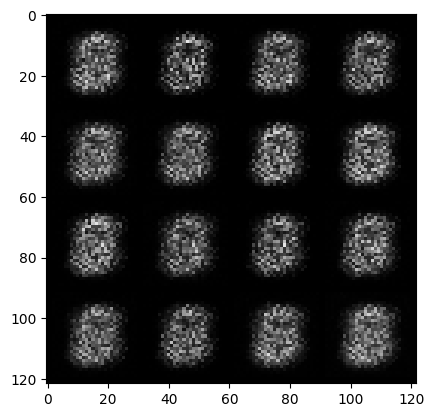

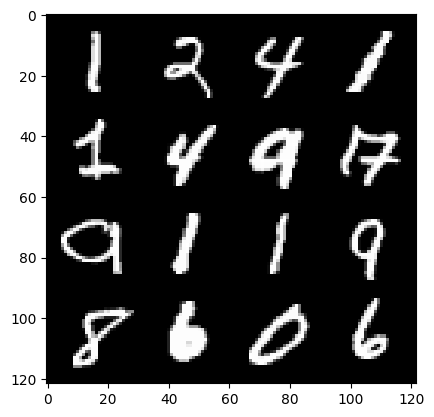

2: step 1200 / Gen loss: 3.5011301684379585 / disc_loss: 0.03753004950781662


  0%|          | 0/469 [00:00<?, ?it/s]

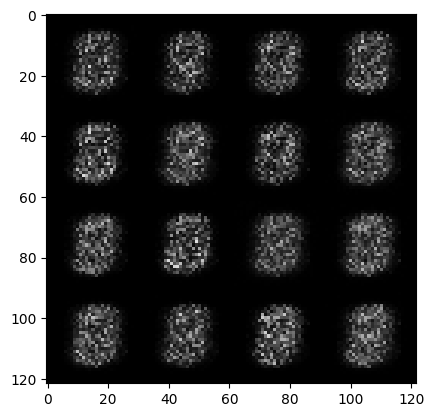

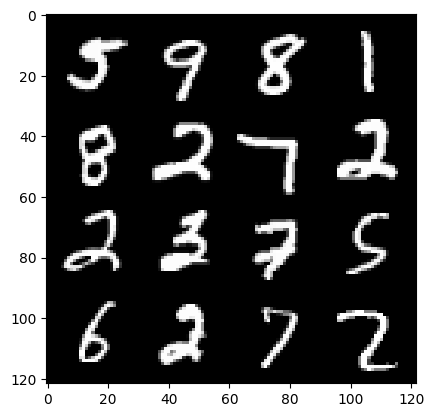

3: step 1500 / Gen loss: 3.409511148134868 / disc_loss: 0.04107716078559556


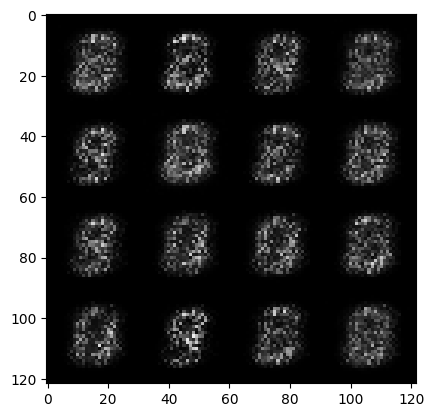

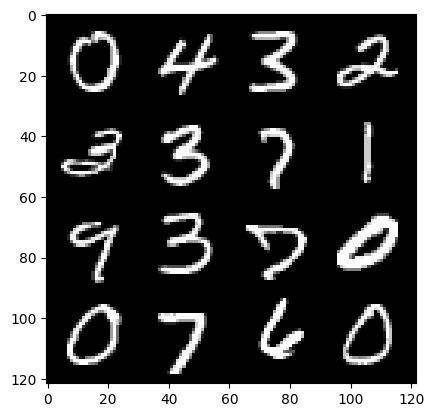

3: step 1800 / Gen loss: 3.3273620041211456 / disc_loss: 0.05019158408045769


  0%|          | 0/469 [00:00<?, ?it/s]

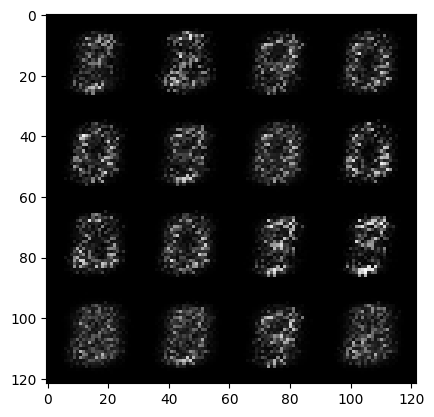

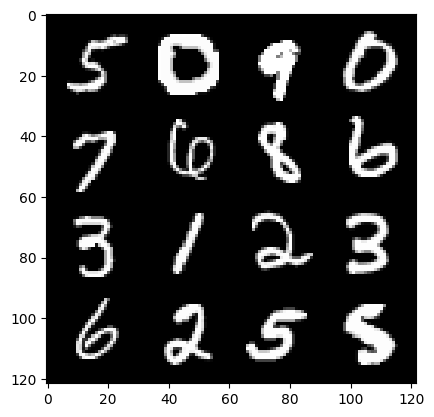

4: step 2100 / Gen loss: 3.5021466803550716 / disc_loss: 0.05023777395486837


  0%|          | 0/469 [00:00<?, ?it/s]

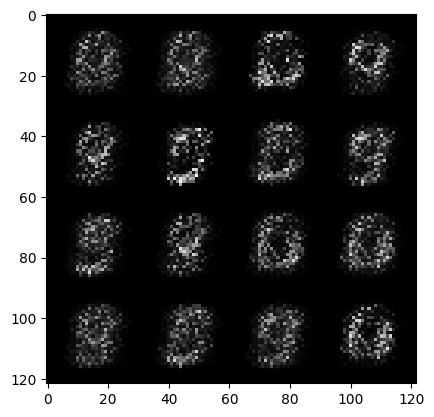

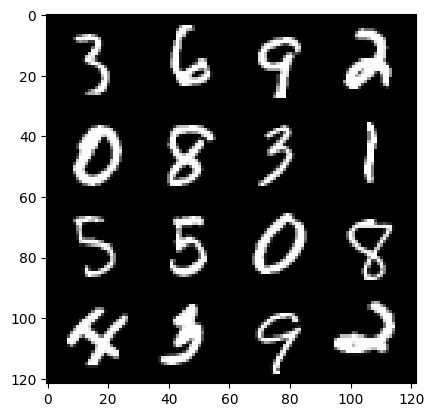

5: step 2400 / Gen loss: 3.8321735850969927 / disc_loss: 0.04089527277275921


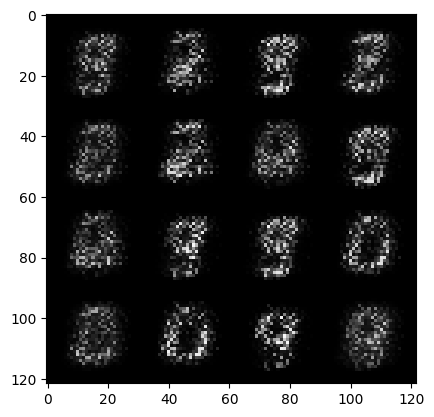

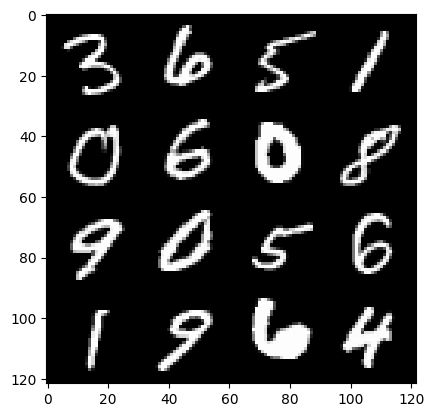

5: step 2700 / Gen loss: 4.403706461588541 / disc_loss: 0.02998853212222457


  0%|          | 0/469 [00:00<?, ?it/s]

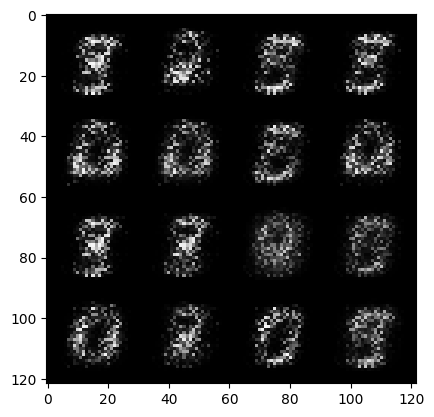

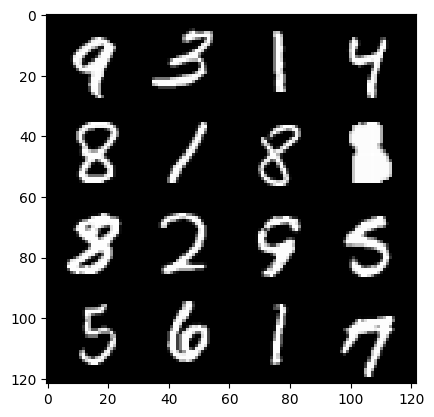

6: step 3000 / Gen loss: 4.696973880132036 / disc_loss: 0.029067575223743883


  0%|          | 0/469 [00:00<?, ?it/s]

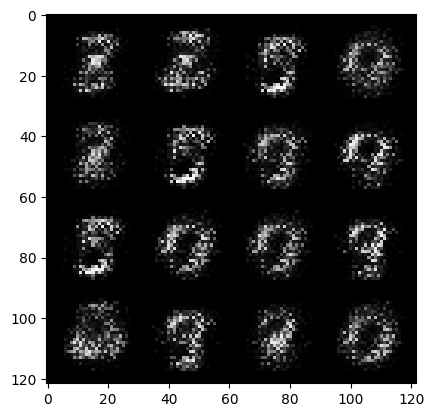

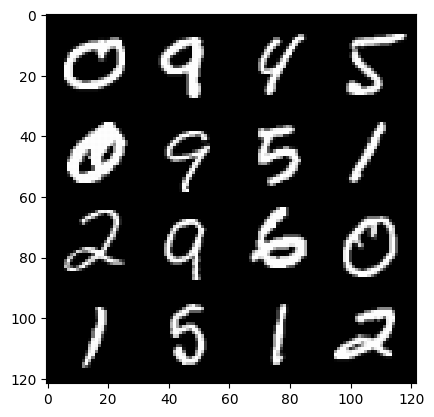

7: step 3300 / Gen loss: 4.923038431803385 / disc_loss: 0.02418266097704567


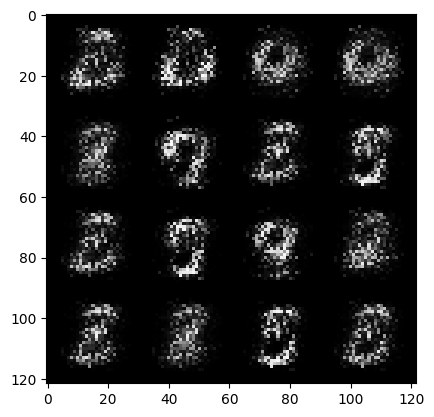

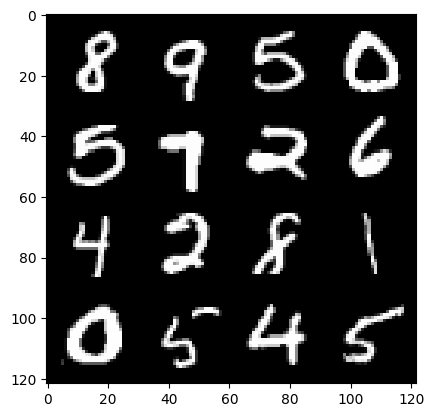

7: step 3600 / Gen loss: 5.120307089487708 / disc_loss: 0.024278567051514988


  0%|          | 0/469 [00:00<?, ?it/s]

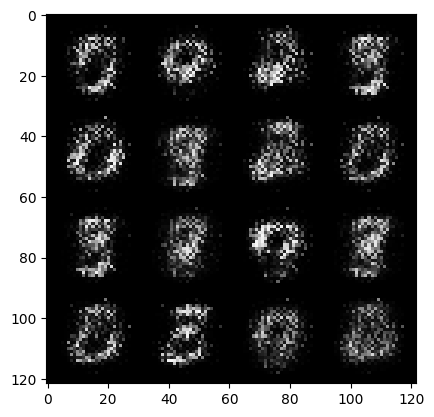

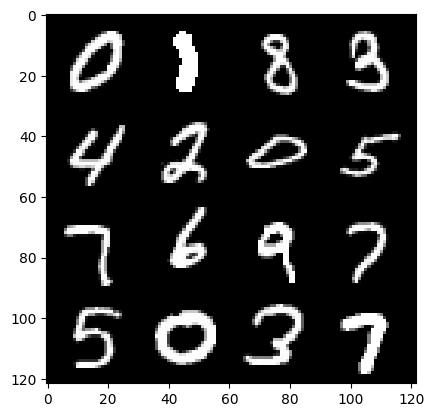

8: step 3900 / Gen loss: 5.437098191579182 / disc_loss: 0.017169214868918068


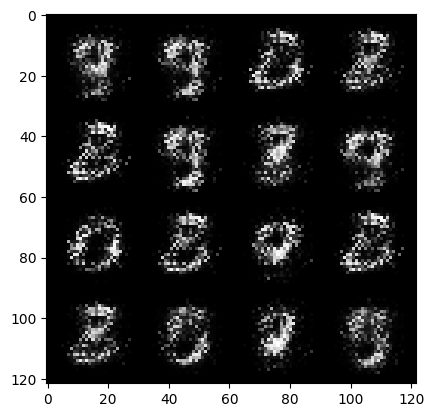

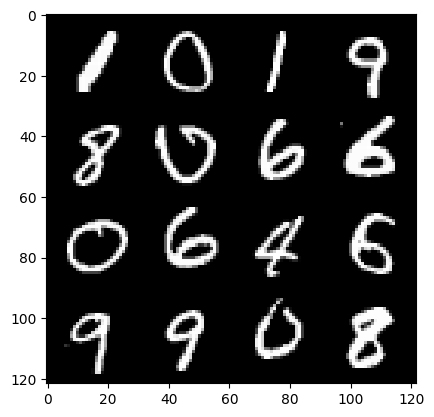

8: step 4200 / Gen loss: 5.839354599316918 / disc_loss: 0.015114207187046603


  0%|          | 0/469 [00:00<?, ?it/s]

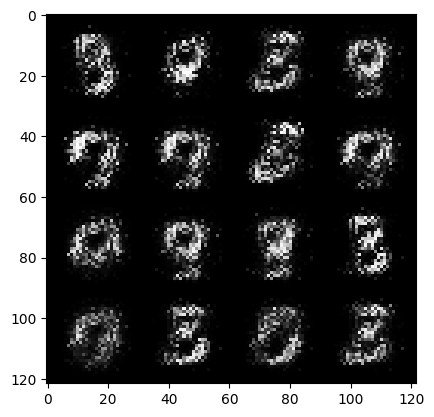

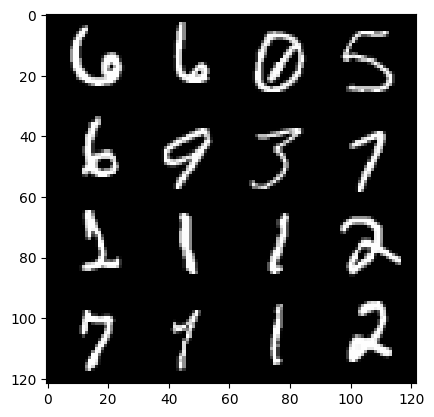

9: step 4500 / Gen loss: 6.3439327971140544 / disc_loss: 0.013582233232446018


  0%|          | 0/469 [00:00<?, ?it/s]

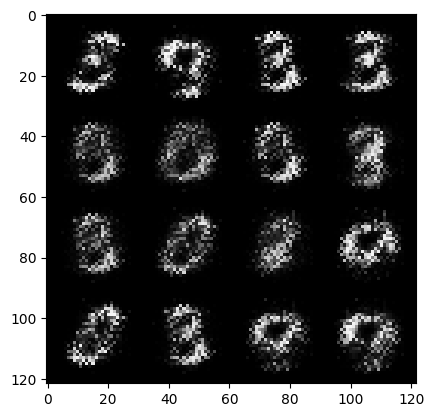

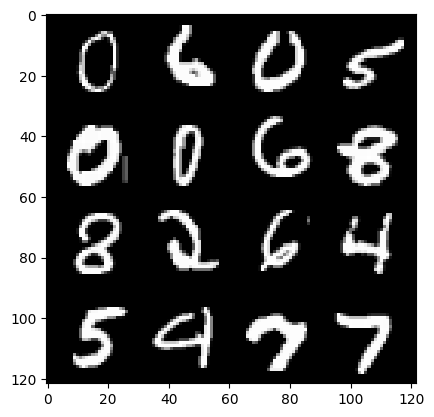

10: step 4800 / Gen loss: 6.439474738438926 / disc_loss: 0.014955335900497928


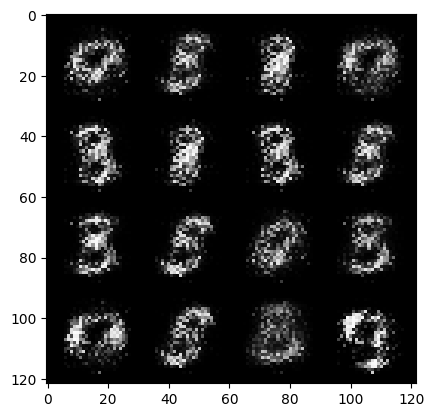

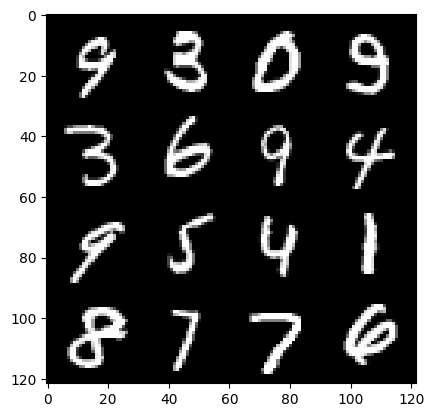

10: step 5100 / Gen loss: 5.866411291758219 / disc_loss: 0.017823021615234528


  0%|          | 0/469 [00:00<?, ?it/s]

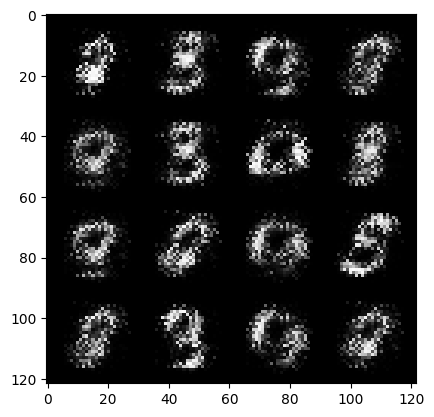

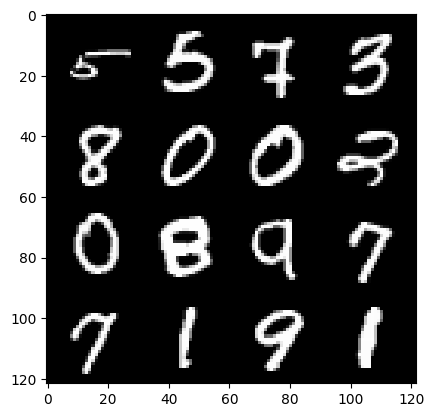

11: step 5400 / Gen loss: 6.02477523326874 / disc_loss: 0.01756660576444119


  0%|          | 0/469 [00:00<?, ?it/s]

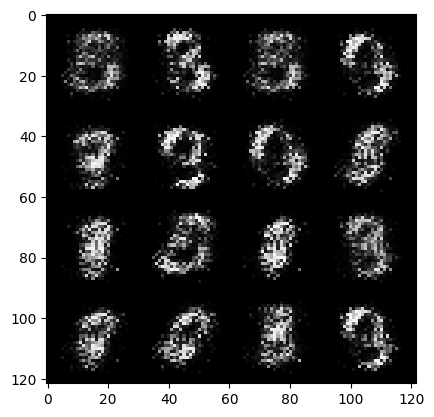

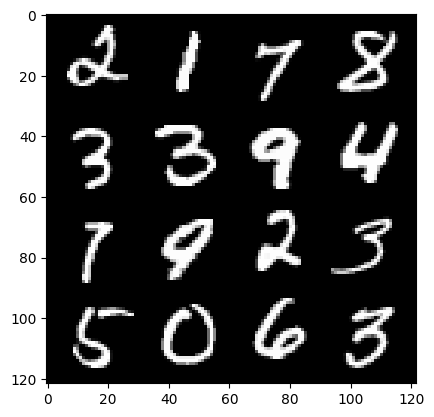

12: step 5700 / Gen loss: 6.630734019279478 / disc_loss: 0.014872670212450121


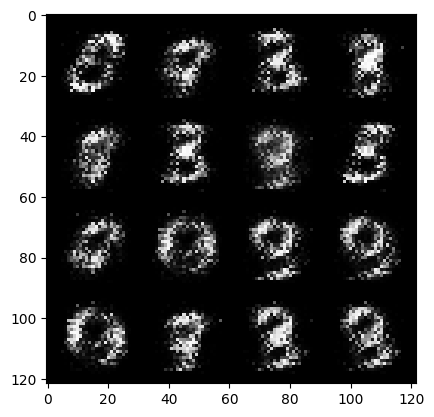

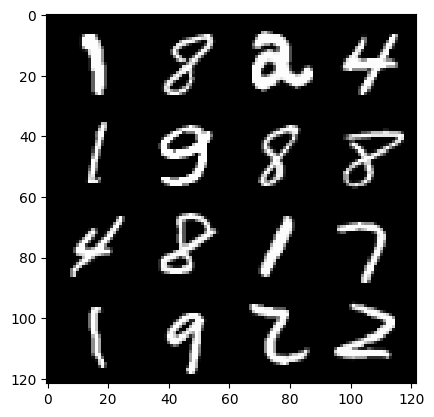

12: step 6000 / Gen loss: 6.569084833463029 / disc_loss: 0.014437104157793016


  0%|          | 0/469 [00:00<?, ?it/s]

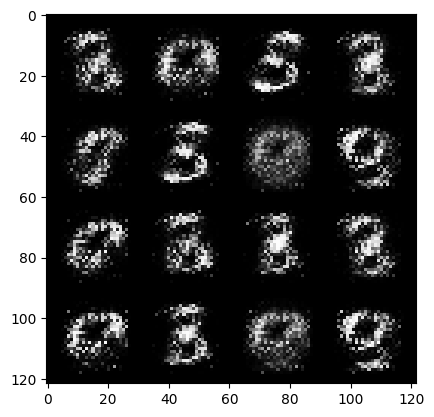

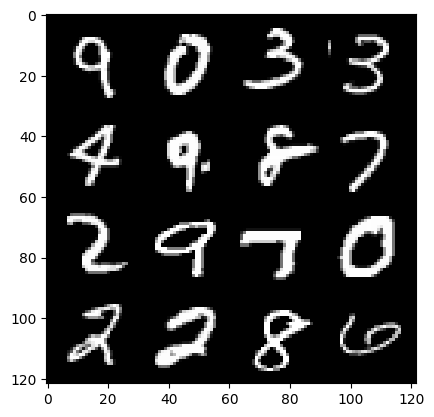

13: step 6300 / Gen loss: 6.374306573867798 / disc_loss: 0.015352047453634433


  0%|          | 0/469 [00:00<?, ?it/s]

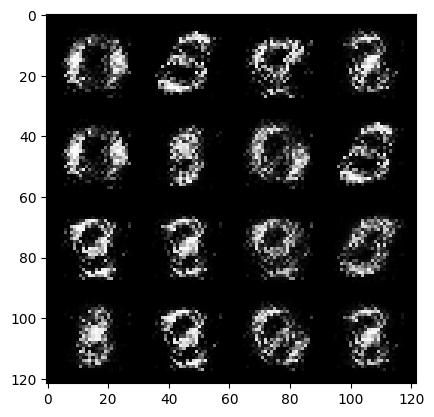

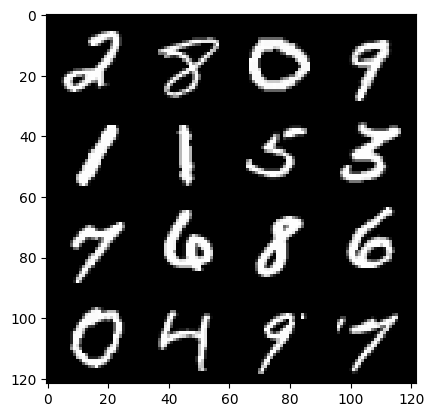

14: step 6600 / Gen loss: 6.624966195424395 / disc_loss: 0.011964691949542614


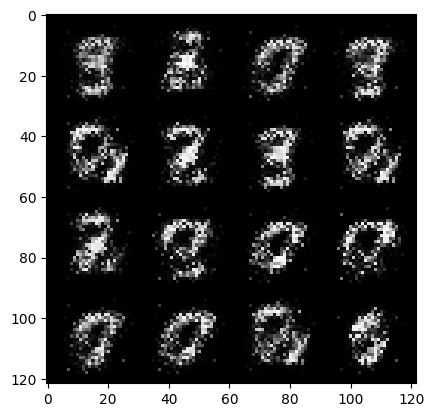

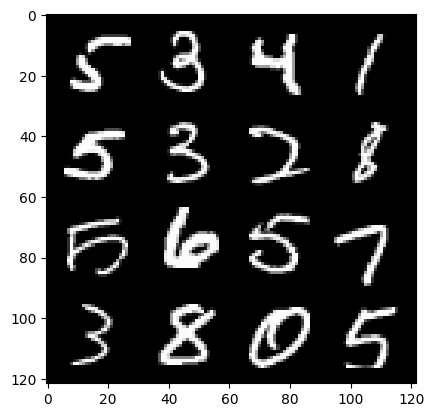

14: step 6900 / Gen loss: 6.751164197921755 / disc_loss: 0.0111832492852894


  0%|          | 0/469 [00:00<?, ?it/s]

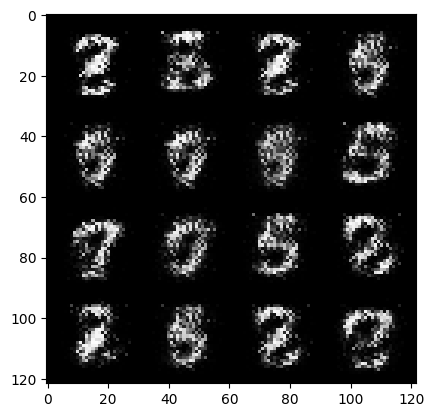

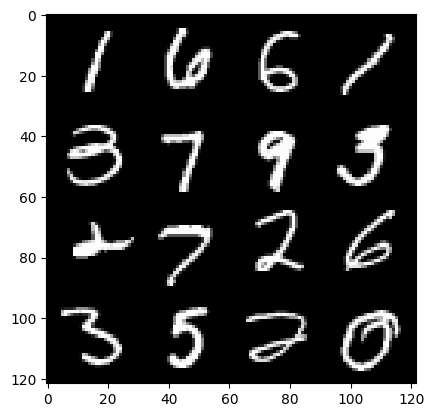

15: step 7200 / Gen loss: 6.881405917803445 / disc_loss: 0.010433317609131337


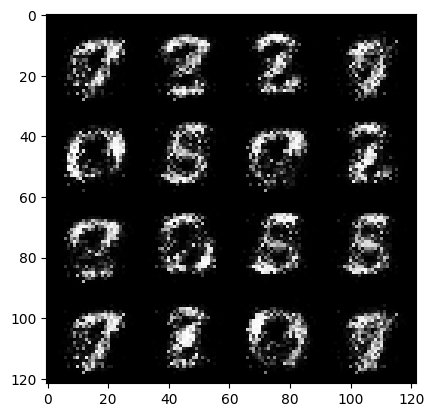

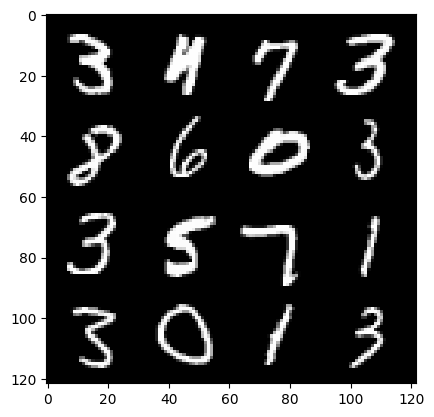

15: step 7500 / Gen loss: 6.5302758661905935 / disc_loss: 0.009897730527445667


  0%|          | 0/469 [00:00<?, ?it/s]

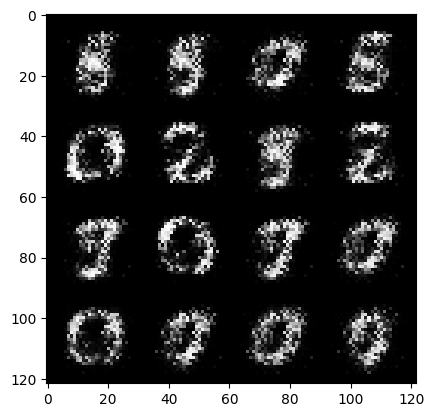

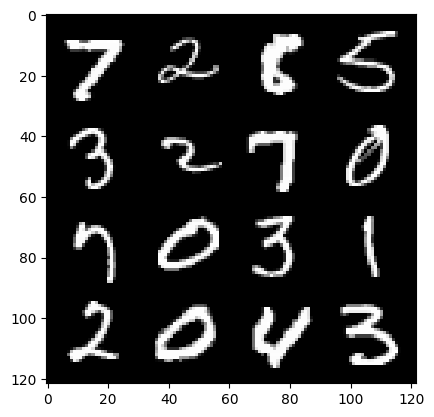

16: step 7800 / Gen loss: 6.4616655397415155 / disc_loss: 0.009008112709658837


  0%|          | 0/469 [00:00<?, ?it/s]

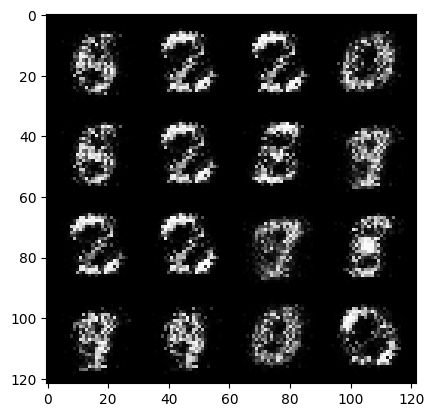

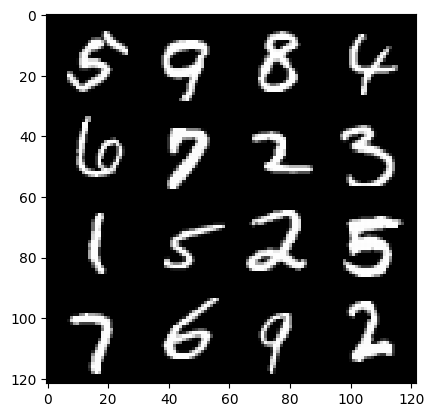

17: step 8100 / Gen loss: 6.542266279856362 / disc_loss: 0.009708942820628482


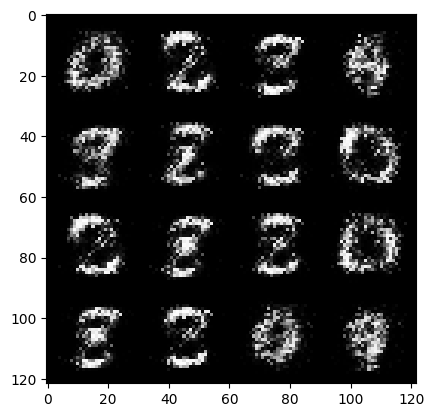

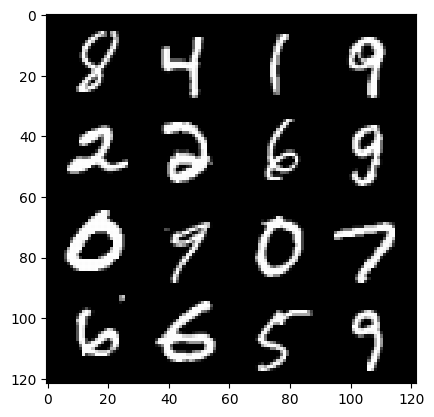

17: step 8400 / Gen loss: 6.880137208302809 / disc_loss: 0.009697679313831035


  0%|          | 0/469 [00:00<?, ?it/s]

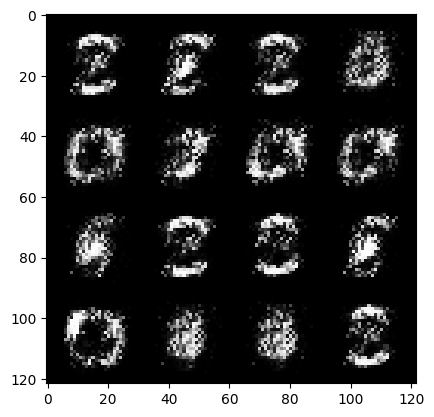

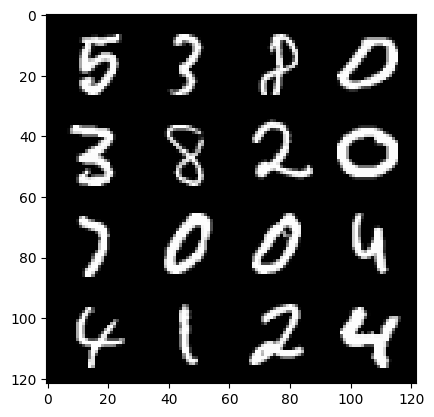

18: step 8700 / Gen loss: 7.164030855496726 / disc_loss: 0.009548857437912384


  0%|          | 0/469 [00:00<?, ?it/s]

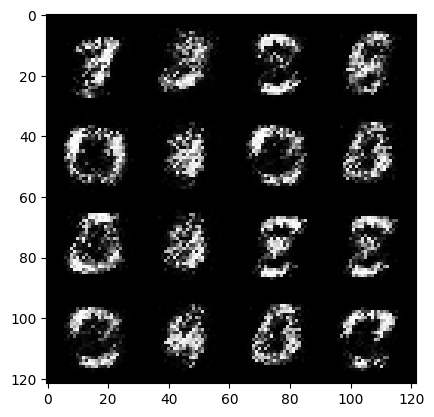

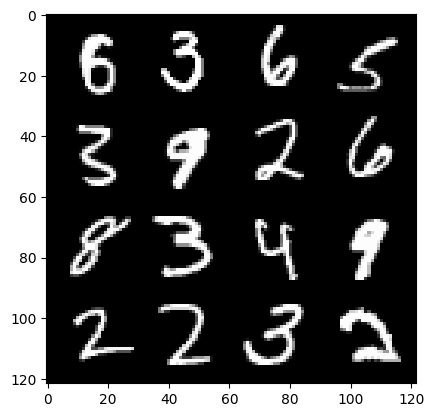

19: step 9000 / Gen loss: 6.9212992699940985 / disc_loss: 0.009489425711023314


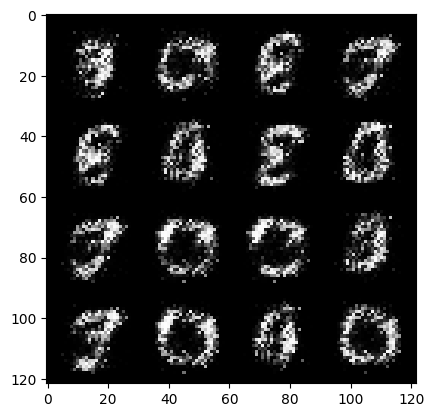

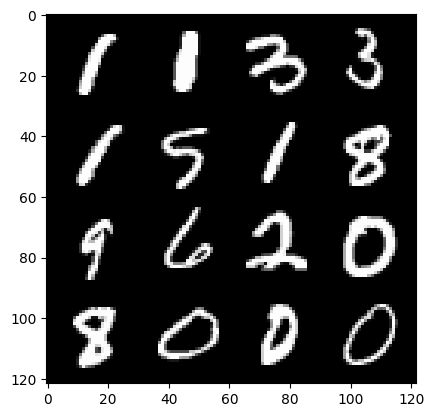

19: step 9300 / Gen loss: 6.591315312385563 / disc_loss: 0.008564954438867668


  0%|          | 0/469 [00:00<?, ?it/s]

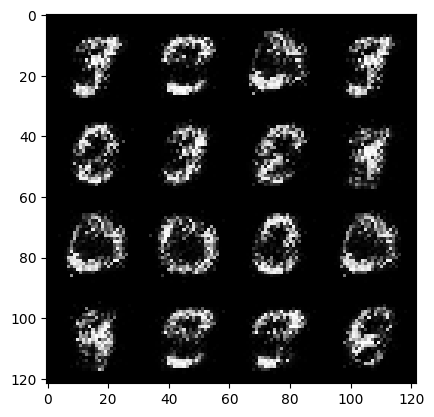

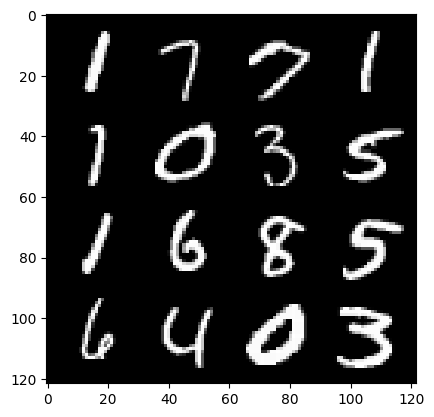

20: step 9600 / Gen loss: 6.961570377349855 / disc_loss: 0.008794846475357188


  0%|          | 0/469 [00:00<?, ?it/s]

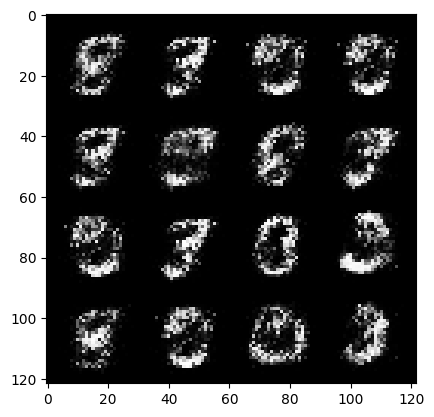

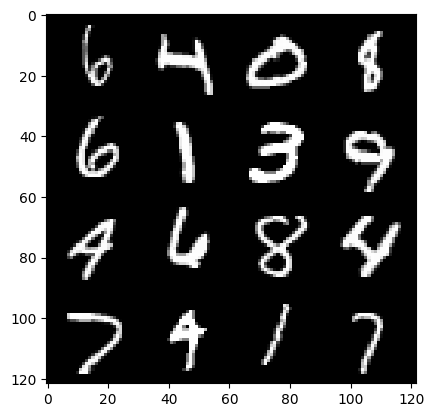

21: step 9900 / Gen loss: 7.429724151293438 / disc_loss: 0.009041476273365937


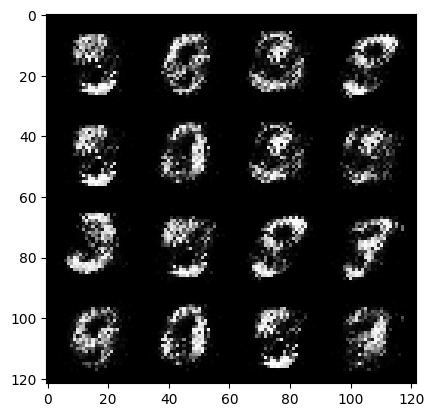

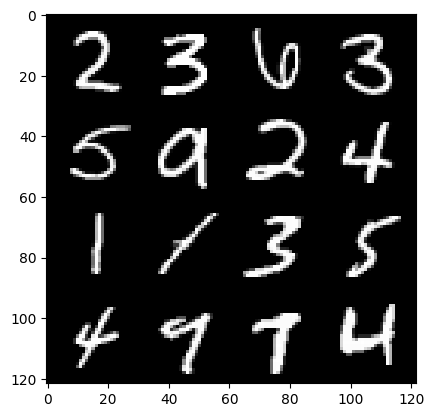

21: step 10200 / Gen loss: 7.462408919334416 / disc_loss: 0.012381191866782805


  0%|          | 0/469 [00:00<?, ?it/s]

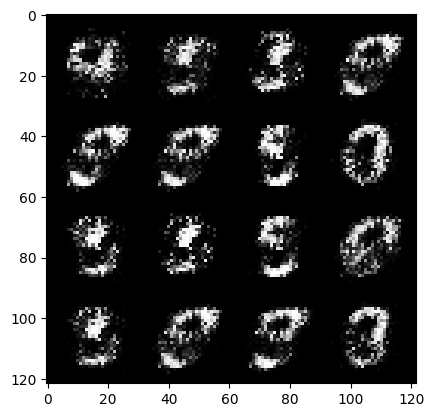

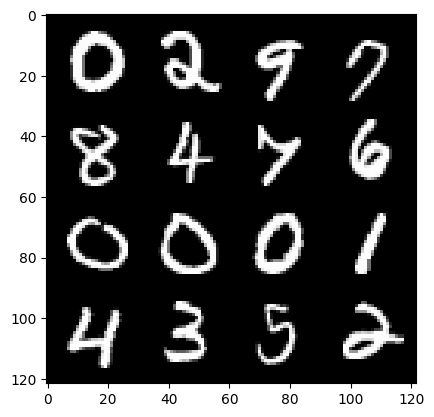

22: step 10500 / Gen loss: 6.898924082120258 / disc_loss: 0.012216873857347913


  0%|          | 0/469 [00:00<?, ?it/s]

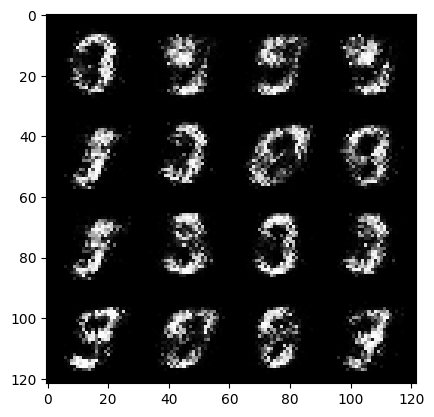

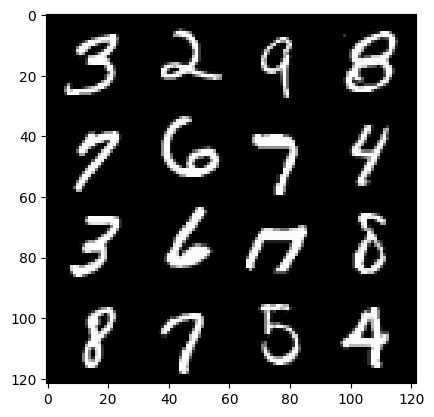

23: step 10800 / Gen loss: 7.149709229469299 / disc_loss: 0.013611749440121158


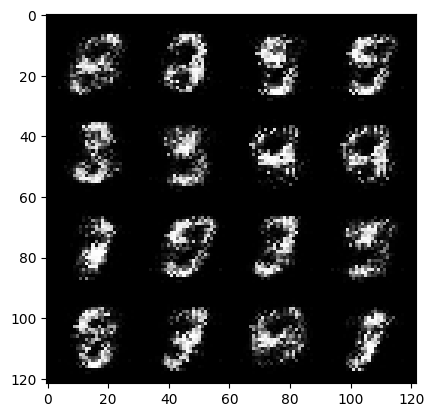

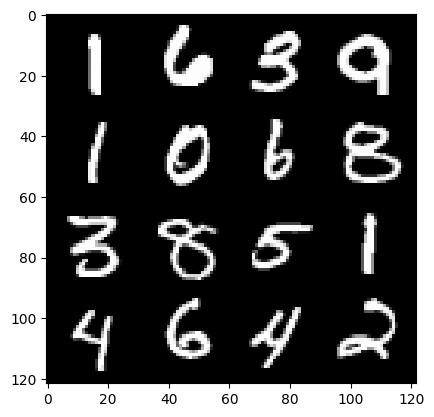

23: step 11100 / Gen loss: 6.526961998939514 / disc_loss: 0.013645089954758681


  0%|          | 0/469 [00:00<?, ?it/s]

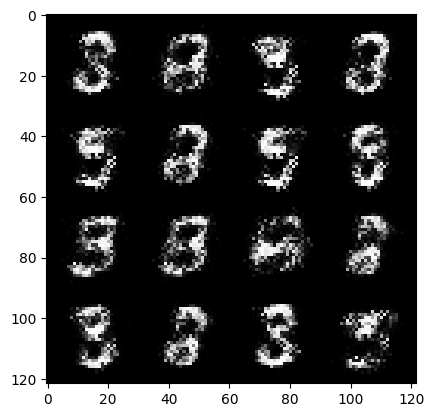

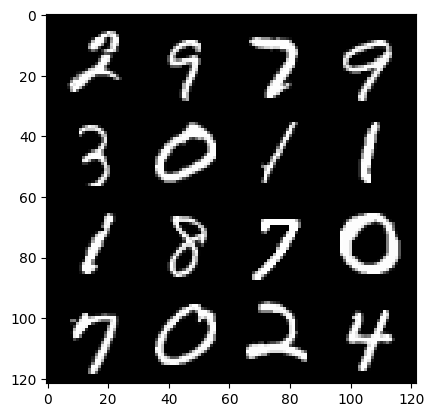

24: step 11400 / Gen loss: 6.5313555447260505 / disc_loss: 0.01400018323445693


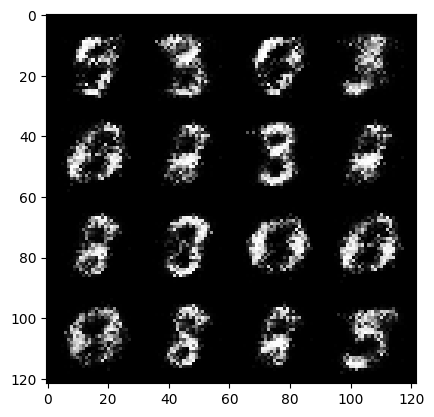

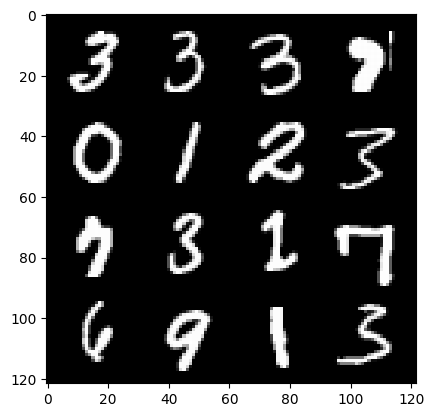

24: step 11700 / Gen loss: 6.63892678419749 / disc_loss: 0.014508701763115835


  0%|          | 0/469 [00:00<?, ?it/s]

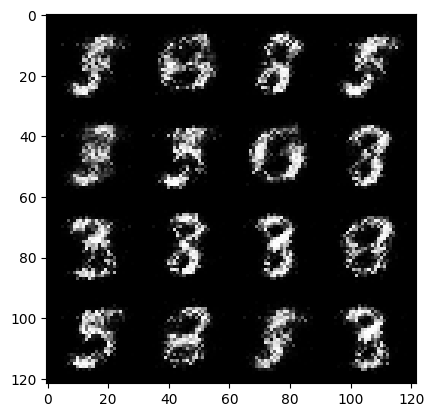

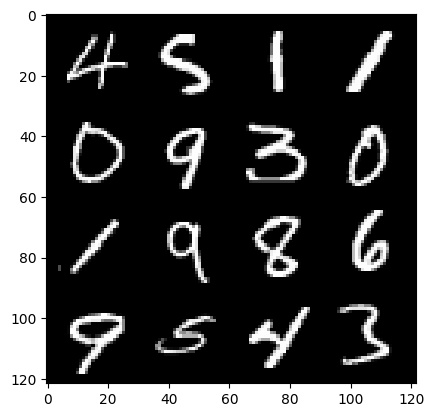

25: step 12000 / Gen loss: 6.2986966021855695 / disc_loss: 0.015837911531173938


  0%|          | 0/469 [00:00<?, ?it/s]

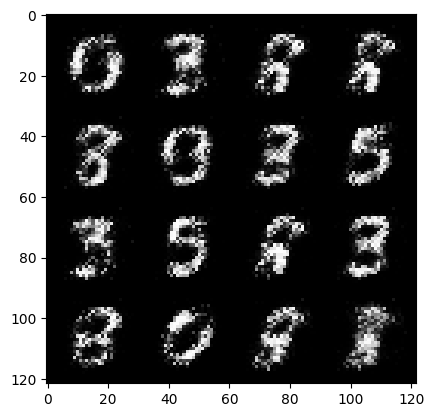

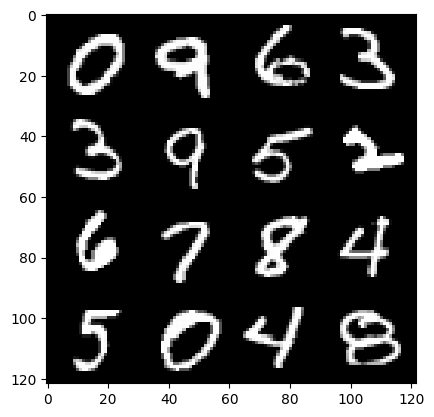

26: step 12300 / Gen loss: 6.285162954330442 / disc_loss: 0.01518548100953923


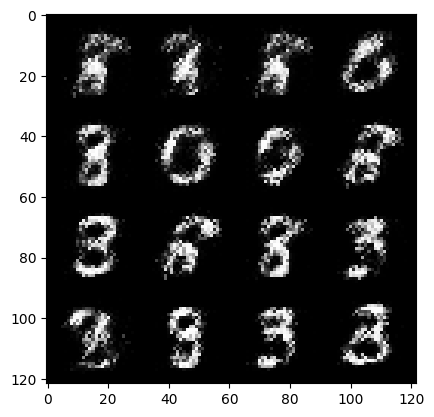

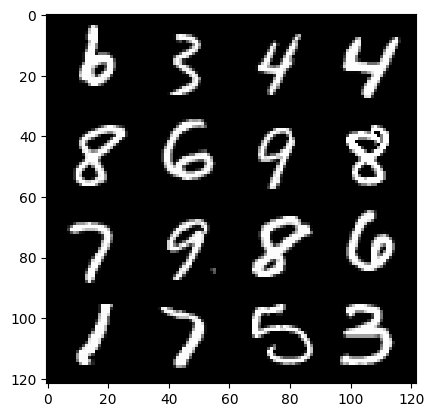

26: step 12600 / Gen loss: 6.850573409398394 / disc_loss: 0.017277037210296844


  0%|          | 0/469 [00:00<?, ?it/s]

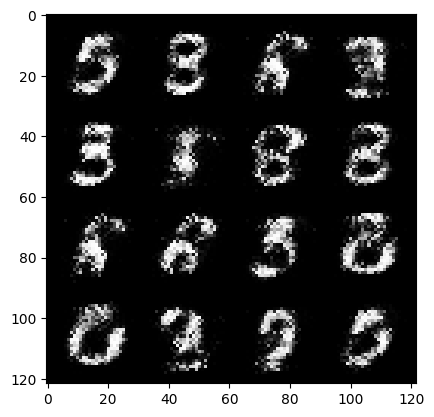

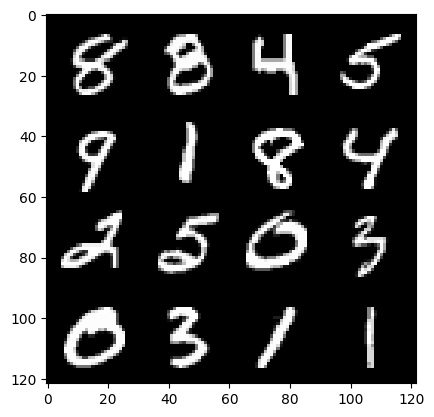

27: step 12900 / Gen loss: 6.338773876825962 / disc_loss: 0.018941132777060048


  0%|          | 0/469 [00:00<?, ?it/s]

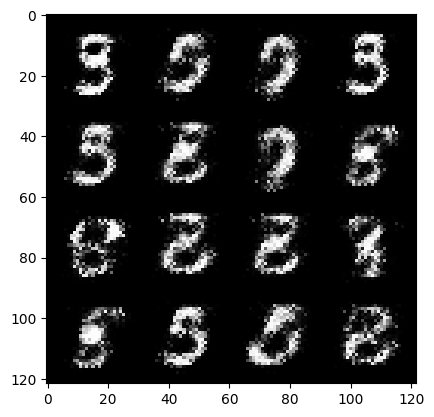

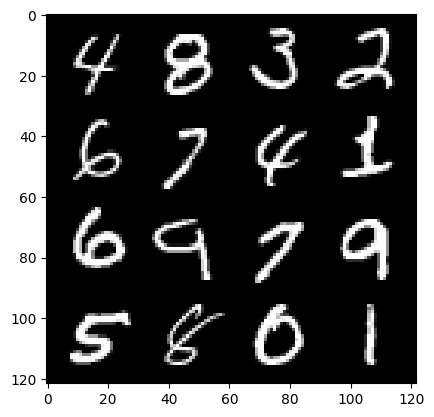

28: step 13200 / Gen loss: 6.381109151840208 / disc_loss: 0.015178358894772828


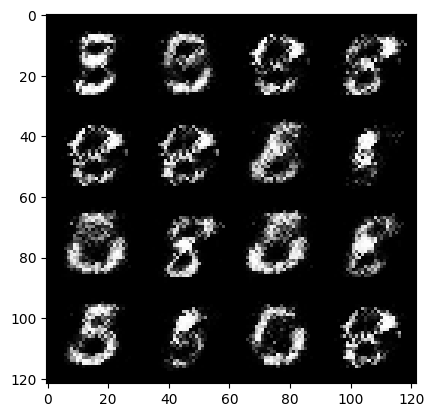

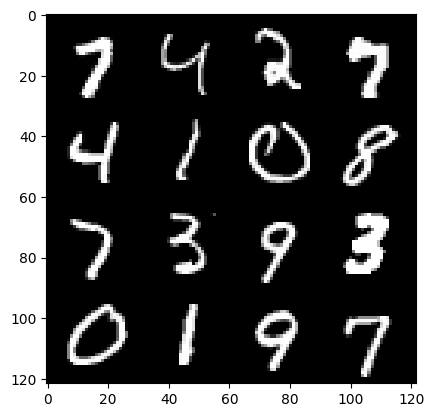

28: step 13500 / Gen loss: 6.314888458251954 / disc_loss: 0.017712541379344967


  0%|          | 0/469 [00:00<?, ?it/s]

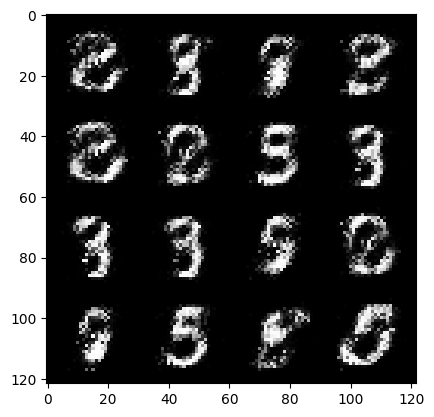

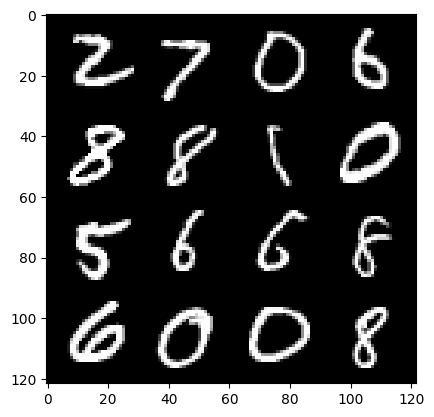

29: step 13800 / Gen loss: 6.47429898579915 / disc_loss: 0.020918076328622807


  0%|          | 0/469 [00:00<?, ?it/s]

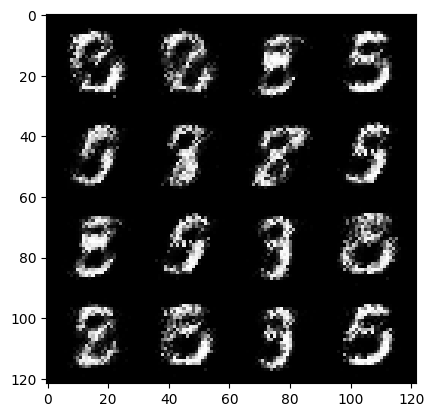

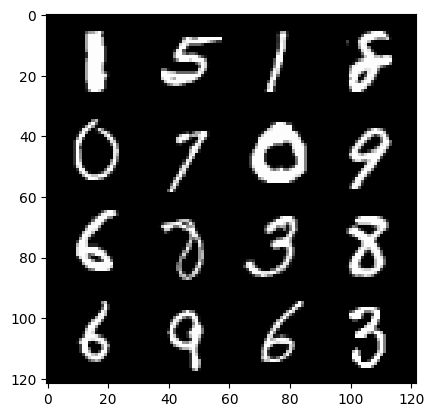

30: step 14100 / Gen loss: 6.110095305442808 / disc_loss: 0.027450711197840694


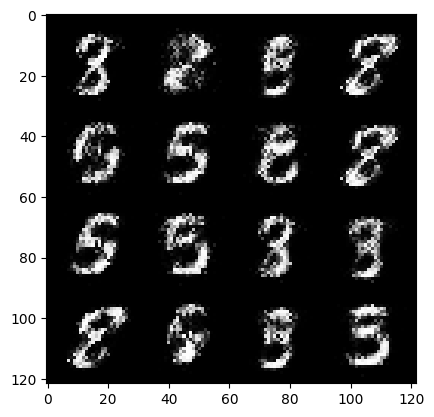

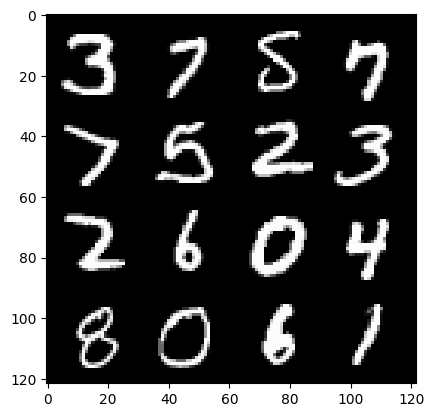

30: step 14400 / Gen loss: 5.964289553960165 / disc_loss: 0.023674118902223797


  0%|          | 0/469 [00:00<?, ?it/s]

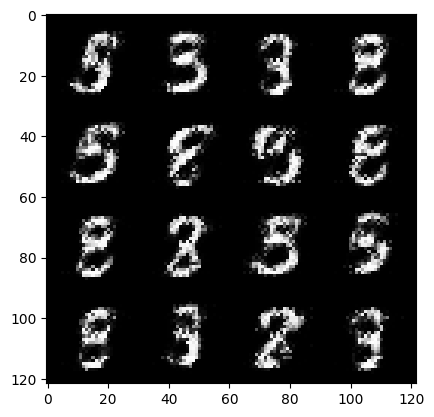

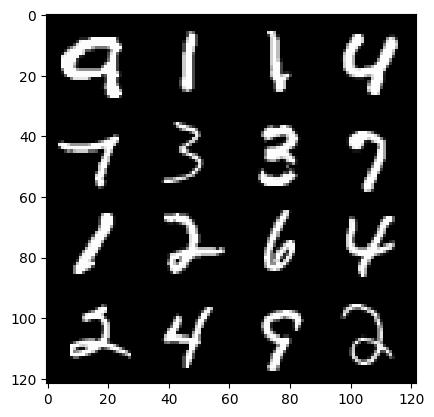

31: step 14700 / Gen loss: 5.832276928424832 / disc_loss: 0.030285194000850103


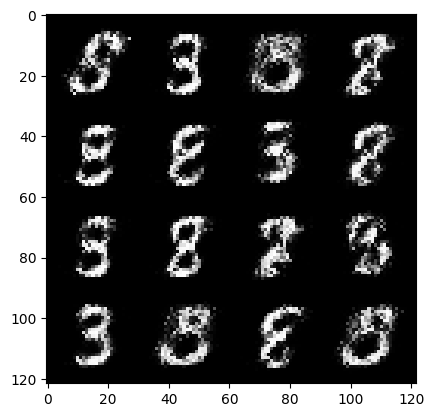

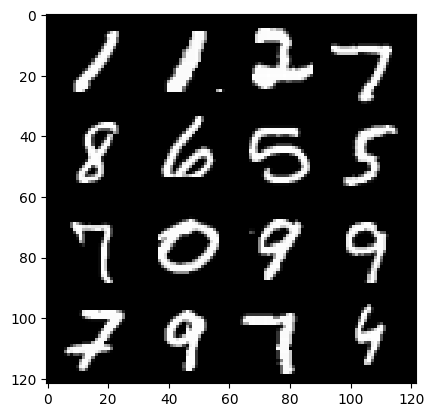

31: step 15000 / Gen loss: 5.434200894037884 / disc_loss: 0.03368043575125437


  0%|          | 0/469 [00:00<?, ?it/s]

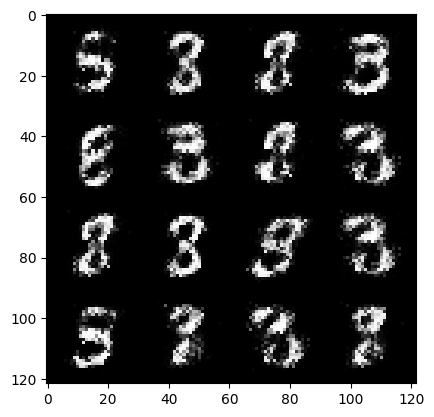

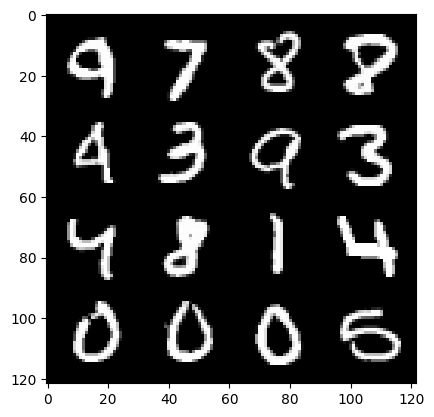

32: step 15300 / Gen loss: 5.9004830010732015 / disc_loss: 0.029850770387177664


  0%|          | 0/469 [00:00<?, ?it/s]

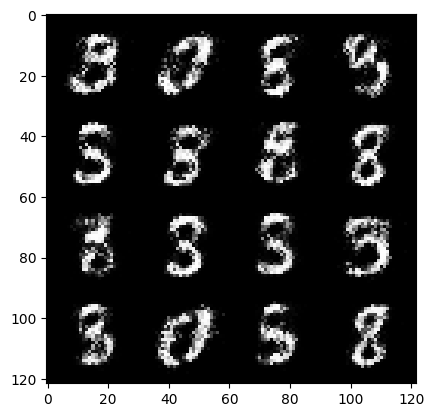

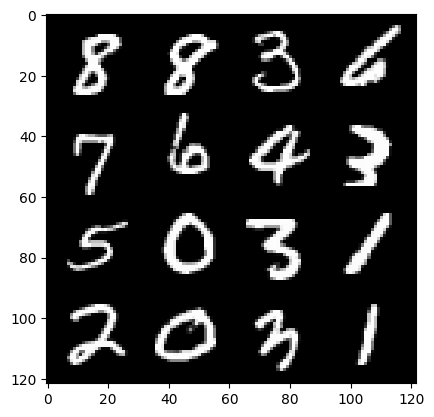

33: step 15600 / Gen loss: 5.667459793090818 / disc_loss: 0.033537499054024644


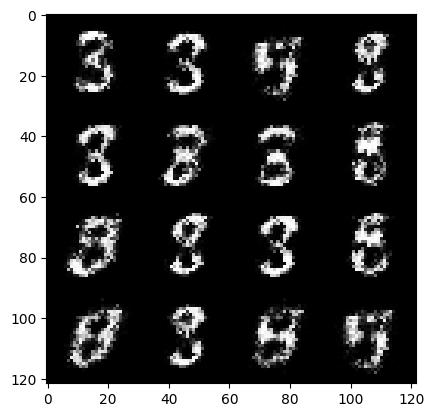

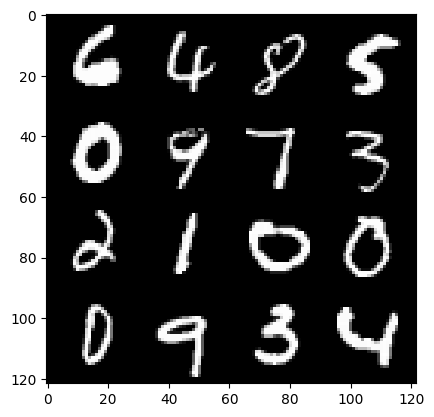

33: step 15900 / Gen loss: 5.583932259877523 / disc_loss: 0.03418935346417129


  0%|          | 0/469 [00:00<?, ?it/s]

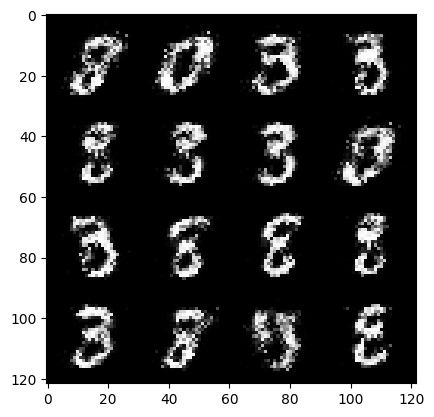

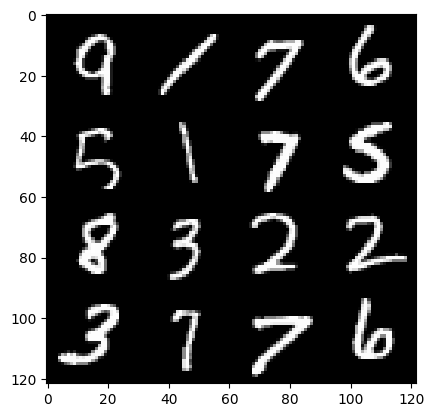

34: step 16200 / Gen loss: 5.504972246487936 / disc_loss: 0.033051486113108694


  0%|          | 0/469 [00:00<?, ?it/s]

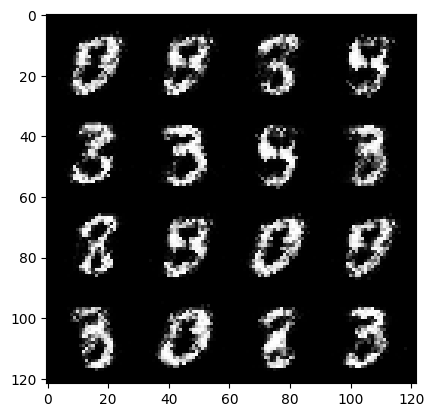

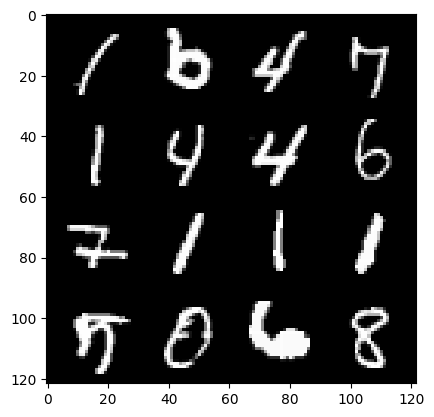

35: step 16500 / Gen loss: 5.678881581624349 / disc_loss: 0.030857270021612454


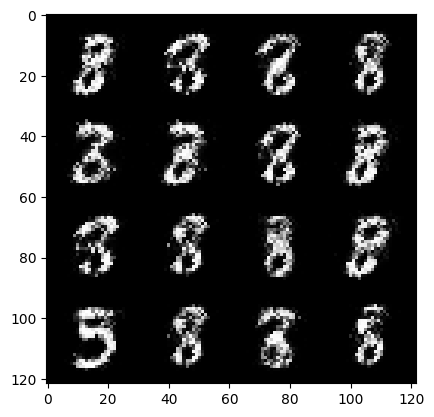

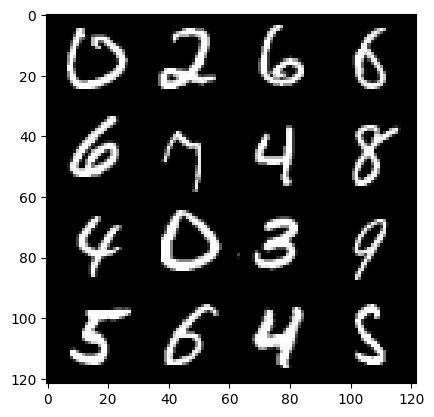

35: step 16800 / Gen loss: 5.841247873306275 / disc_loss: 0.02940674588239442


  0%|          | 0/469 [00:00<?, ?it/s]

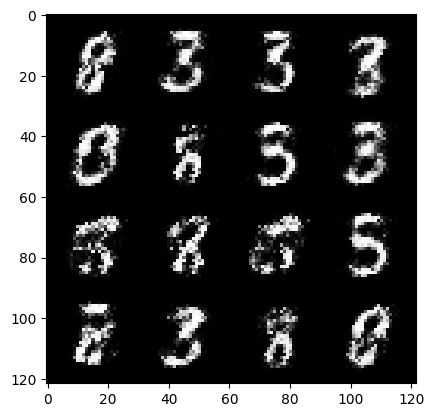

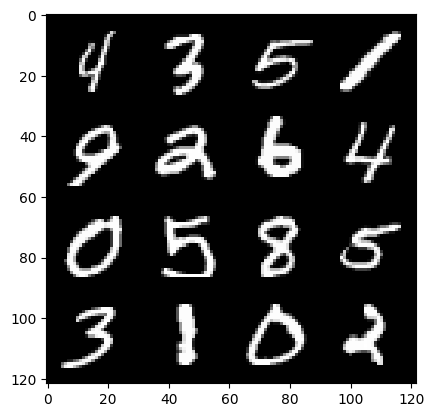

36: step 17100 / Gen loss: 5.64497250159582 / disc_loss: 0.043134595233326155


  0%|          | 0/469 [00:00<?, ?it/s]

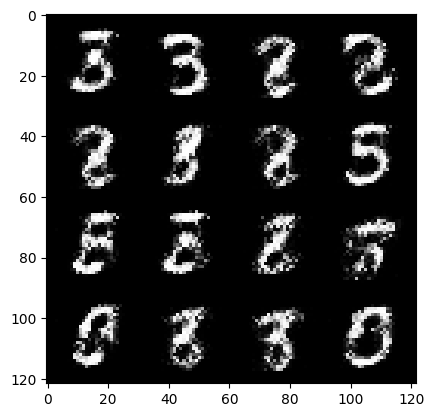

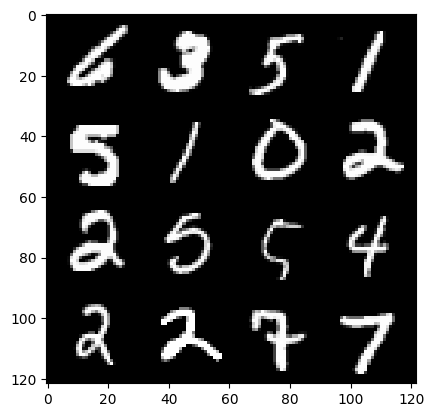

37: step 17400 / Gen loss: 5.385258200963338 / disc_loss: 0.044712980911135666


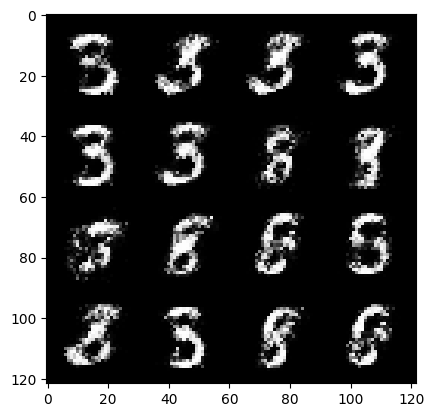

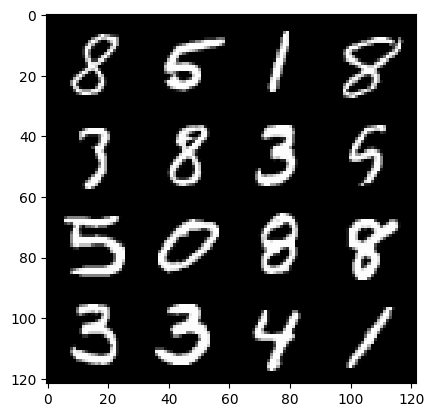

37: step 17700 / Gen loss: 5.66672728379568 / disc_loss: 0.038638323637036


  0%|          | 0/469 [00:00<?, ?it/s]

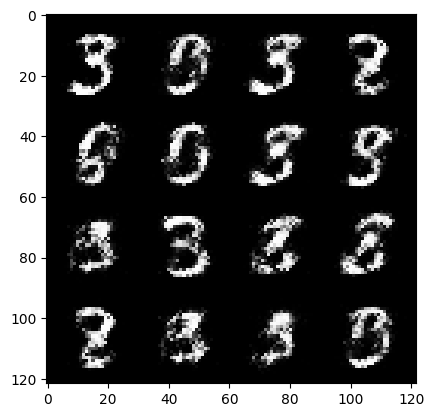

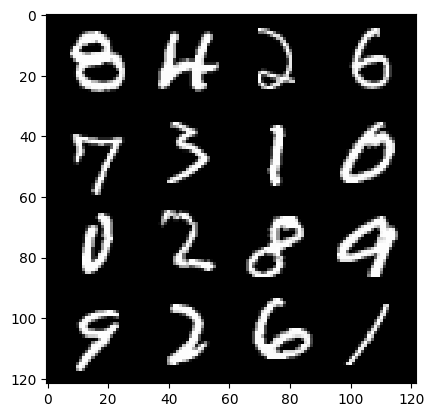

38: step 18000 / Gen loss: 5.637363025347394 / disc_loss: 0.04193492026068269


  0%|          | 0/469 [00:00<?, ?it/s]

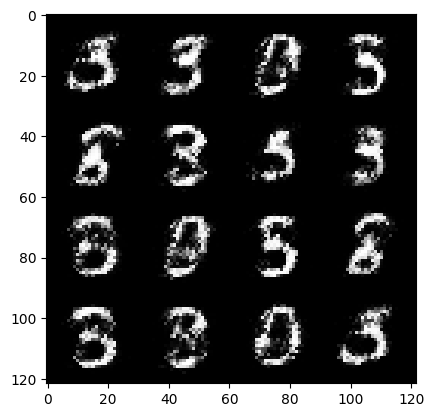

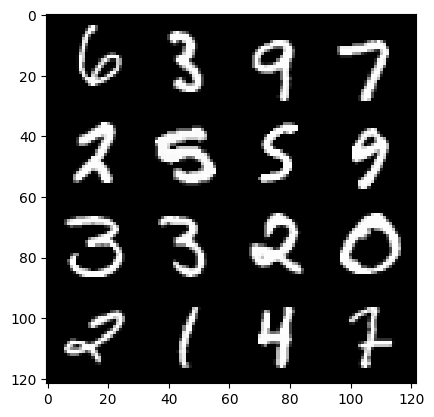

39: step 18300 / Gen loss: 5.400250050226849 / disc_loss: 0.057719647195190175


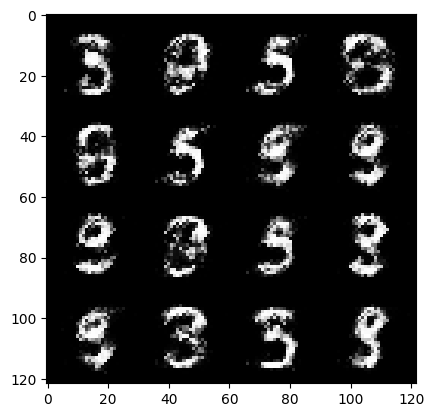

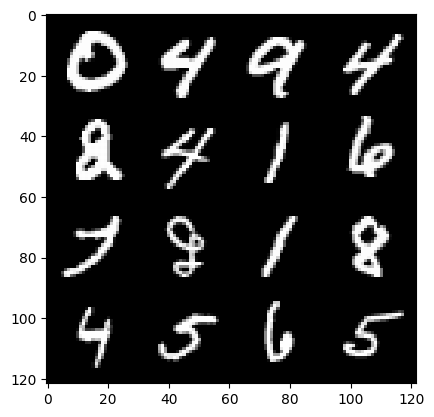

39: step 18600 / Gen loss: 5.6396578979492205 / disc_loss: 0.03910961442316568


  0%|          | 0/469 [00:00<?, ?it/s]

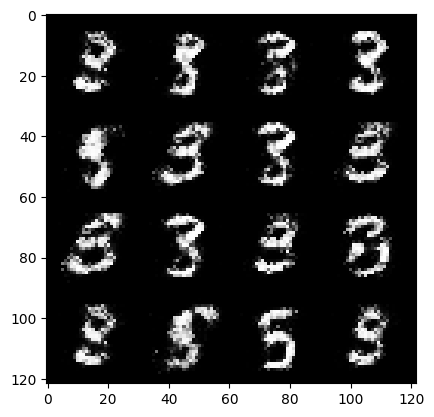

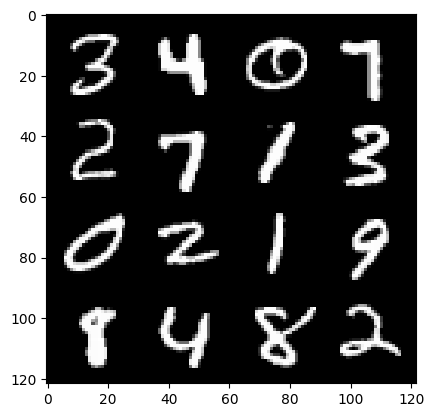

40: step 18900 / Gen loss: 5.6113233757018985 / disc_loss: 0.04054984037143488


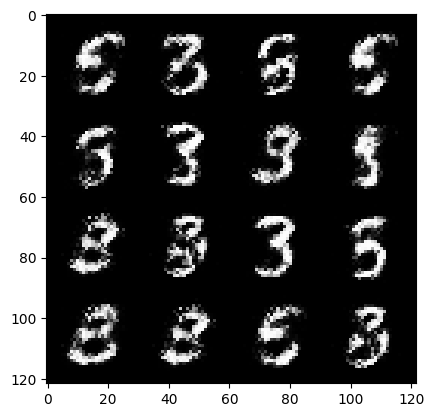

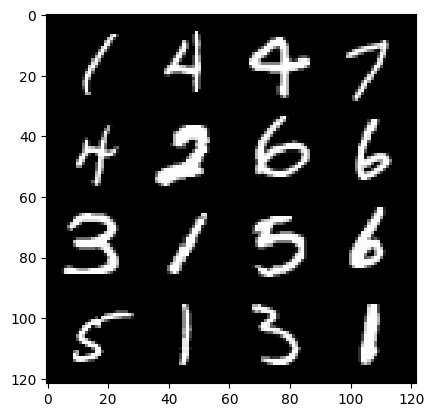

40: step 19200 / Gen loss: 5.4759602769215885 / disc_loss: 0.04677094587435325


  0%|          | 0/469 [00:00<?, ?it/s]

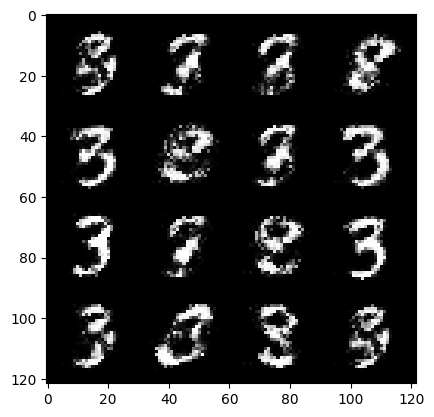

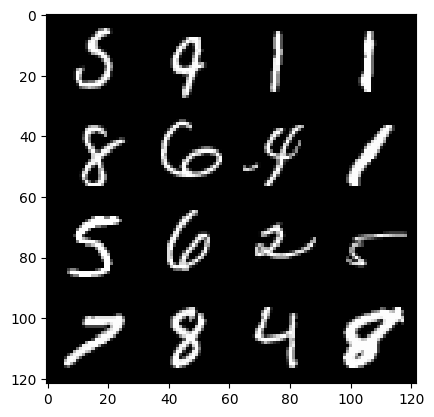

41: step 19500 / Gen loss: 5.572476539611816 / disc_loss: 0.045357855204492814


  0%|          | 0/469 [00:00<?, ?it/s]

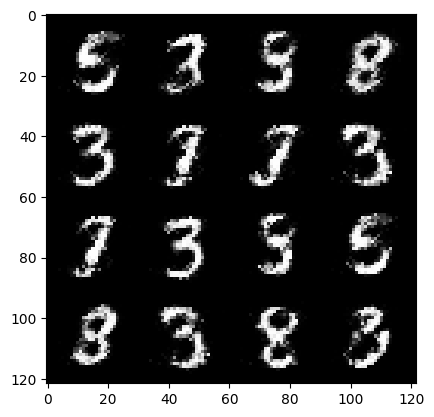

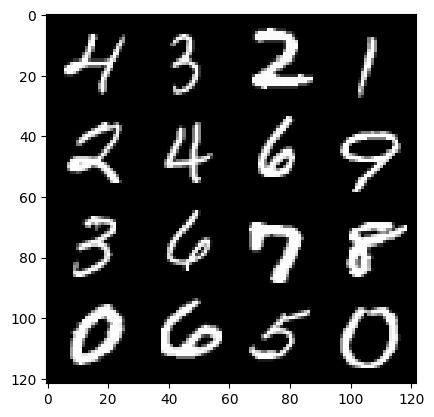

42: step 19800 / Gen loss: 5.857760028839111 / disc_loss: 0.05114965081214904


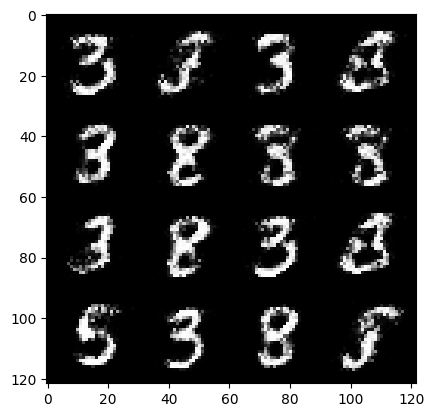

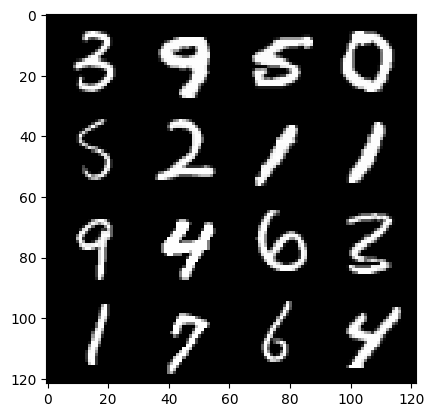

42: step 20100 / Gen loss: 5.411578631401068 / disc_loss: 0.05762477831294141


  0%|          | 0/469 [00:00<?, ?it/s]

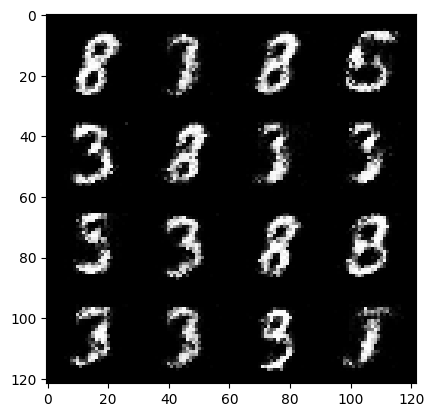

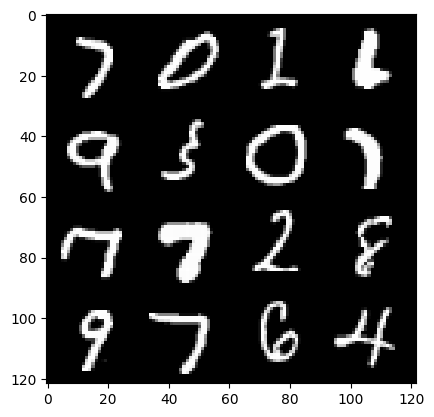

43: step 20400 / Gen loss: 5.287559283574426 / disc_loss: 0.05231452813992894


  0%|          | 0/469 [00:00<?, ?it/s]

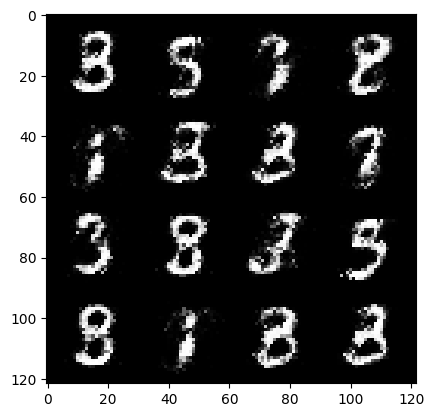

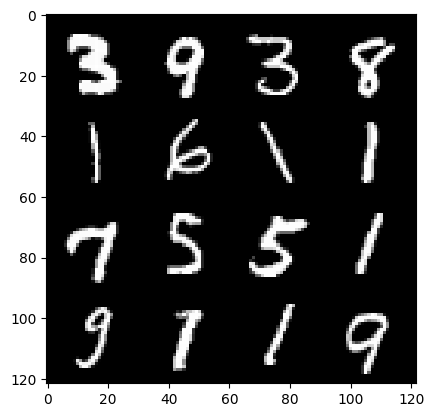

44: step 20700 / Gen loss: 5.054834346771242 / disc_loss: 0.05948954111275572


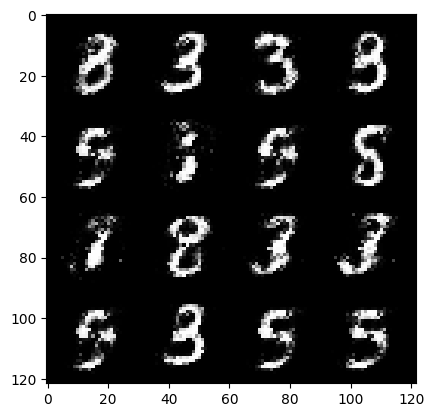

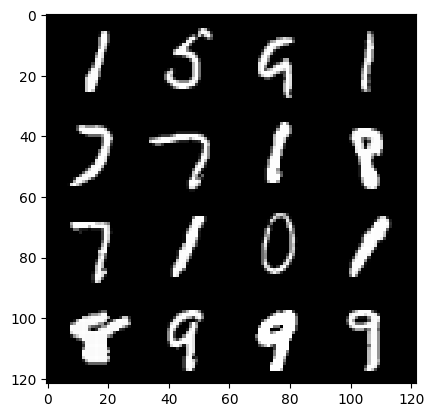

44: step 21000 / Gen loss: 5.150336802800499 / disc_loss: 0.06029686709245047


  0%|          | 0/469 [00:00<?, ?it/s]

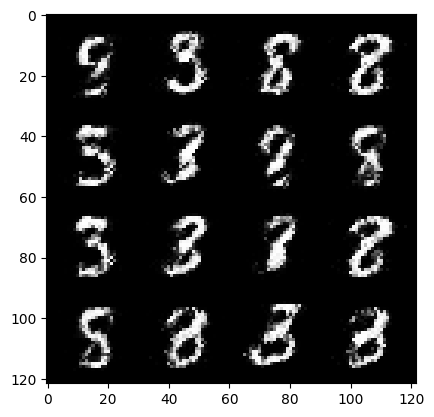

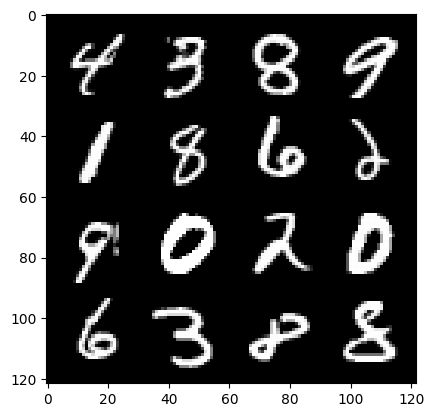

45: step 21300 / Gen loss: 5.1197499505678765 / disc_loss: 0.05640921991008023


  0%|          | 0/469 [00:00<?, ?it/s]

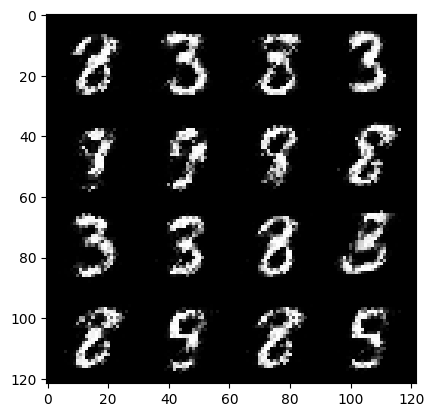

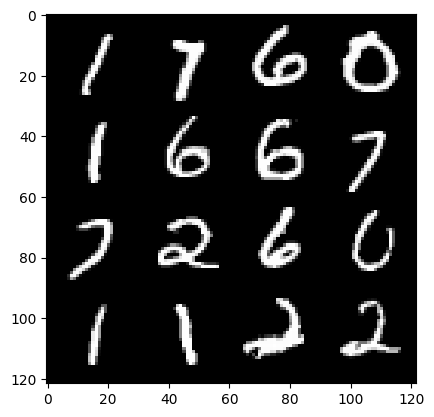

46: step 21600 / Gen loss: 5.159248681863151 / disc_loss: 0.0553804467152804


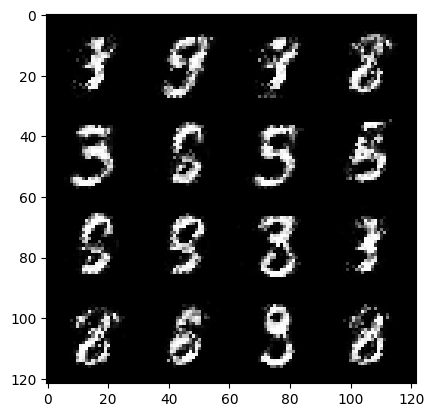

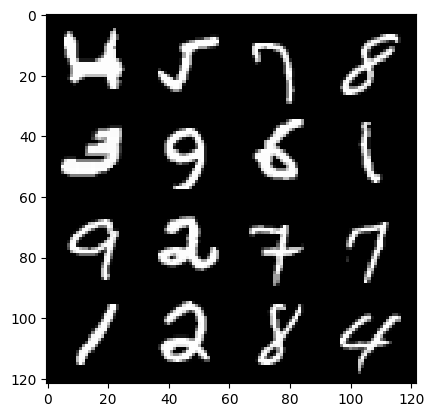

46: step 21900 / Gen loss: 5.188438984553014 / disc_loss: 0.05852013529278335


  0%|          | 0/469 [00:00<?, ?it/s]

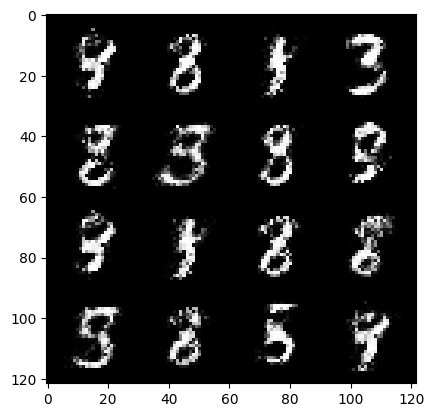

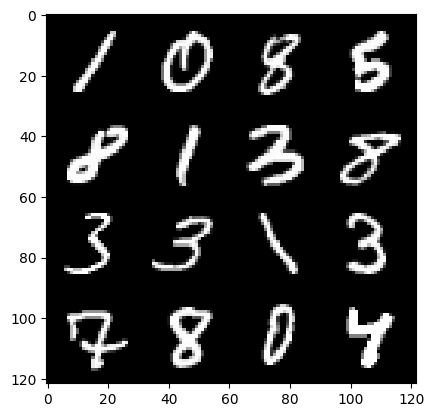

47: step 22200 / Gen loss: 4.952038280963902 / disc_loss: 0.0743185171981652


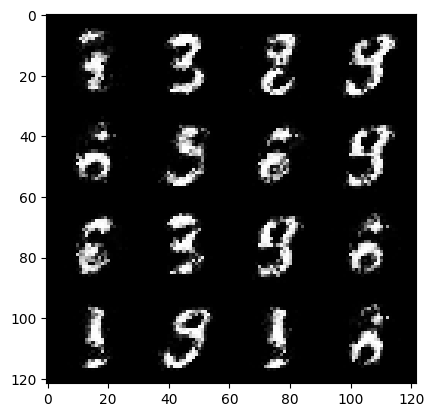

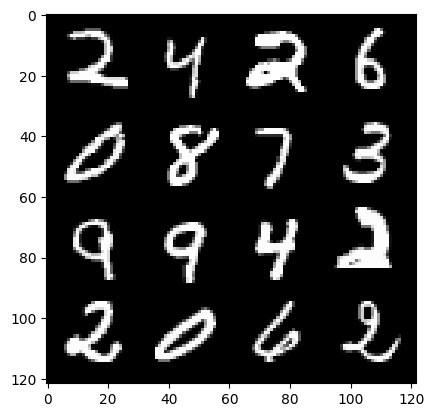

47: step 22500 / Gen loss: 4.9082475709915165 / disc_loss: 0.07837864886969324


  0%|          | 0/469 [00:00<?, ?it/s]

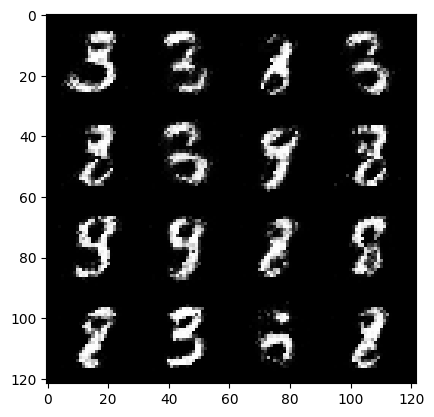

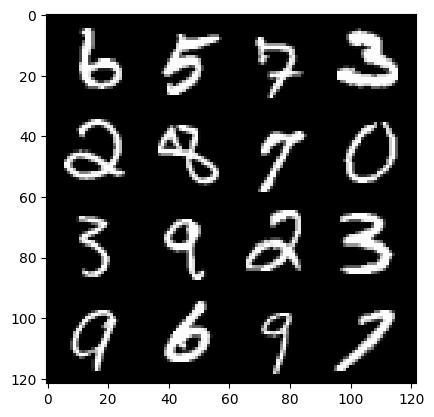

48: step 22800 / Gen loss: 5.191573133468631 / disc_loss: 0.07037644273291034


  0%|          | 0/469 [00:00<?, ?it/s]

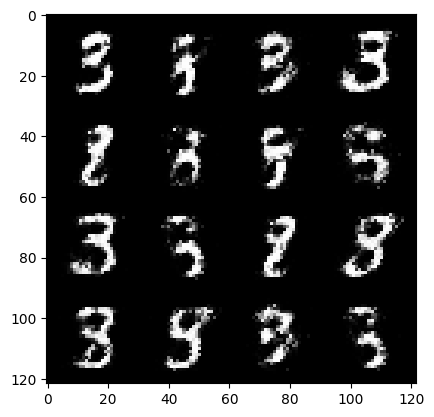

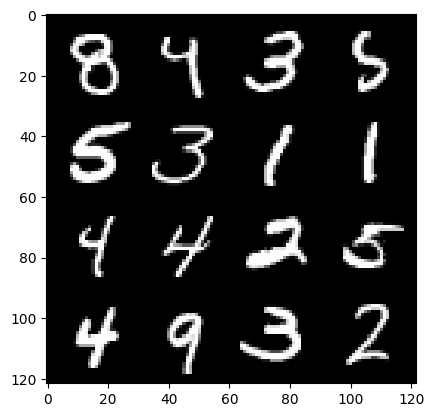

49: step 23100 / Gen loss: 4.968112653096512 / disc_loss: 0.07249208120629184


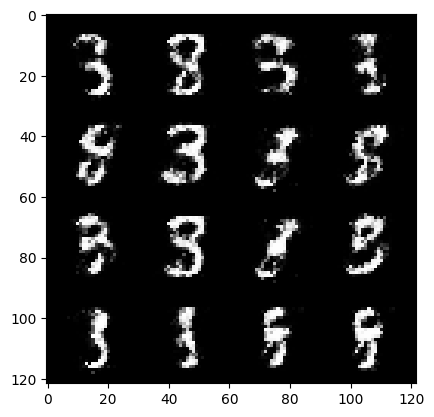

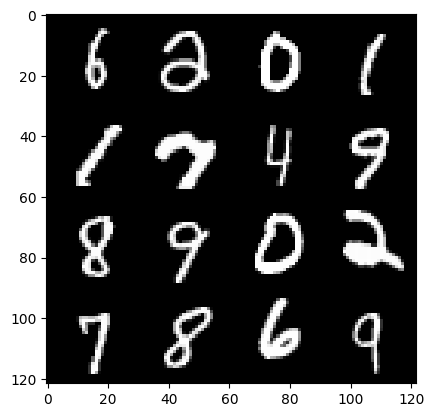

49: step 23400 / Gen loss: 5.084121563434604 / disc_loss: 0.058100959261258425


  0%|          | 0/469 [00:00<?, ?it/s]

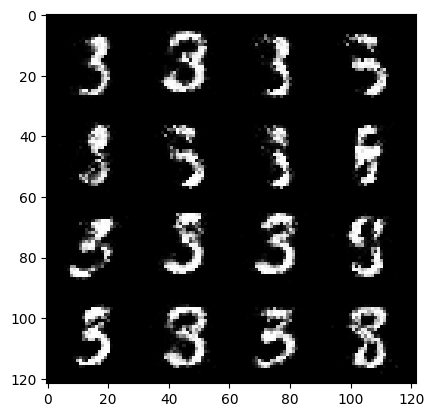

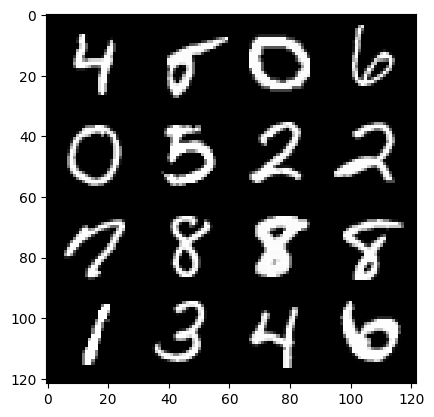

50: step 23700 / Gen loss: 5.044937006632485 / disc_loss: 0.061267519332468504


  0%|          | 0/469 [00:00<?, ?it/s]

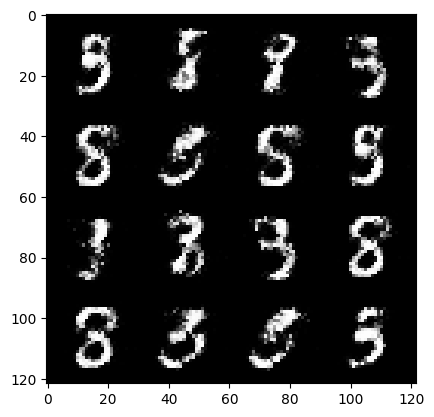

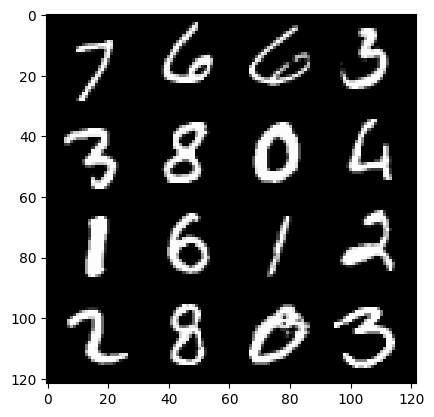

51: step 24000 / Gen loss: 4.8871882192293805 / disc_loss: 0.06455793790519238


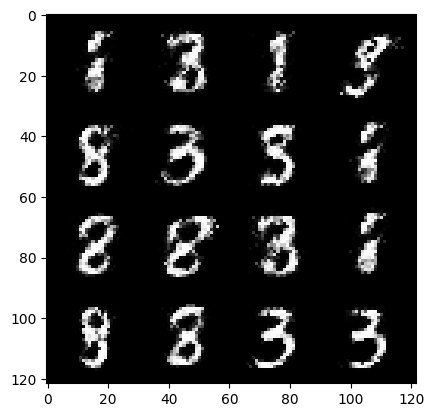

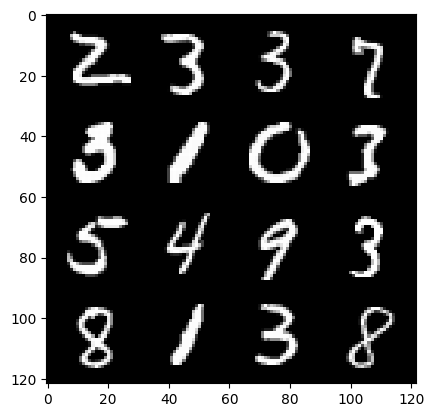

51: step 24300 / Gen loss: 4.798471525510152 / disc_loss: 0.06366990136603513


  0%|          | 0/469 [00:00<?, ?it/s]

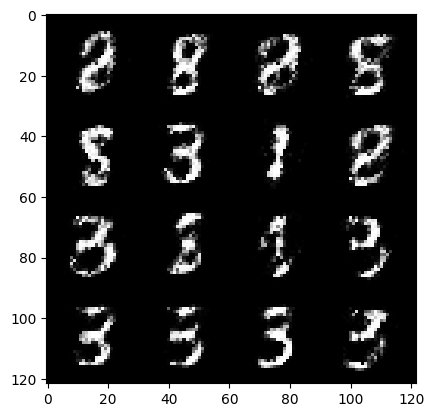

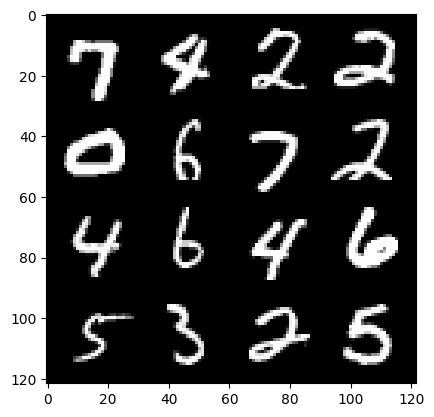

52: step 24600 / Gen loss: 4.751260251998899 / disc_loss: 0.07276442322880027


  0%|          | 0/469 [00:00<?, ?it/s]

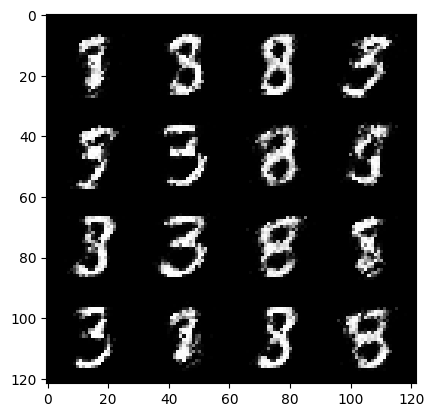

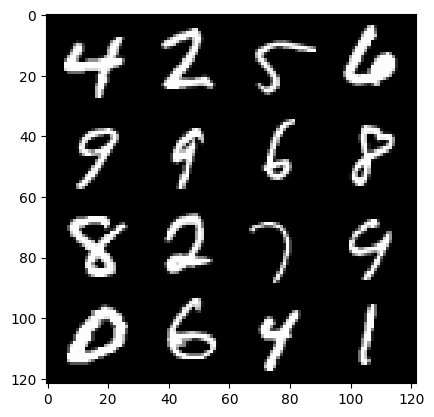

53: step 24900 / Gen loss: 4.710895351568856 / disc_loss: 0.080070596554627


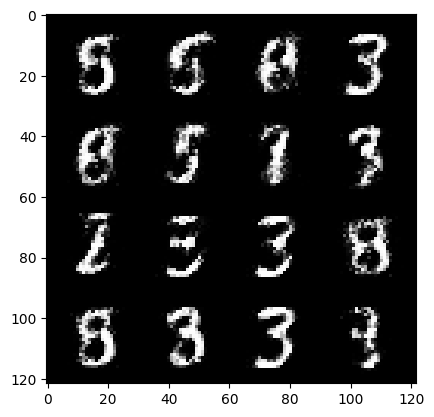

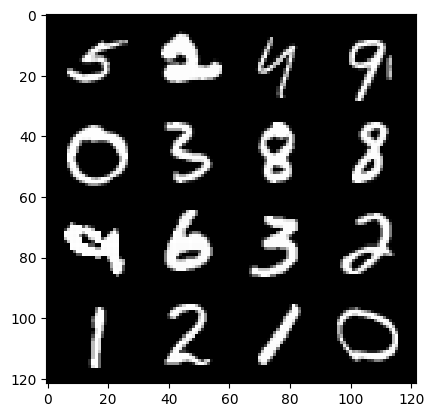

53: step 25200 / Gen loss: 4.745771316687265 / disc_loss: 0.08104212306439877


  0%|          | 0/469 [00:00<?, ?it/s]

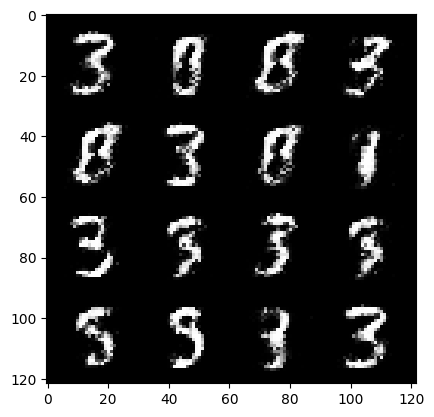

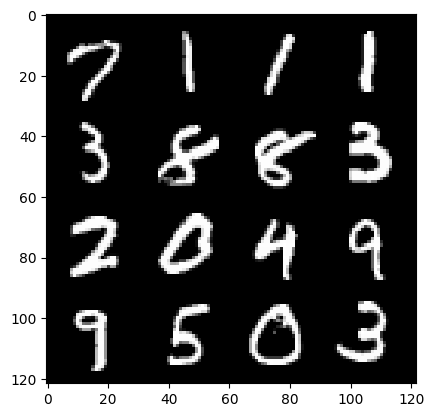

54: step 25500 / Gen loss: 4.763481996059413 / disc_loss: 0.07728384235252933


  0%|          | 0/469 [00:00<?, ?it/s]

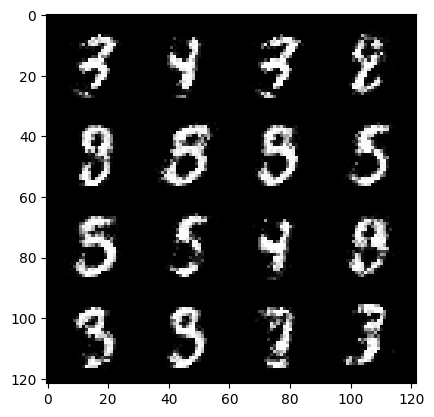

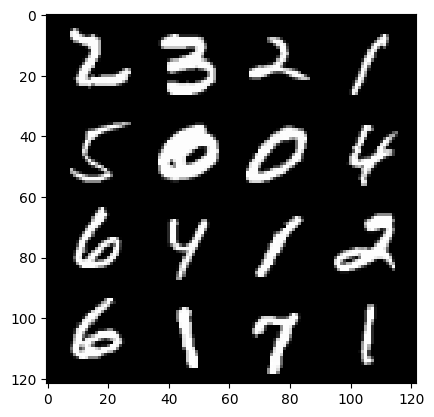

55: step 25800 / Gen loss: 4.668343979517617 / disc_loss: 0.08031657132009665


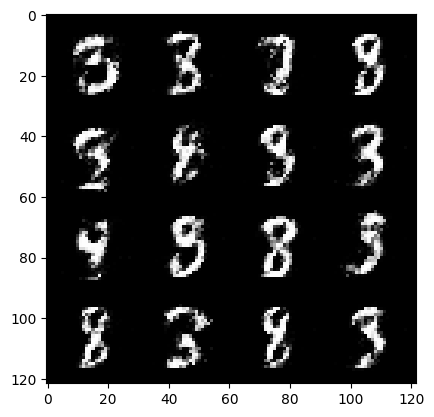

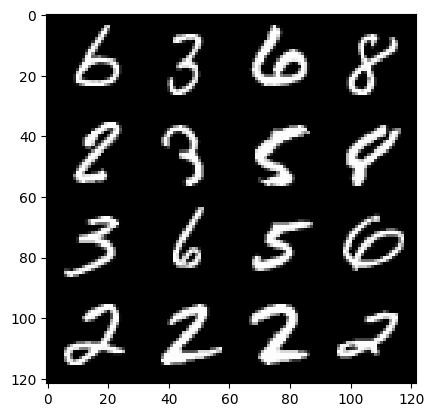

55: step 26100 / Gen loss: 4.693195766607921 / disc_loss: 0.08131741295879086


  0%|          | 0/469 [00:00<?, ?it/s]

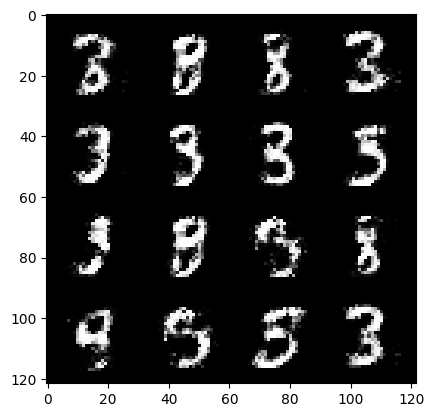

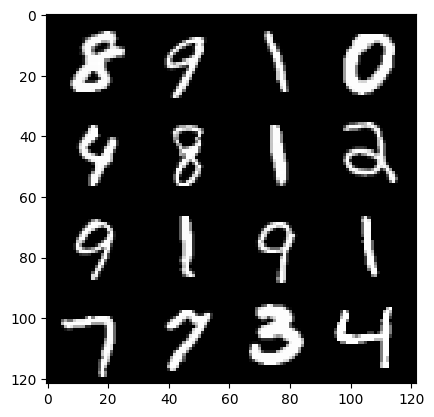

56: step 26400 / Gen loss: 4.591852641105651 / disc_loss: 0.10618178834517795


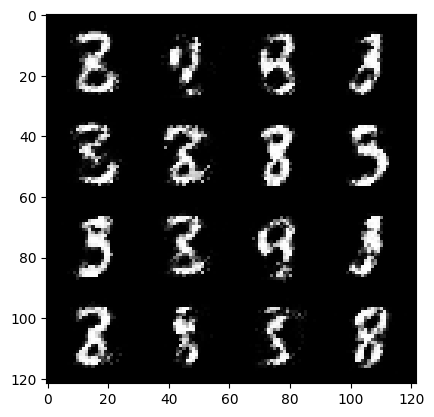

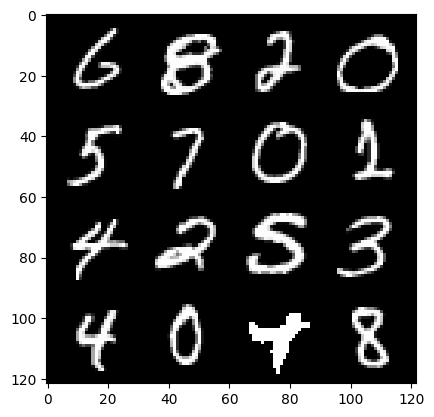

56: step 26700 / Gen loss: 4.3885754577318785 / disc_loss: 0.10416403698424496


  0%|          | 0/469 [00:00<?, ?it/s]

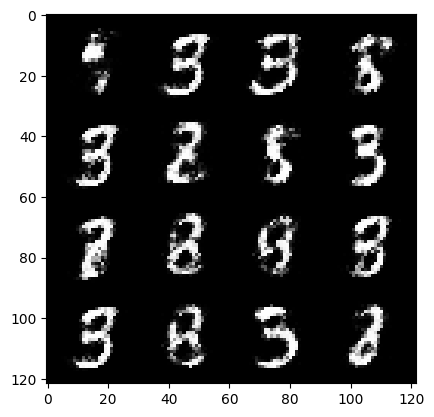

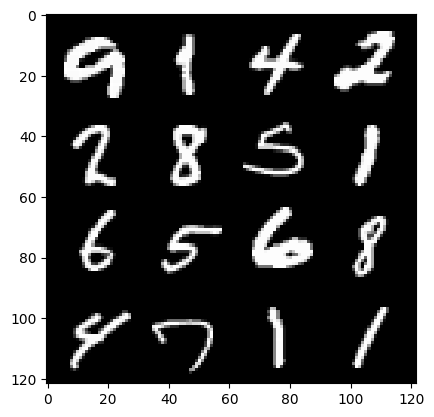

57: step 27000 / Gen loss: 4.3681238897641474 / disc_loss: 0.09718528083215161


  0%|          | 0/469 [00:00<?, ?it/s]

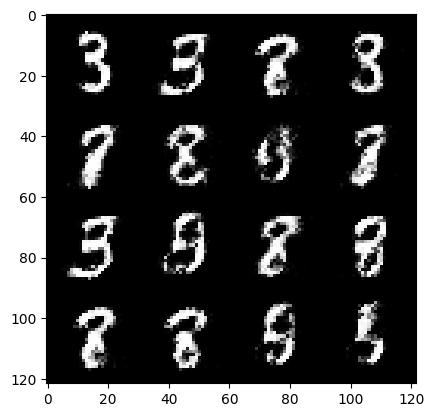

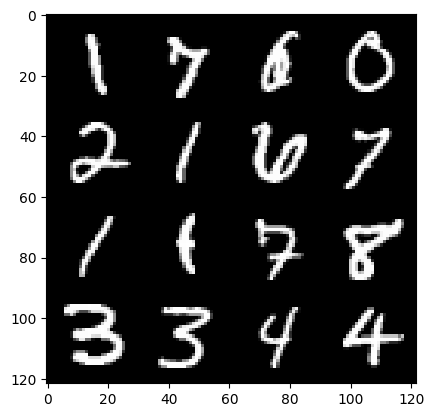

58: step 27300 / Gen loss: 4.3572676547368365 / disc_loss: 0.1059709456438819


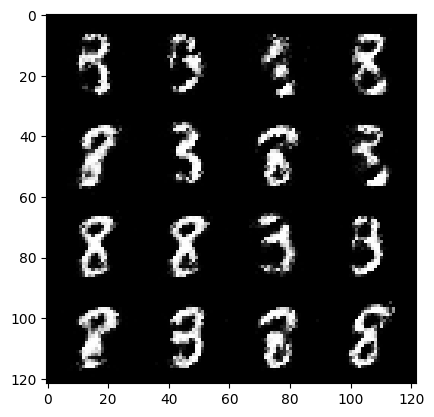

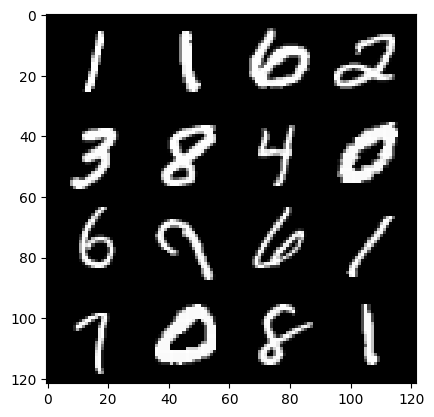

58: step 27600 / Gen loss: 4.4997347370783505 / disc_loss: 0.09647817714760697


  0%|          | 0/469 [00:00<?, ?it/s]

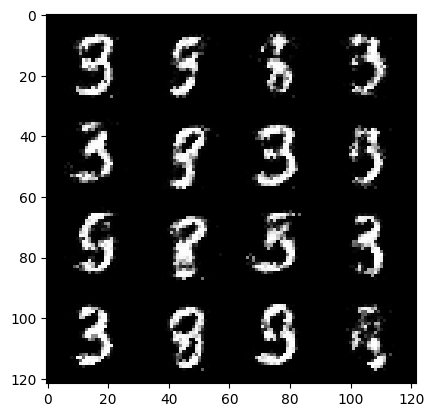

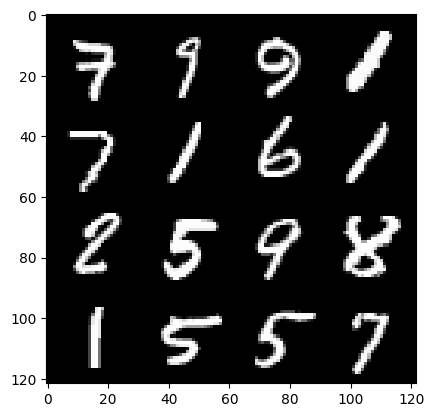

59: step 27900 / Gen loss: 4.413402334849042 / disc_loss: 0.09874606803059578


  0%|          | 0/469 [00:00<?, ?it/s]

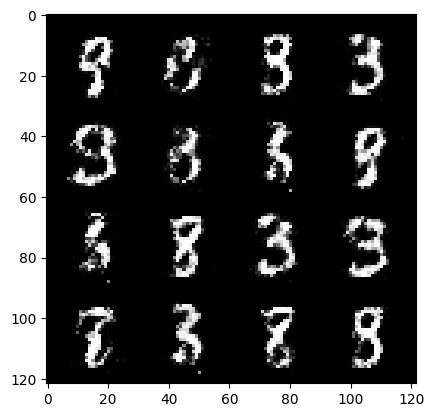

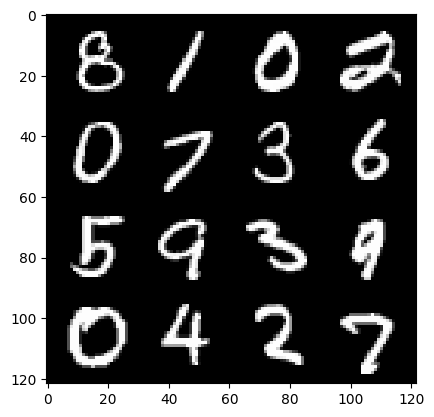

60: step 28200 / Gen loss: 4.521245830853778 / disc_loss: 0.1002146618316571


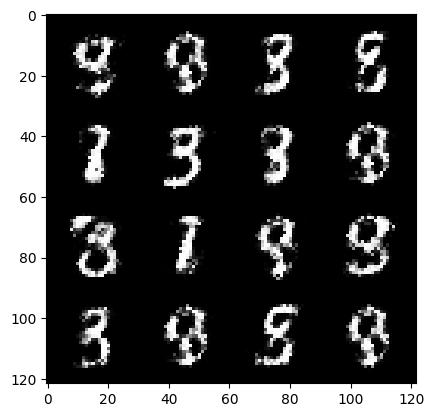

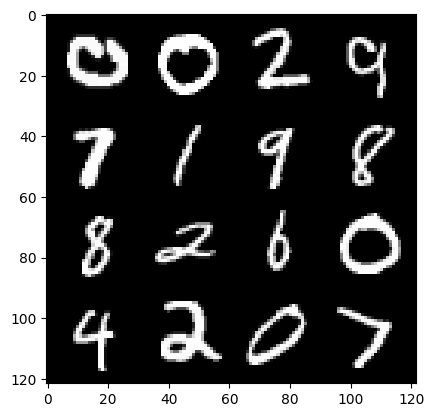

60: step 28500 / Gen loss: 4.267144154707589 / disc_loss: 0.11258721270908906


  0%|          | 0/469 [00:00<?, ?it/s]

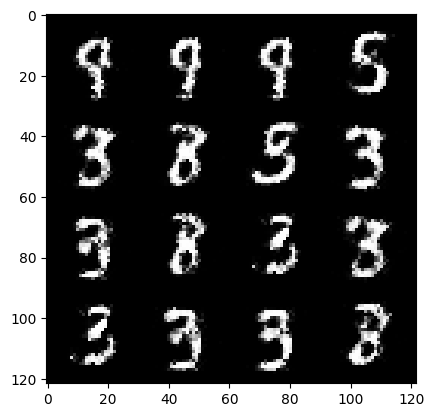

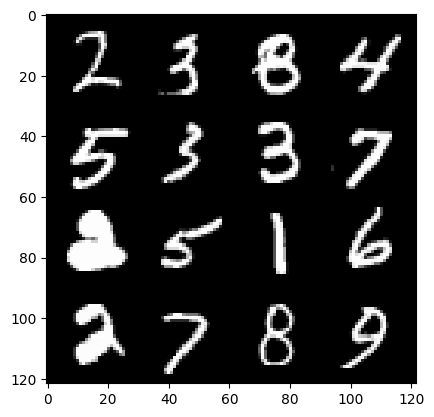

61: step 28800 / Gen loss: 4.352127856413525 / disc_loss: 0.1120204962790012


  0%|          | 0/469 [00:00<?, ?it/s]

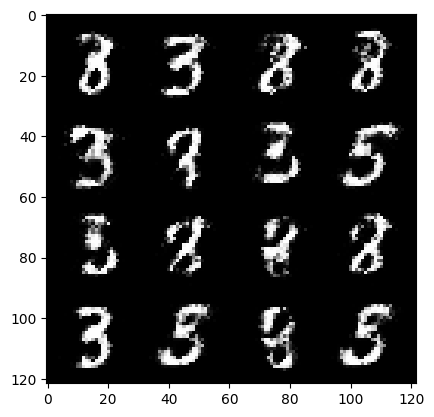

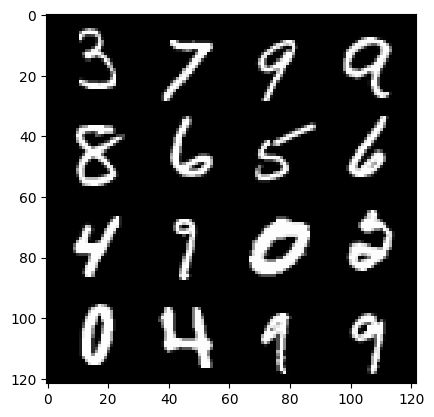

62: step 29100 / Gen loss: 4.222346251010894 / disc_loss: 0.10816371777405348


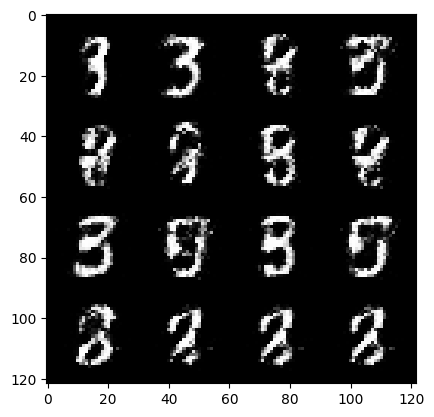

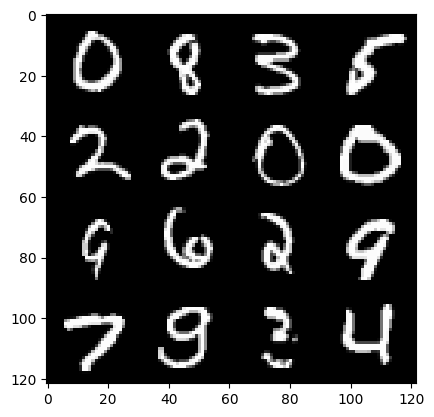

62: step 29400 / Gen loss: 4.2527109909057605 / disc_loss: 0.10427376292645926


  0%|          | 0/469 [00:00<?, ?it/s]

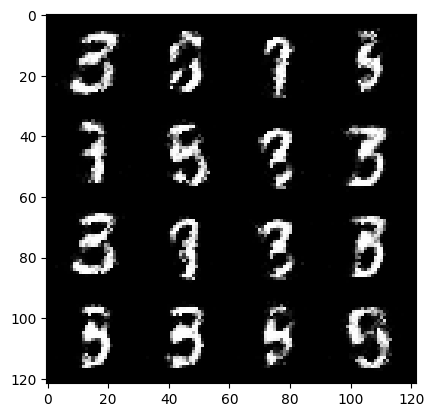

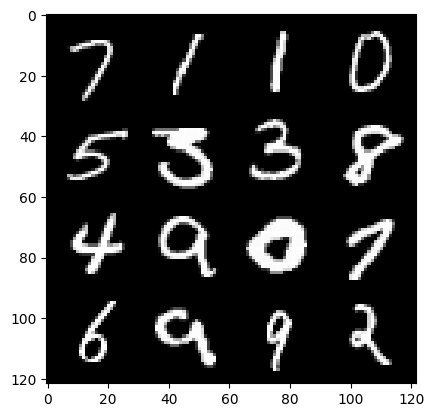

63: step 29700 / Gen loss: 4.3508838129043585 / disc_loss: 0.09660867660616831


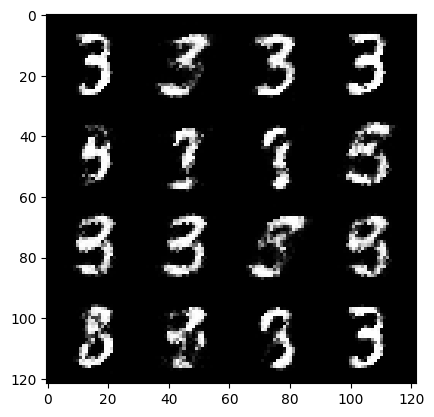

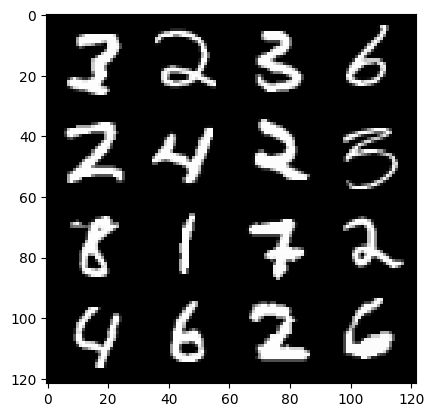

63: step 30000 / Gen loss: 4.270377659002938 / disc_loss: 0.11312953749050692


  0%|          | 0/469 [00:00<?, ?it/s]

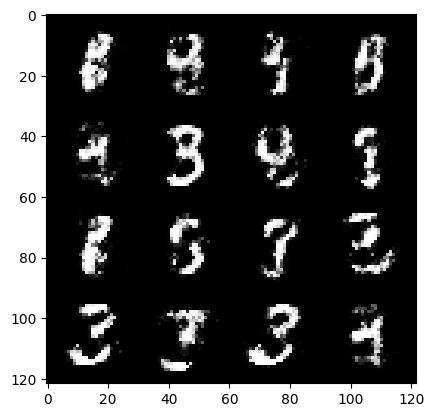

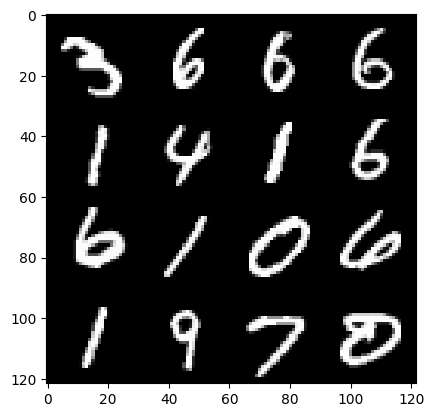

64: step 30300 / Gen loss: 4.226871435642241 / disc_loss: 0.10879218641668553


  0%|          | 0/469 [00:00<?, ?it/s]

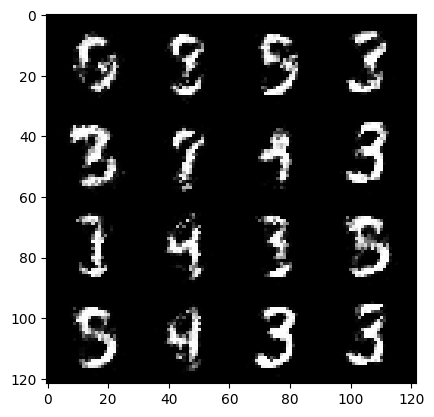

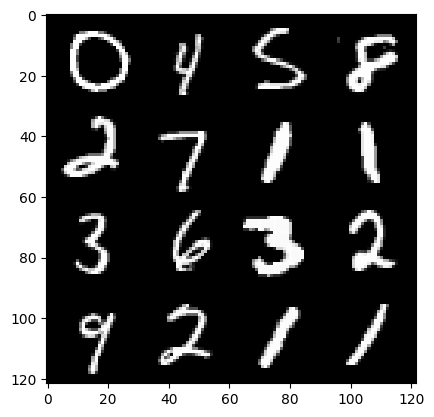

65: step 30600 / Gen loss: 4.454781347115831 / disc_loss: 0.10766201669971144


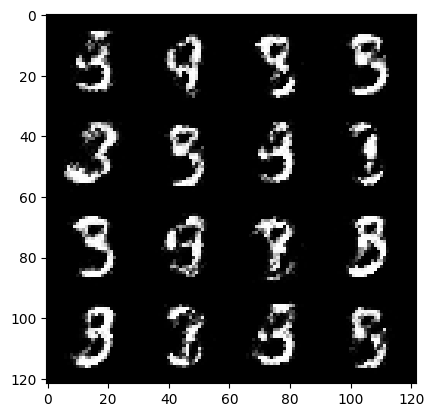

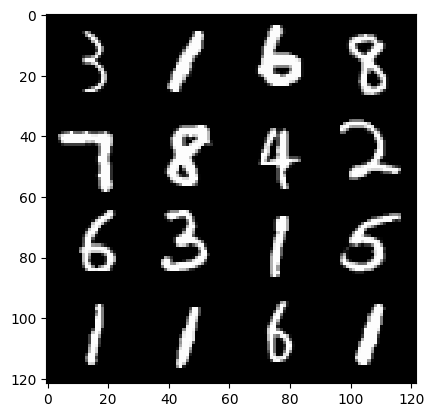

65: step 30900 / Gen loss: 4.295791389147436 / disc_loss: 0.09798546407371768


  0%|          | 0/469 [00:00<?, ?it/s]

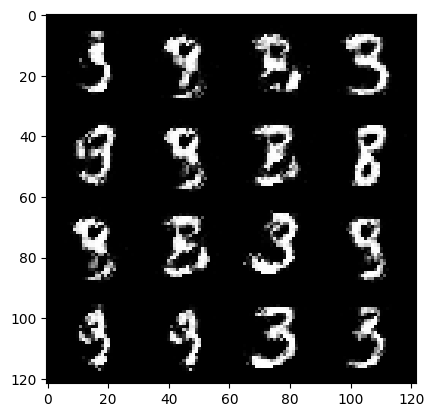

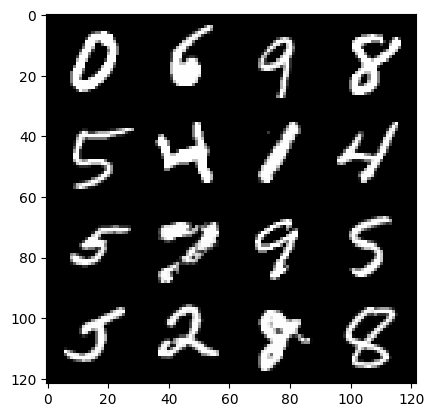

66: step 31200 / Gen loss: 4.2036290359497075 / disc_loss: 0.10324063849324976


  0%|          | 0/469 [00:00<?, ?it/s]

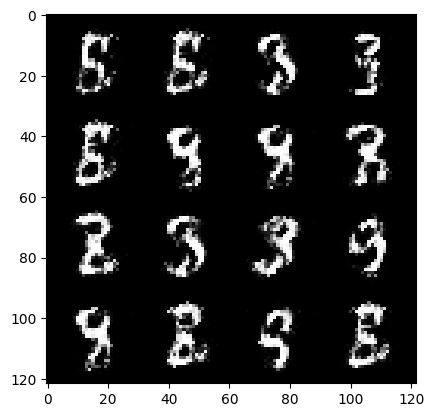

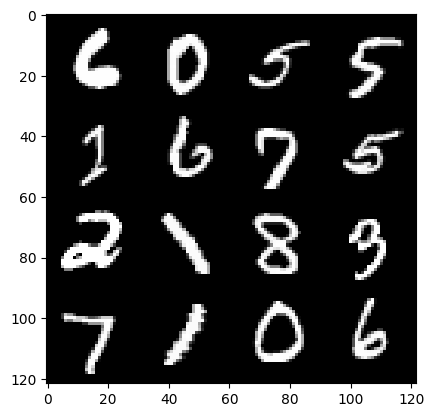

67: step 31500 / Gen loss: 4.294593470891317 / disc_loss: 0.09257618996004263


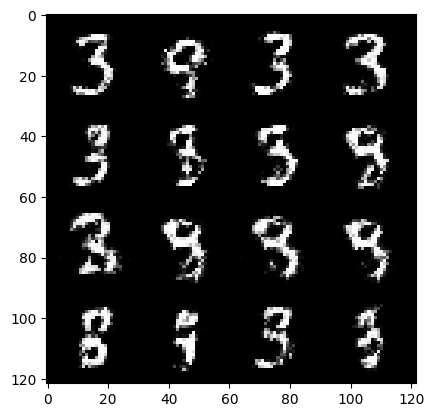

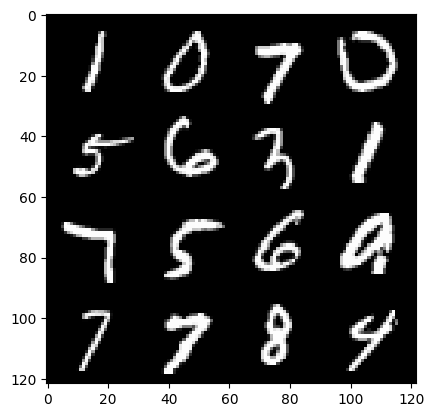

67: step 31800 / Gen loss: 4.418149304389951 / disc_loss: 0.09243455070381362


  0%|          | 0/469 [00:00<?, ?it/s]

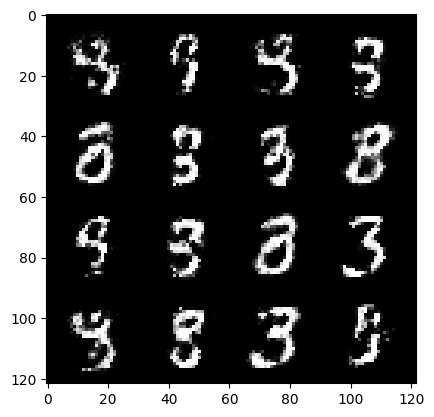

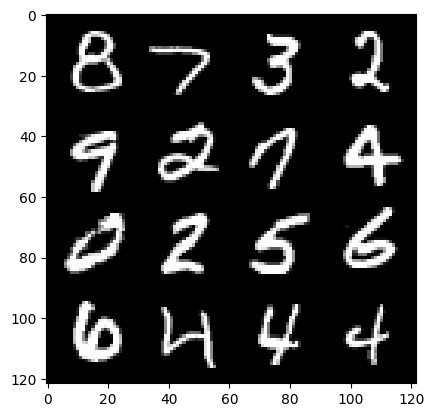

68: step 32100 / Gen loss: 4.523595797220866 / disc_loss: 0.09936438662931313


  0%|          | 0/469 [00:00<?, ?it/s]

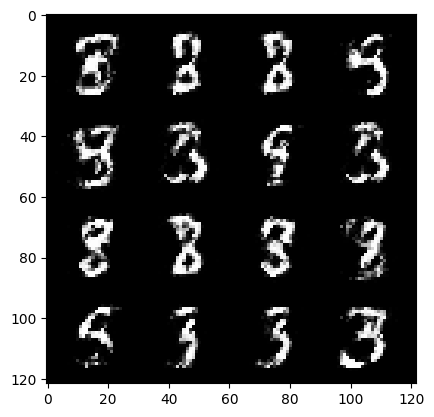

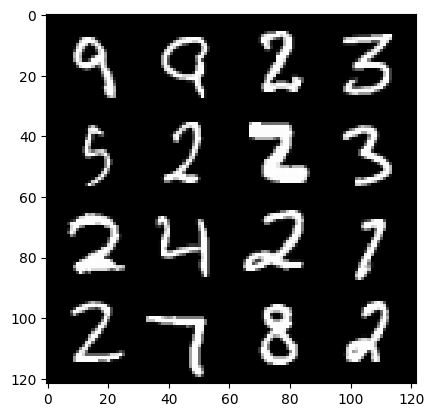

69: step 32400 / Gen loss: 4.116059191226955 / disc_loss: 0.1098739250376821


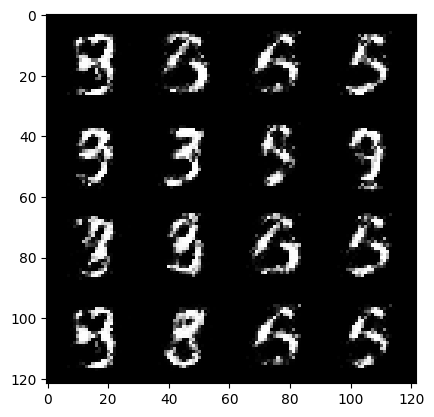

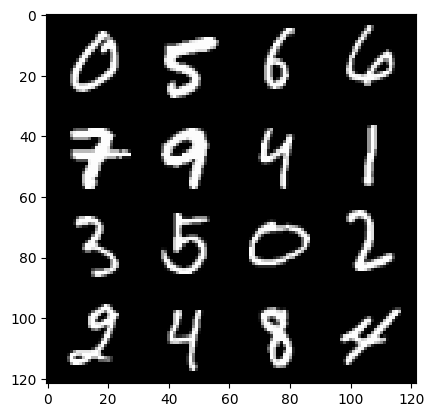

69: step 32700 / Gen loss: 4.201393919785821 / disc_loss: 0.09863903718690081


  0%|          | 0/469 [00:00<?, ?it/s]

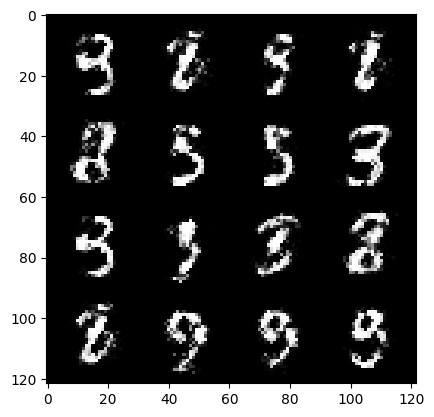

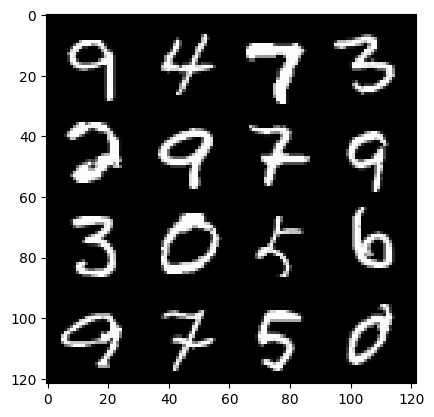

70: step 33000 / Gen loss: 4.158598256905876 / disc_loss: 0.10143712966392436


  0%|          | 0/469 [00:00<?, ?it/s]

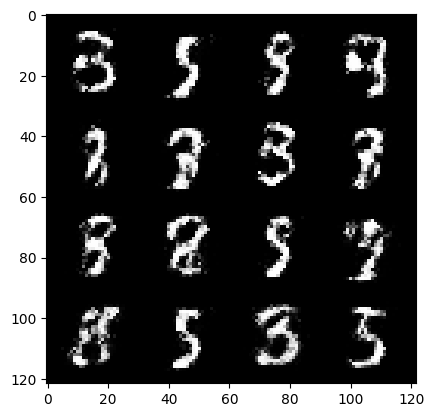

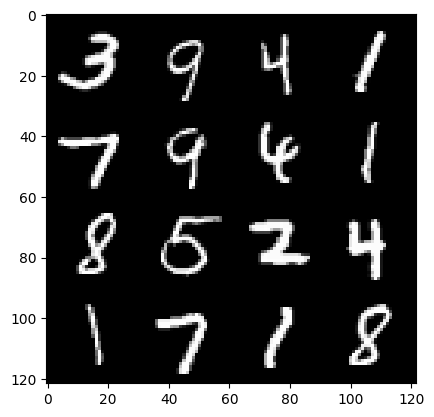

71: step 33300 / Gen loss: 4.212867618401845 / disc_loss: 0.11520635303109879


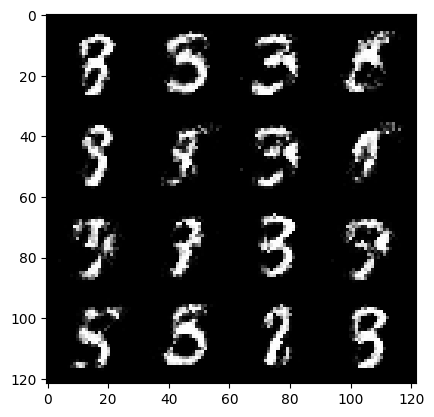

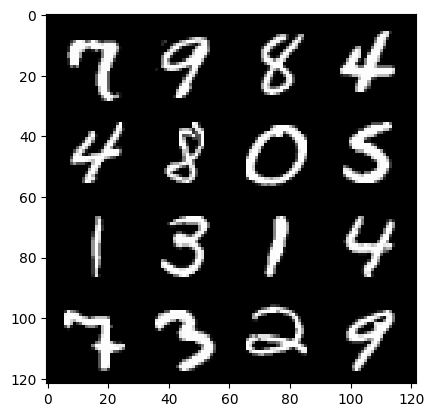

71: step 33600 / Gen loss: 4.010787579218546 / disc_loss: 0.14525583277146034


  0%|          | 0/469 [00:00<?, ?it/s]

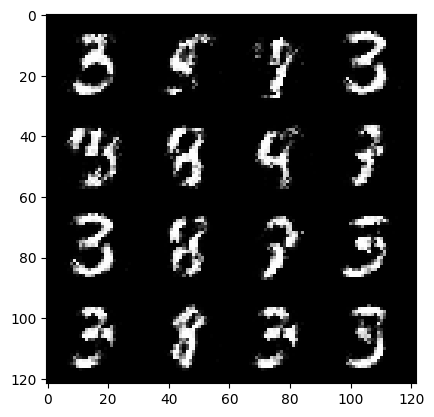

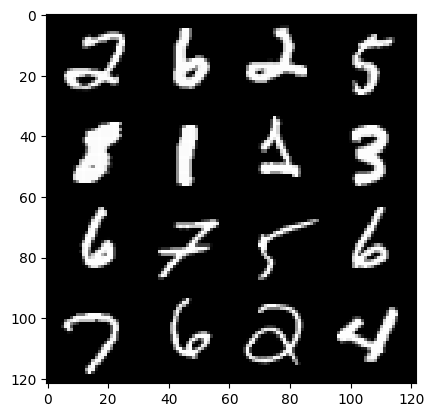

72: step 33900 / Gen loss: 3.954541379610696 / disc_loss: 0.12148365837832296


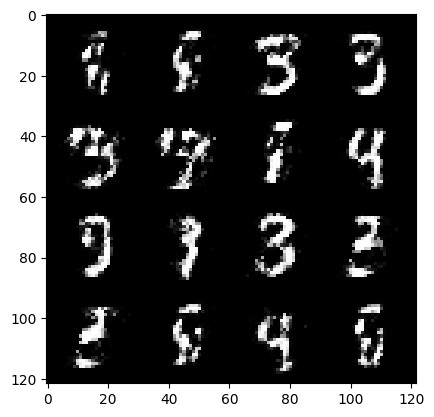

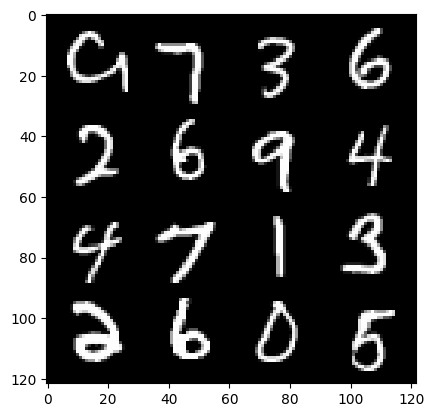

72: step 34200 / Gen loss: 4.032051101525626 / disc_loss: 0.1215552964309851


  0%|          | 0/469 [00:00<?, ?it/s]

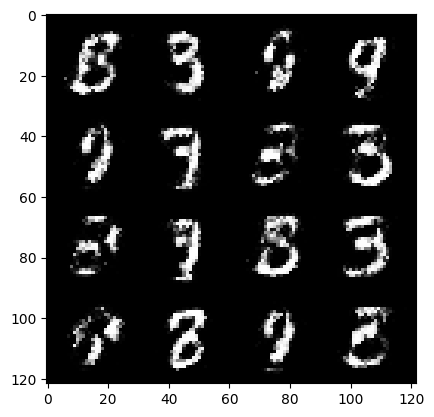

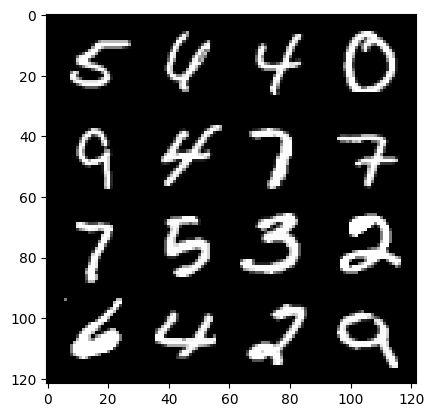

73: step 34500 / Gen loss: 4.1979805811246225 / disc_loss: 0.1138345193987091


  0%|          | 0/469 [00:00<?, ?it/s]

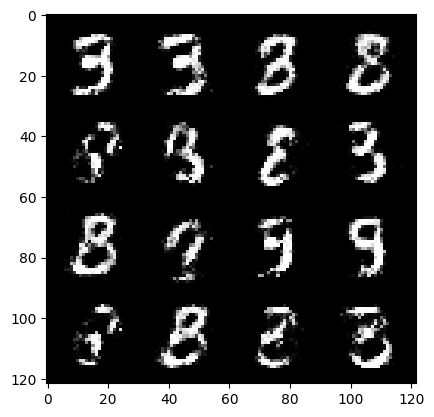

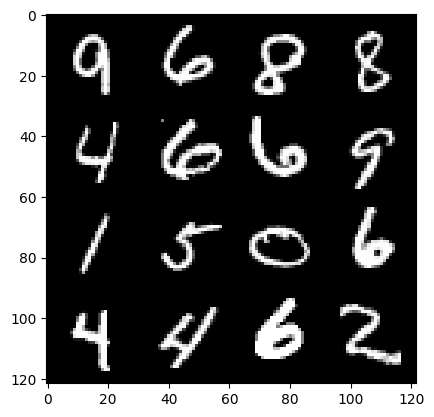

74: step 34800 / Gen loss: 3.949412153561912 / disc_loss: 0.11781057024995485


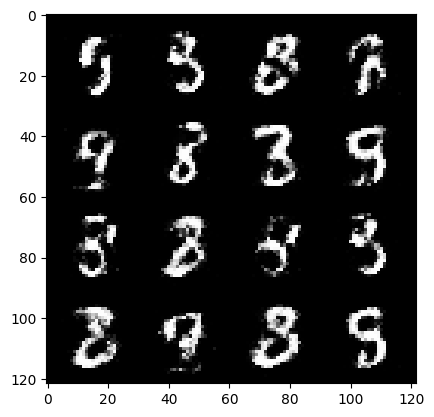

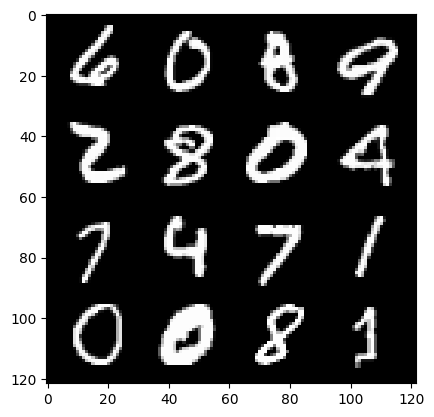

74: step 35100 / Gen loss: 3.9774901167551686 / disc_loss: 0.1065417239318291


  0%|          | 0/469 [00:00<?, ?it/s]

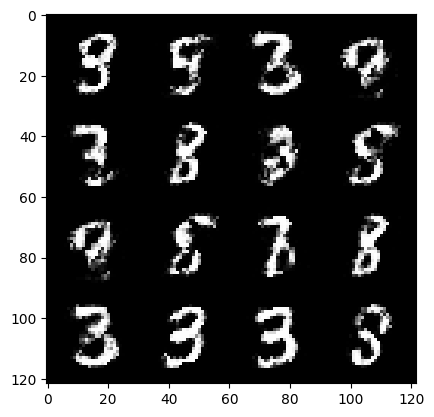

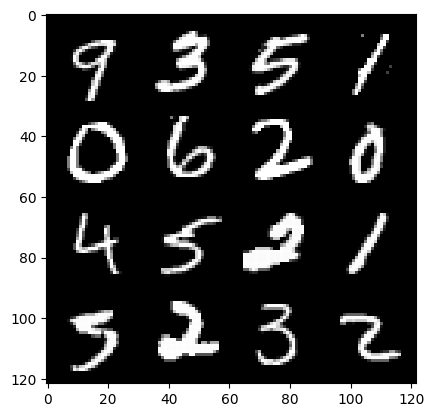

75: step 35400 / Gen loss: 4.118654611905415 / disc_loss: 0.11479609683156015


  0%|          | 0/469 [00:00<?, ?it/s]

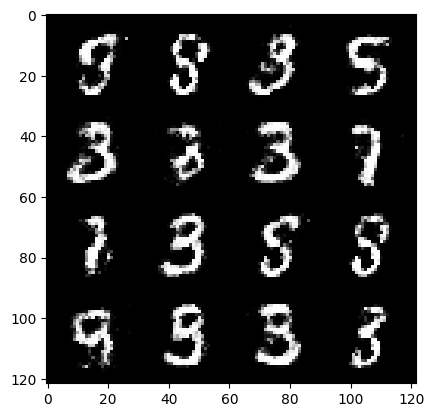

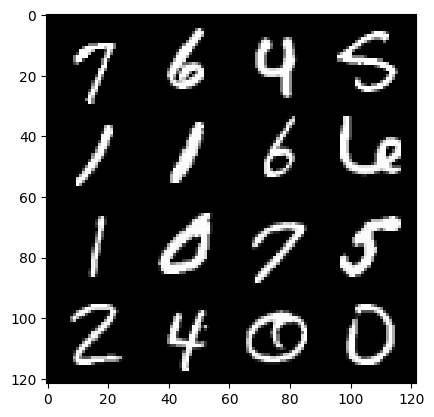

76: step 35700 / Gen loss: 4.06930318593979 / disc_loss: 0.11792518797020121


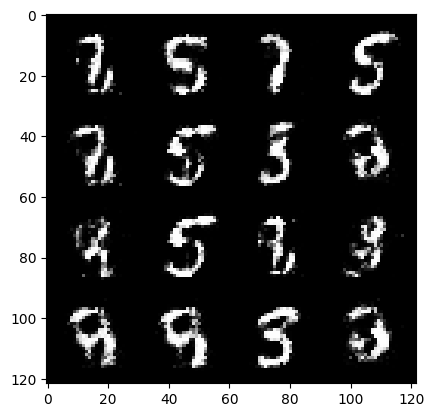

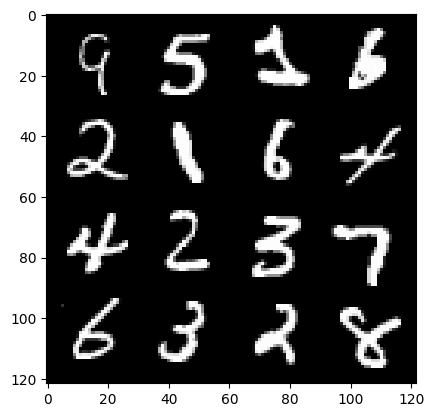

76: step 36000 / Gen loss: 4.077002305189771 / disc_loss: 0.120676181850334


  0%|          | 0/469 [00:00<?, ?it/s]

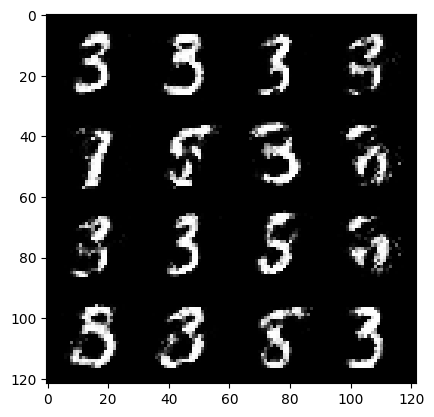

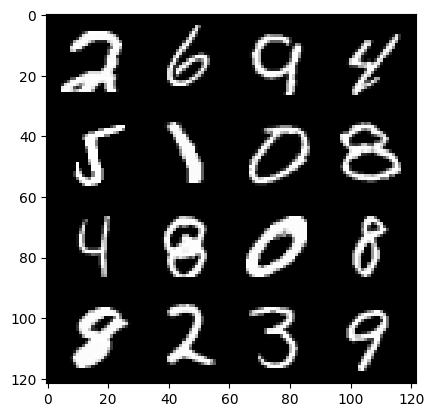

77: step 36300 / Gen loss: 3.9812052456537876 / disc_loss: 0.11792223725467922


  0%|          | 0/469 [00:00<?, ?it/s]

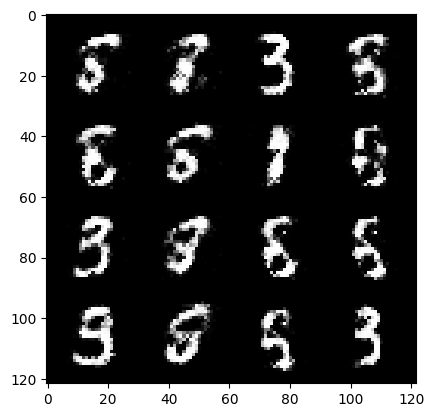

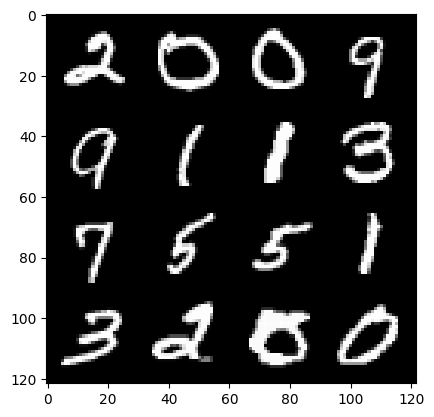

78: step 36600 / Gen loss: 4.044902094205221 / disc_loss: 0.12363451398909088


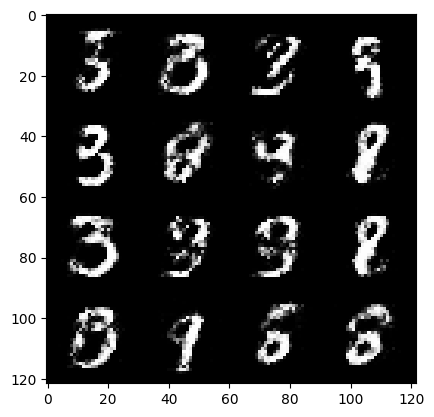

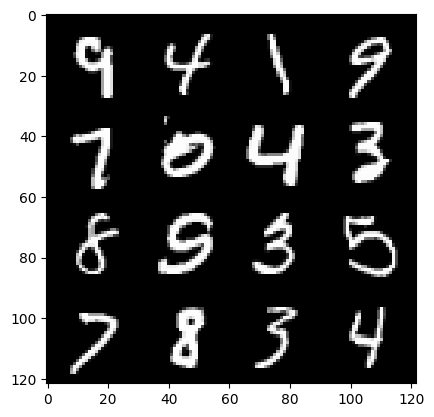

78: step 36900 / Gen loss: 3.845326554775239 / disc_loss: 0.1446310332417488


  0%|          | 0/469 [00:00<?, ?it/s]

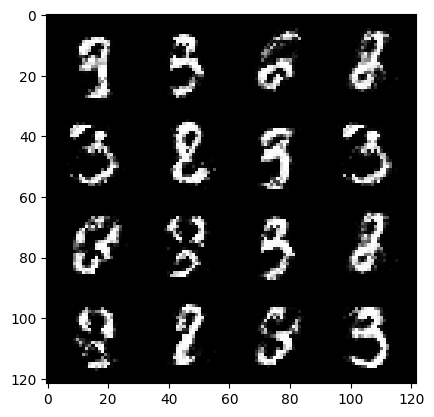

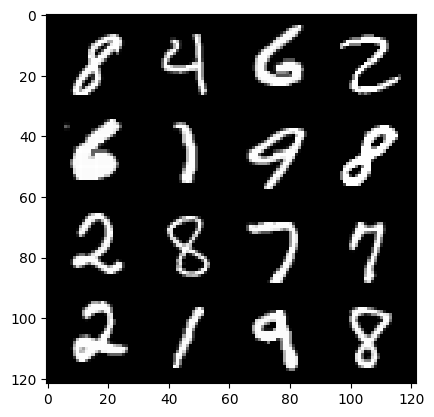

79: step 37200 / Gen loss: 4.048143159548443 / disc_loss: 0.12155352577567097


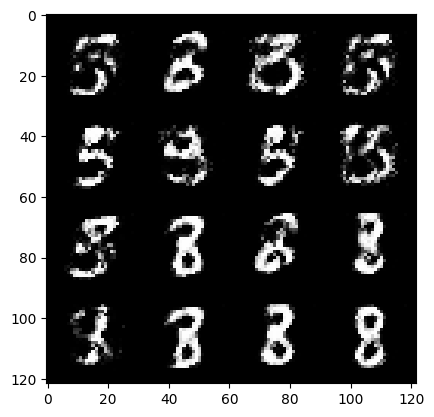

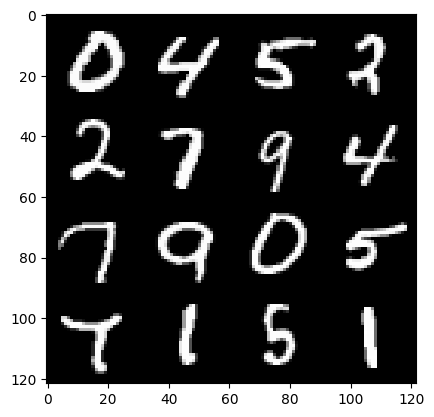

79: step 37500 / Gen loss: 3.894522162278493 / disc_loss: 0.16533958983918037


  0%|          | 0/469 [00:00<?, ?it/s]

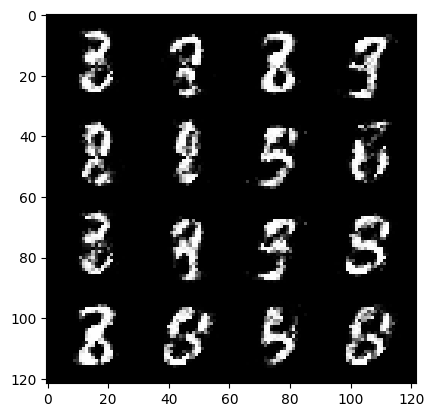

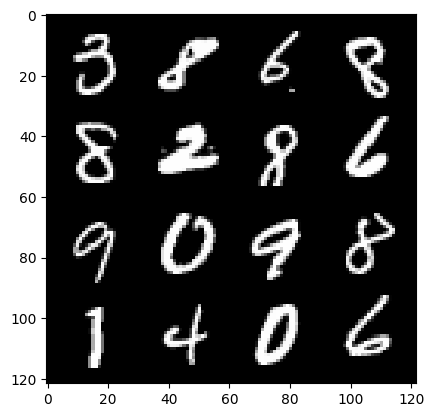

80: step 37800 / Gen loss: 3.7614840189615855 / disc_loss: 0.13257698732117798


  0%|          | 0/469 [00:00<?, ?it/s]

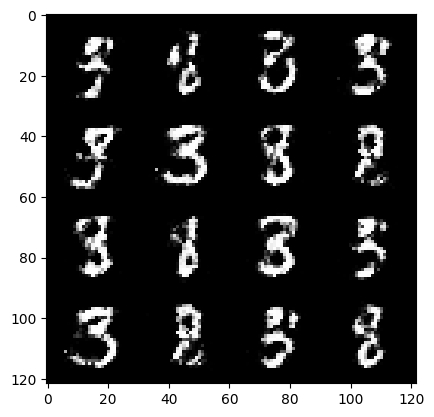

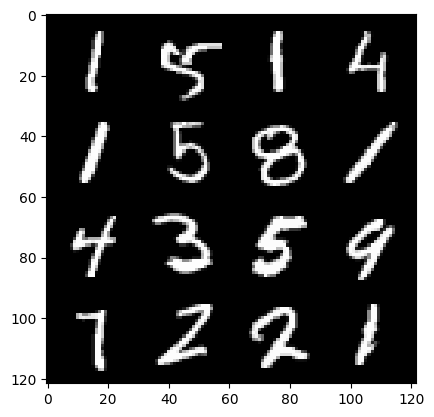

81: step 38100 / Gen loss: 3.8498025504748004 / disc_loss: 0.12312724065035582


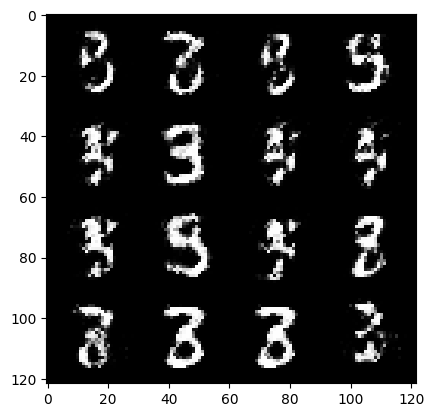

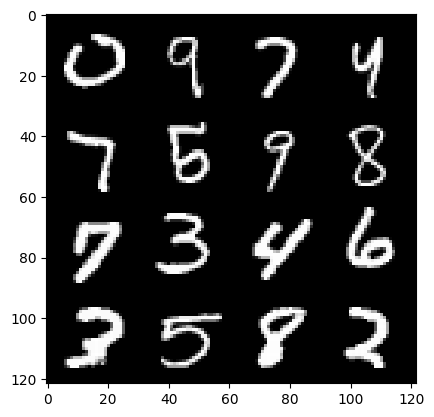

81: step 38400 / Gen loss: 3.7789338612556453 / disc_loss: 0.13784675167252625


  0%|          | 0/469 [00:00<?, ?it/s]

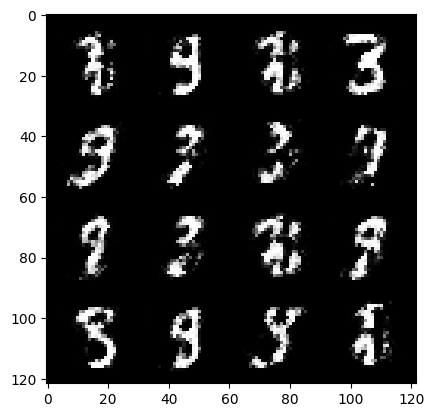

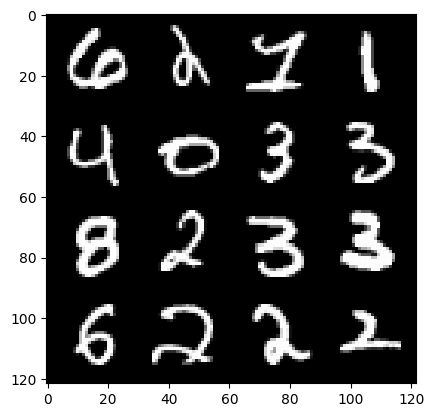

82: step 38700 / Gen loss: 3.730392510890959 / disc_loss: 0.15915218980362006


  0%|          | 0/469 [00:00<?, ?it/s]

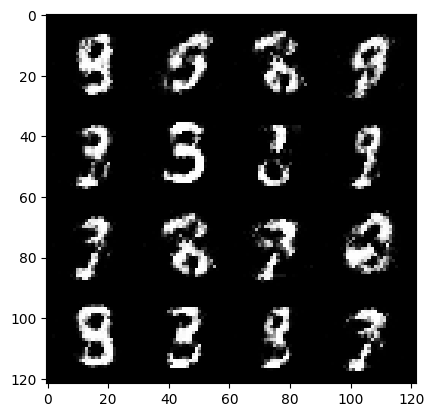

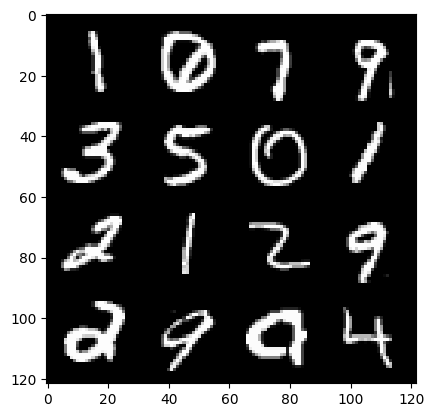

83: step 39000 / Gen loss: 3.7343914477030444 / disc_loss: 0.16727981480459372


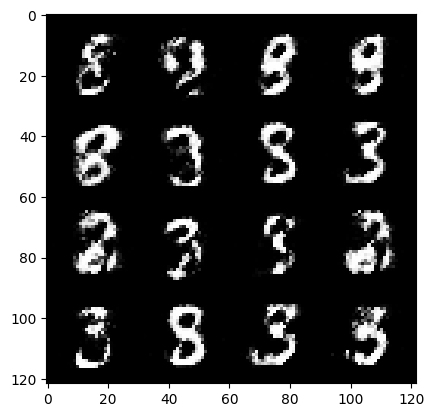

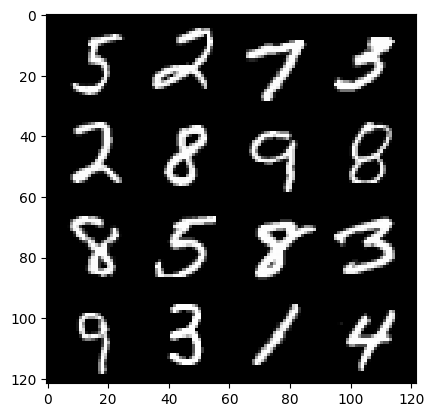

83: step 39300 / Gen loss: 3.476319386959076 / disc_loss: 0.17358212910592558


  0%|          | 0/469 [00:00<?, ?it/s]

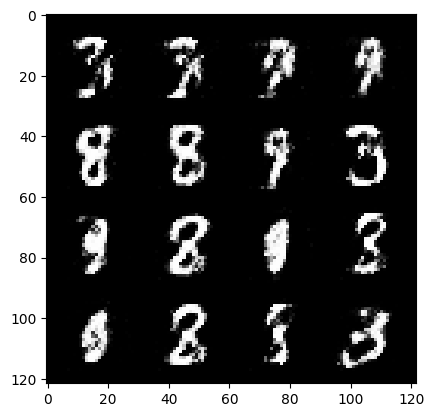

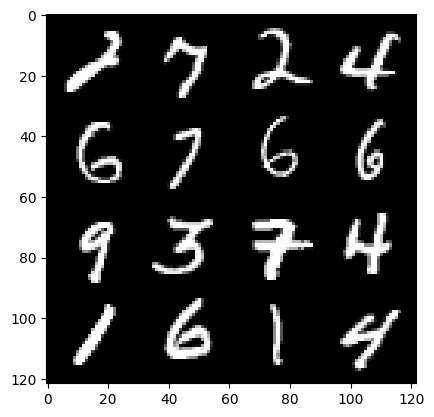

84: step 39600 / Gen loss: 3.569276831944785 / disc_loss: 0.17198011311391975


  0%|          | 0/469 [00:00<?, ?it/s]

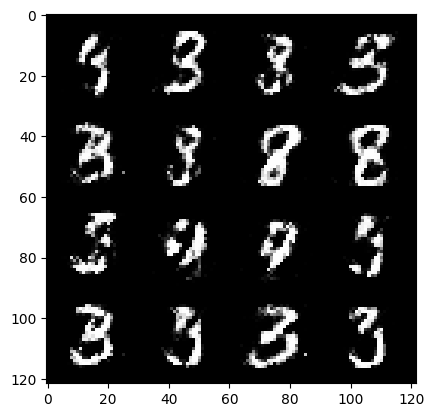

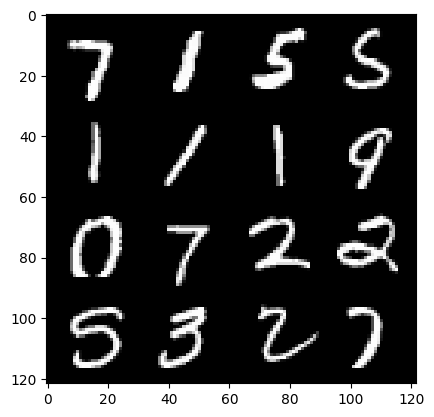

85: step 39900 / Gen loss: 3.3632002758979795 / disc_loss: 0.17823638843993353


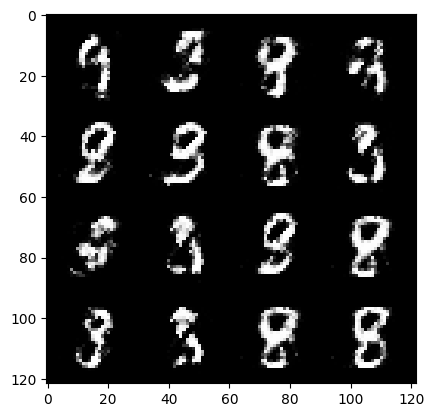

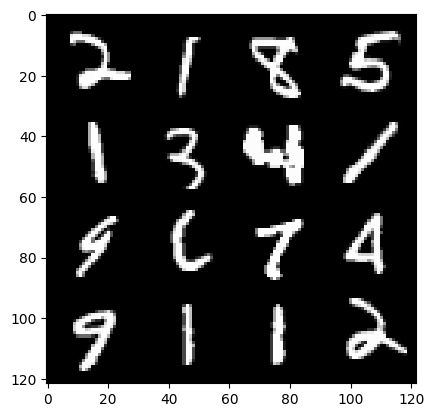

85: step 40200 / Gen loss: 3.528608530362451 / disc_loss: 0.15659655508895712


  0%|          | 0/469 [00:00<?, ?it/s]

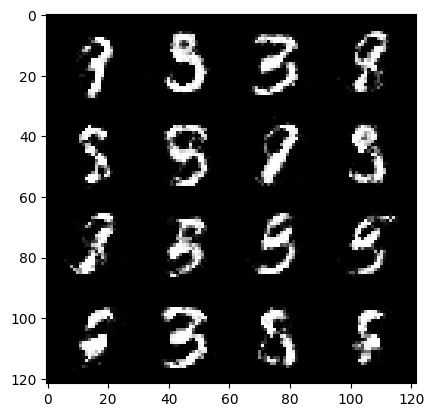

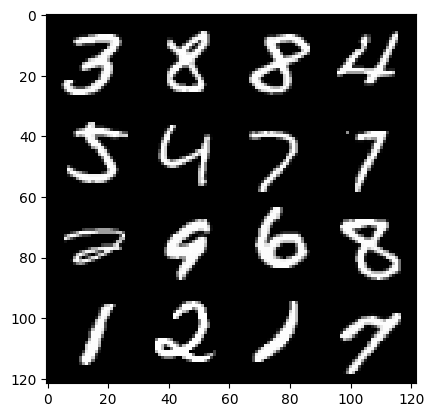

86: step 40500 / Gen loss: 3.6339707223574322 / disc_loss: 0.1429938666770855


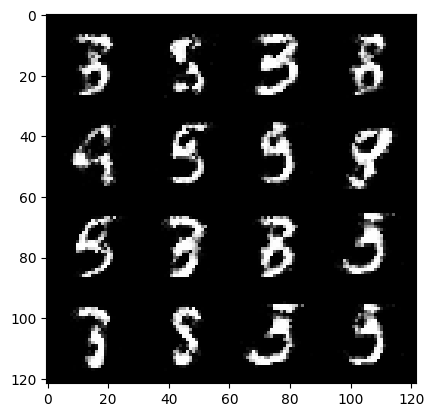

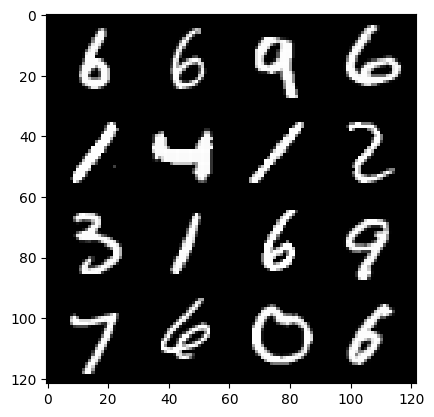

86: step 40800 / Gen loss: 3.6990762122472143 / disc_loss: 0.1406398324420055


  0%|          | 0/469 [00:00<?, ?it/s]

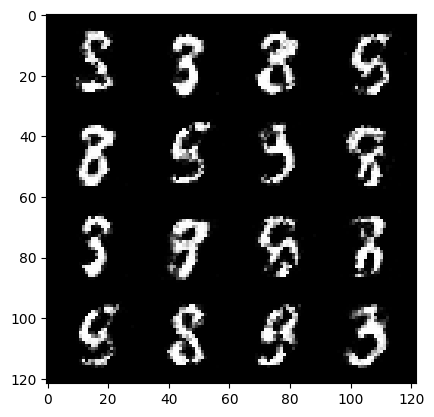

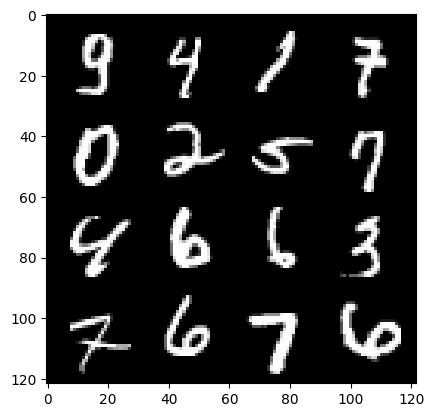

87: step 41100 / Gen loss: 3.498995707035067 / disc_loss: 0.15012109249830244


  0%|          | 0/469 [00:00<?, ?it/s]

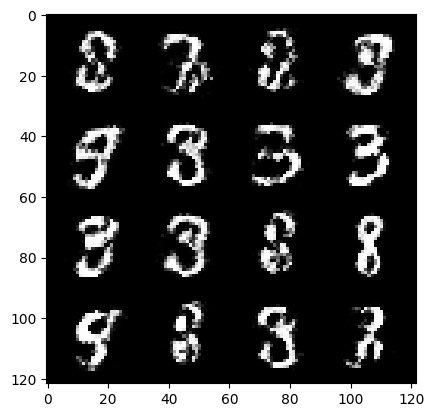

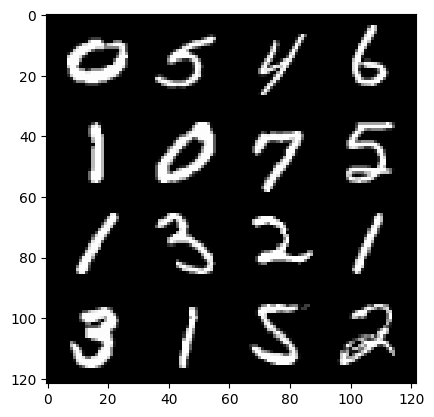

88: step 41400 / Gen loss: 3.5138642120361334 / disc_loss: 0.1517132379983862


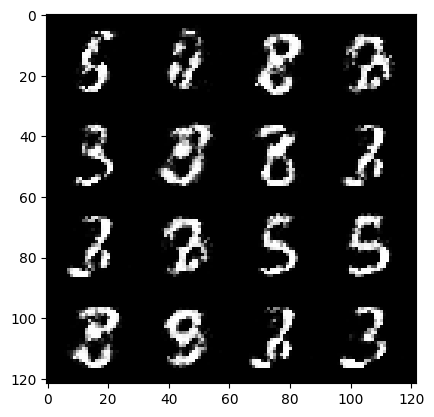

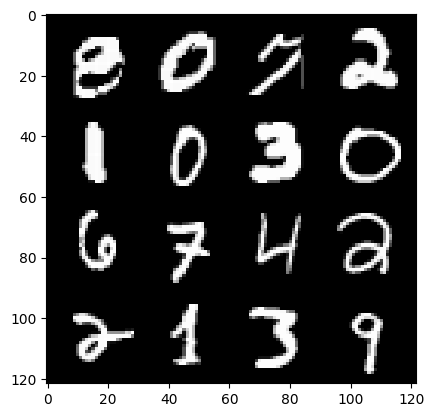

88: step 41700 / Gen loss: 3.5850831055641157 / disc_loss: 0.15284003864973797


  0%|          | 0/469 [00:00<?, ?it/s]

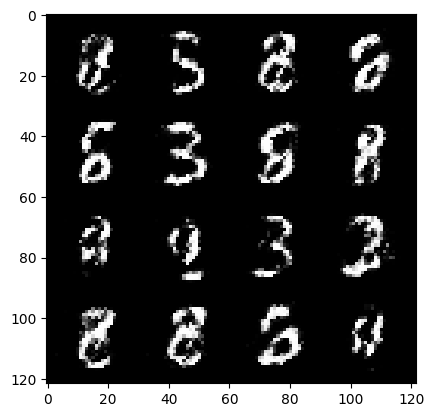

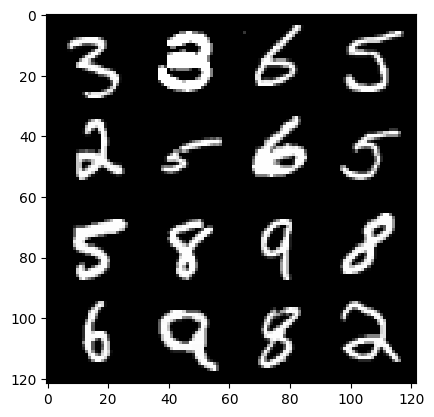

89: step 42000 / Gen loss: 3.5470632227261882 / disc_loss: 0.14061135767648605


  0%|          | 0/469 [00:00<?, ?it/s]

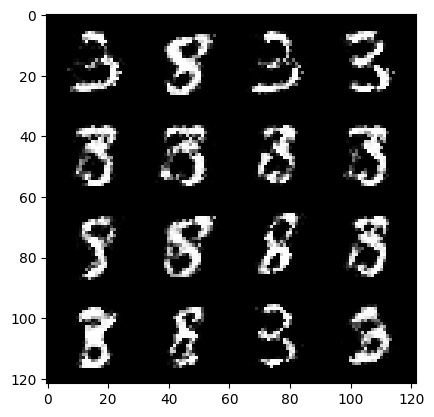

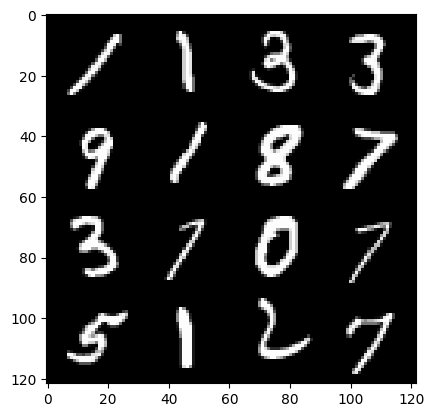

90: step 42300 / Gen loss: 3.517217168013252 / disc_loss: 0.14736471260587372


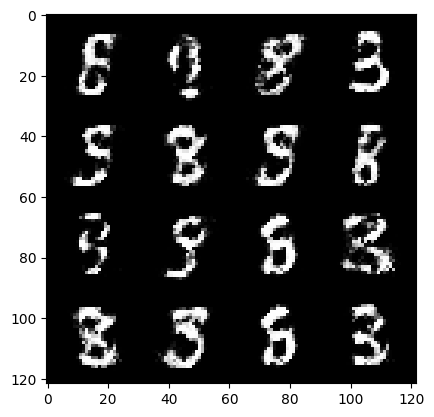

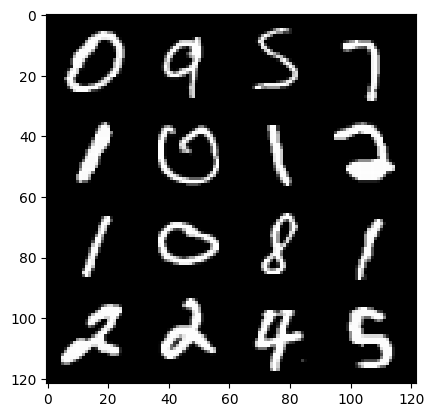

90: step 42600 / Gen loss: 3.5489909378687563 / disc_loss: 0.15160408417383833


  0%|          | 0/469 [00:00<?, ?it/s]

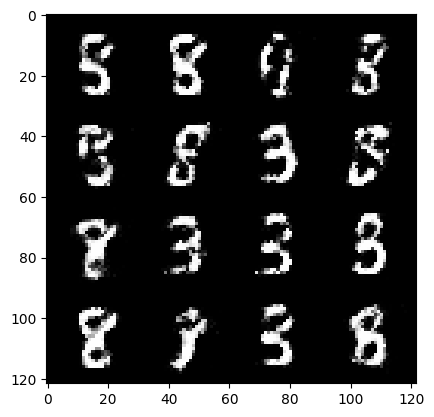

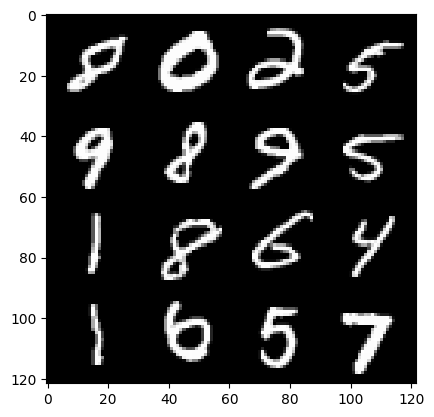

91: step 42900 / Gen loss: 3.5309384568532285 / disc_loss: 0.17443899884819983


  0%|          | 0/469 [00:00<?, ?it/s]

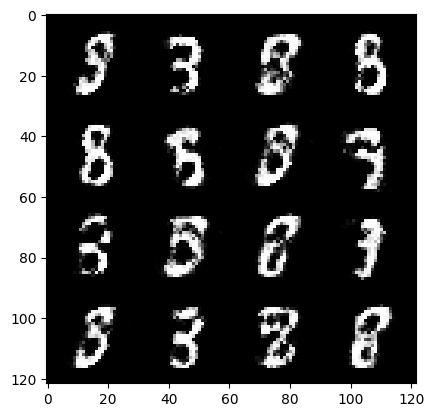

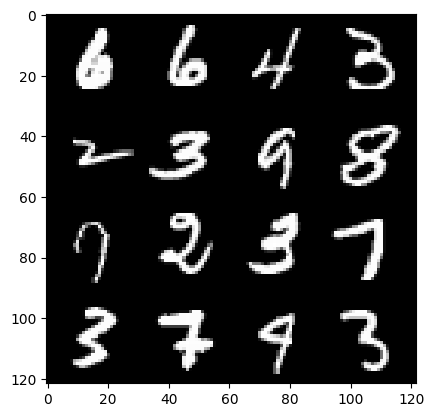

92: step 43200 / Gen loss: 3.4677643815676356 / disc_loss: 0.17985146641731253


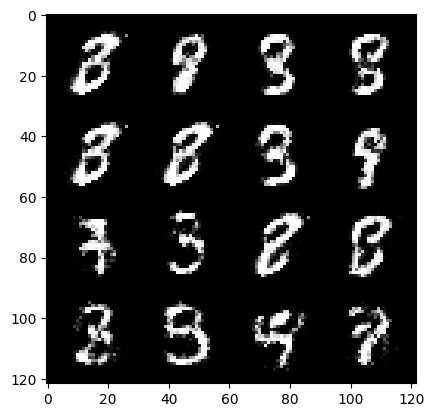

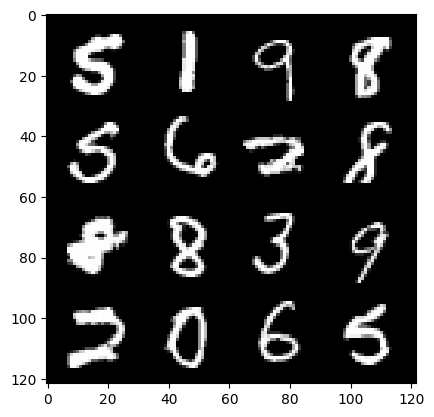

92: step 43500 / Gen loss: 3.344351932207742 / disc_loss: 0.17753969773650166


  0%|          | 0/469 [00:00<?, ?it/s]

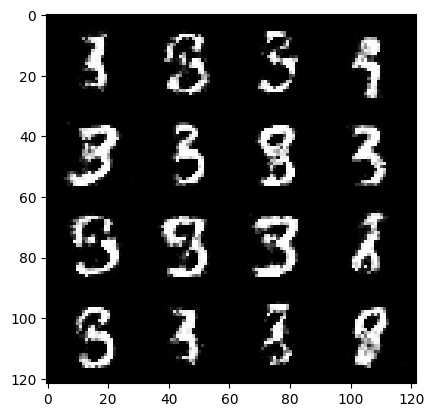

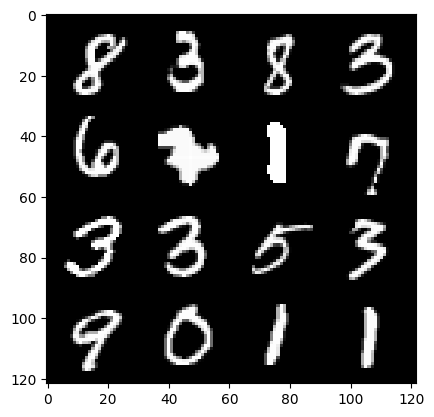

93: step 43800 / Gen loss: 3.3335853807131453 / disc_loss: 0.16708631962537773


  0%|          | 0/469 [00:00<?, ?it/s]

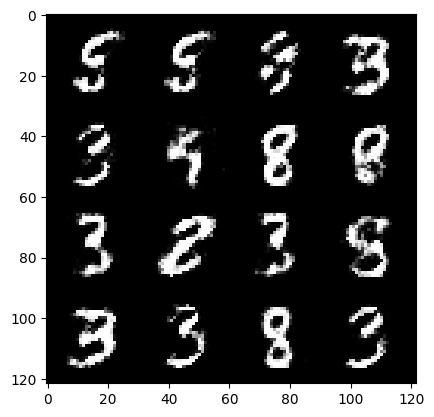

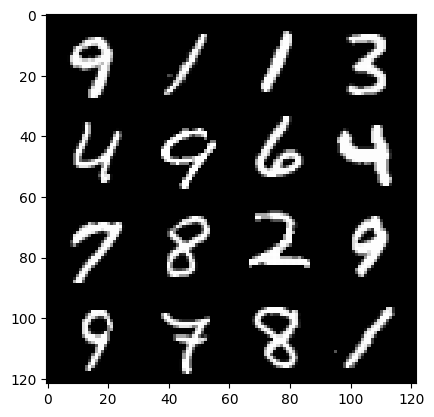

94: step 44100 / Gen loss: 3.356200303236645 / disc_loss: 0.1554614565024774


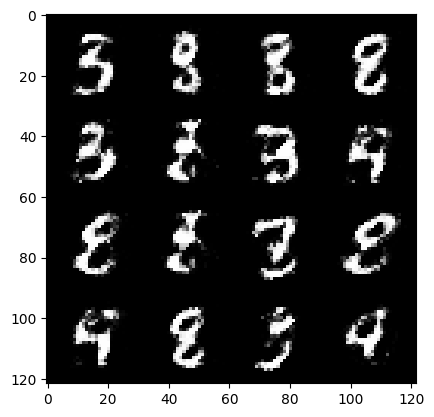

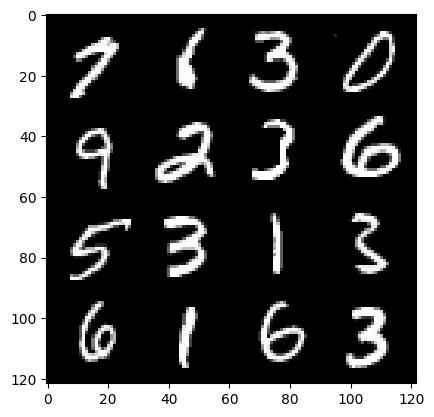

94: step 44400 / Gen loss: 3.327727785905202 / disc_loss: 0.15859102750817927


  0%|          | 0/469 [00:00<?, ?it/s]

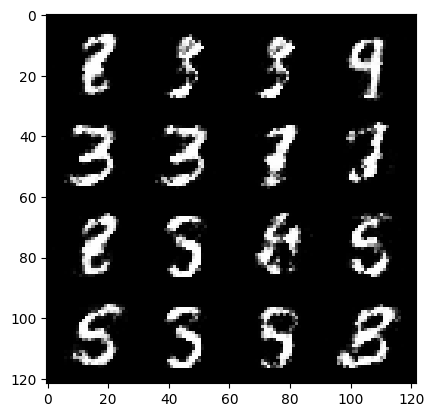

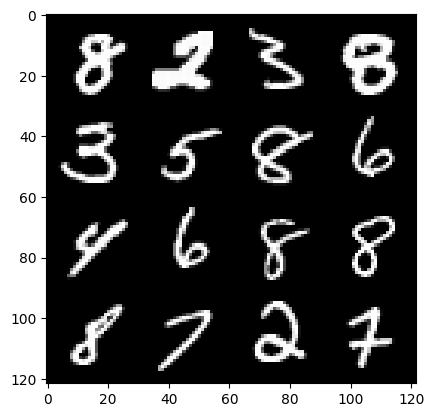

95: step 44700 / Gen loss: 3.327503850460052 / disc_loss: 0.15955929733812807


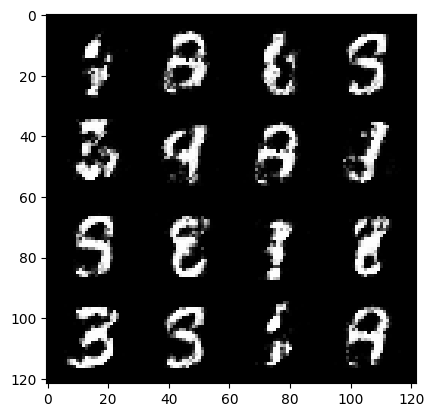

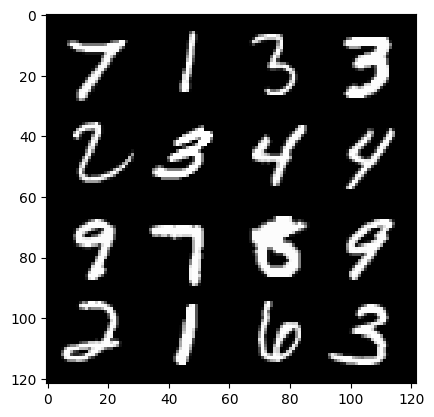

95: step 45000 / Gen loss: 3.5067120385169974 / disc_loss: 0.14217878234883155


  0%|          | 0/469 [00:00<?, ?it/s]

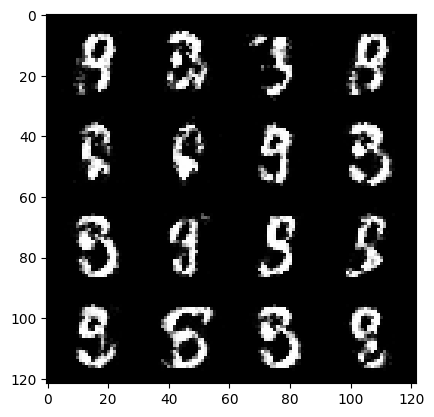

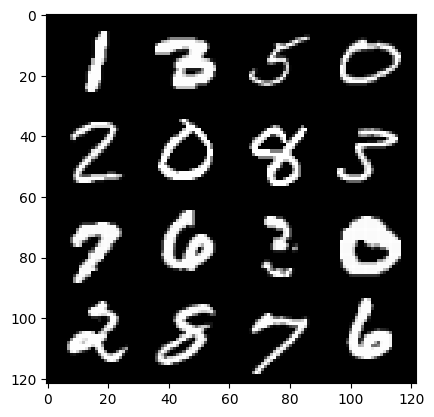

96: step 45300 / Gen loss: 3.3651014232635506 / disc_loss: 0.18252908567587542


  0%|          | 0/469 [00:00<?, ?it/s]

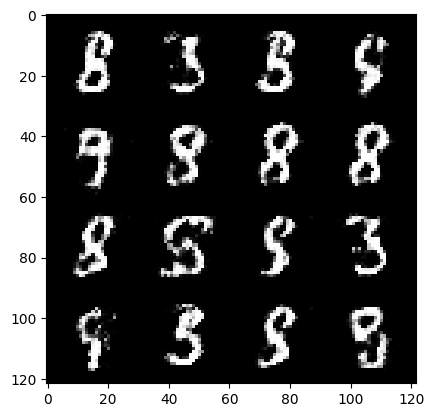

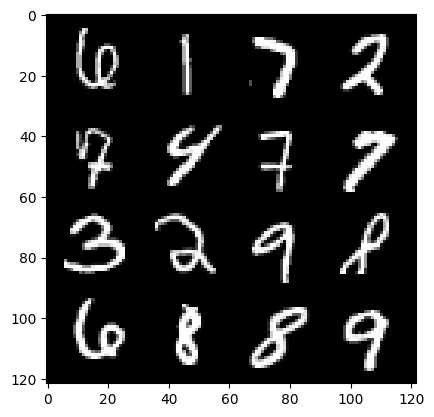

97: step 45600 / Gen loss: 3.2819765130678795 / disc_loss: 0.19609859950840472


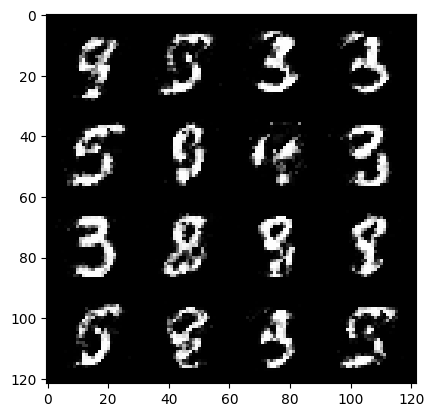

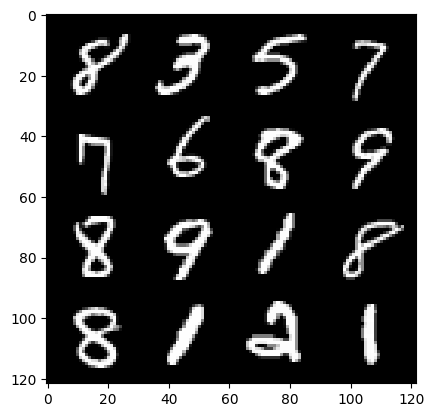

97: step 45900 / Gen loss: 3.1546613518396978 / disc_loss: 0.19476199363668767


  0%|          | 0/469 [00:00<?, ?it/s]

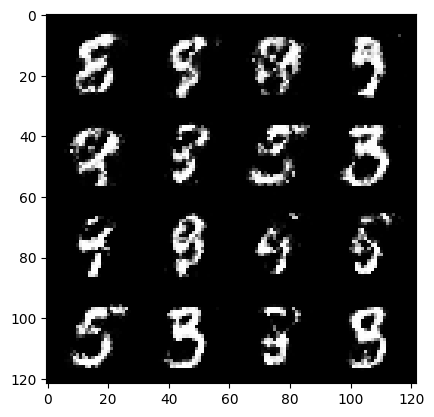

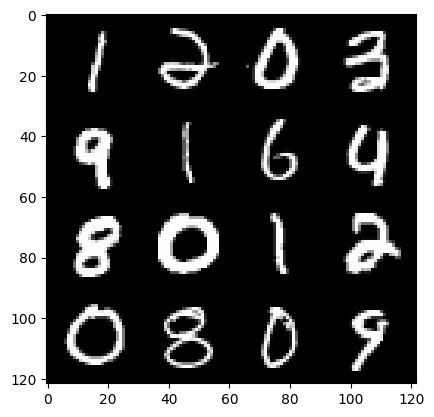

98: step 46200 / Gen loss: 3.3041398008664427 / disc_loss: 0.18975850174824385


  0%|          | 0/469 [00:00<?, ?it/s]

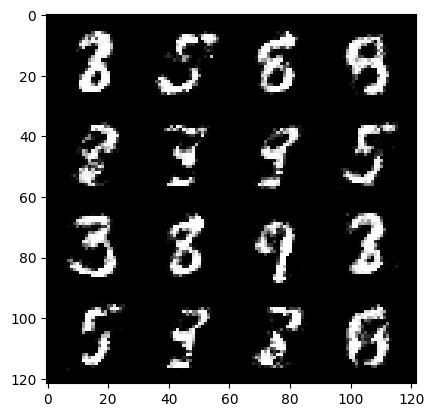

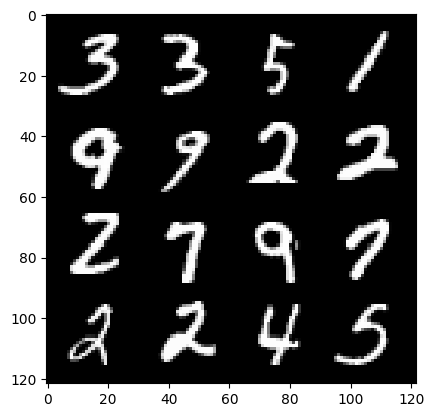

99: step 46500 / Gen loss: 3.1167955946922317 / disc_loss: 0.1996930069476368


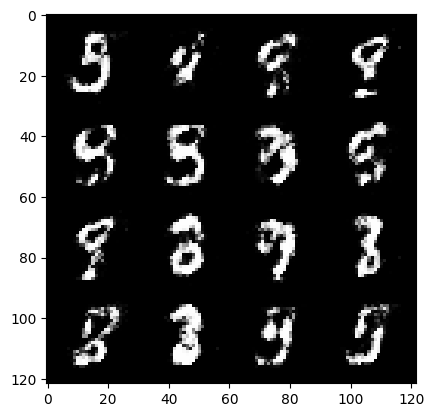

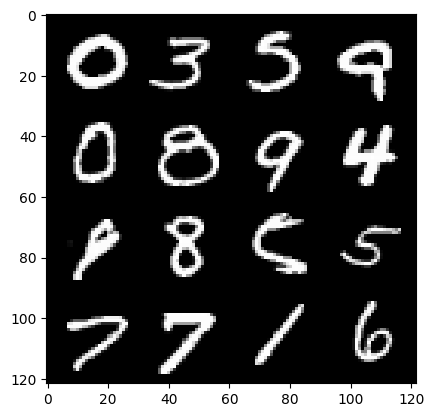

99: step 46800 / Gen loss: 3.0685580356915776 / disc_loss: 0.21393109974761818


  0%|          | 0/469 [00:00<?, ?it/s]

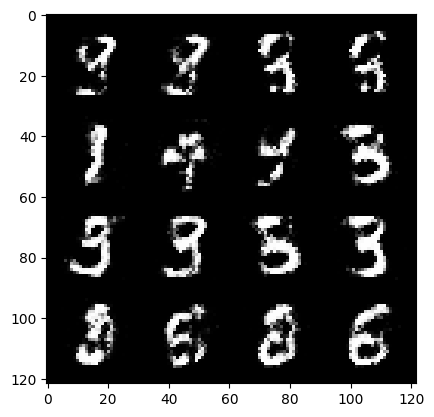

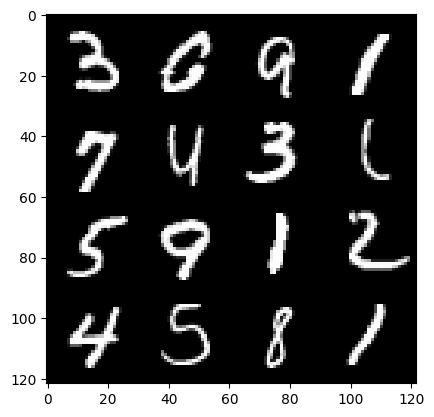

100: step 47100 / Gen loss: 3.091810812950134 / disc_loss: 0.1848347329596679


  0%|          | 0/469 [00:00<?, ?it/s]

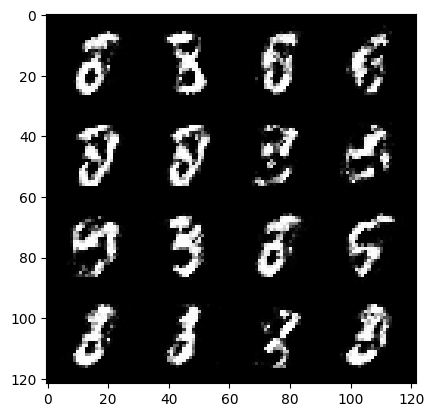

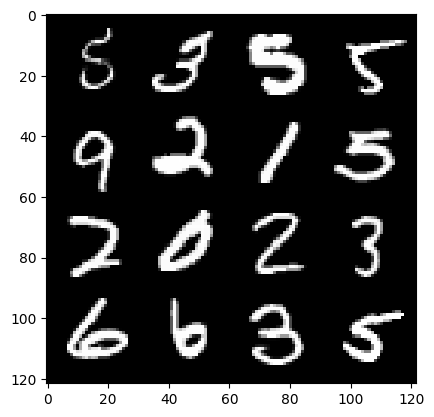

101: step 47400 / Gen loss: 3.152529738744101 / disc_loss: 0.17972766744593777


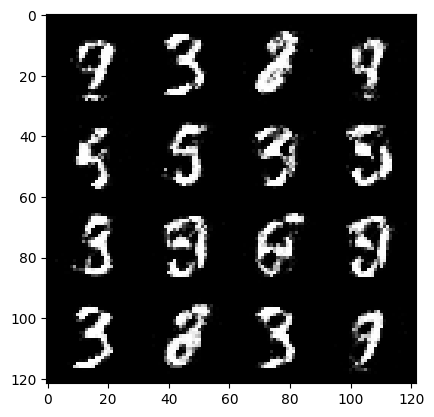

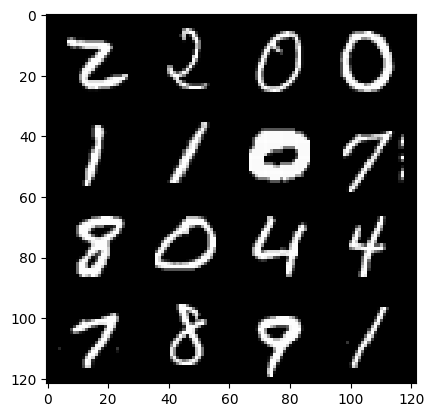

101: step 47700 / Gen loss: 3.21685513337453 / disc_loss: 0.19333915390074247


  0%|          | 0/469 [00:00<?, ?it/s]

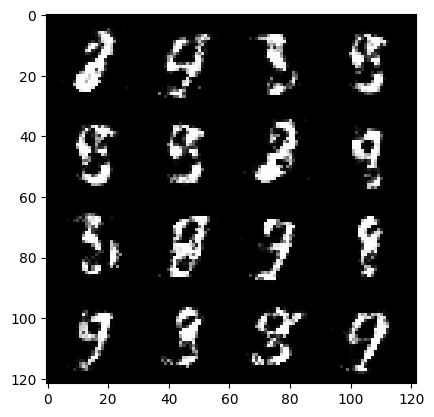

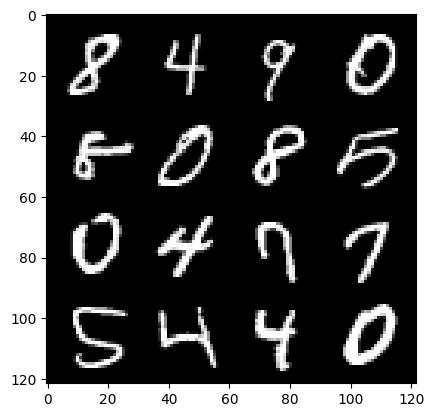

102: step 48000 / Gen loss: 3.264359529018403 / disc_loss: 0.17550833143293845


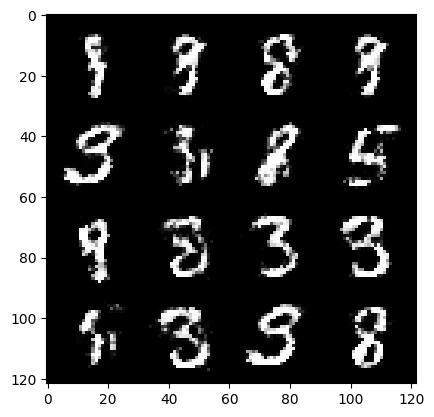

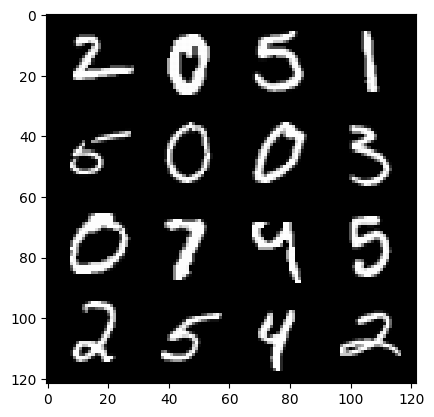

102: step 48300 / Gen loss: 3.3179274201393096 / disc_loss: 0.1790357203036547


  0%|          | 0/469 [00:00<?, ?it/s]

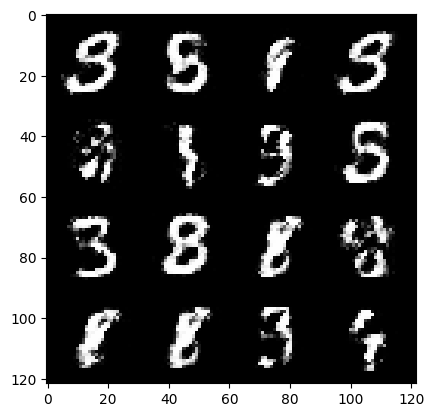

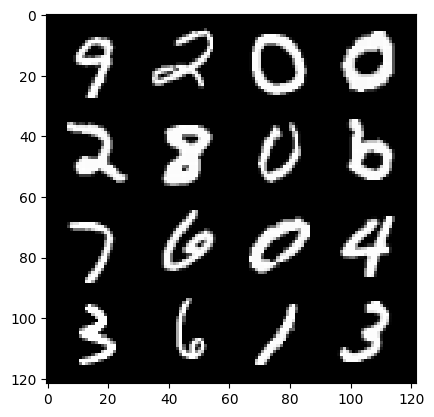

103: step 48600 / Gen loss: 3.2170998493830347 / disc_loss: 0.1886342408011357


  0%|          | 0/469 [00:00<?, ?it/s]

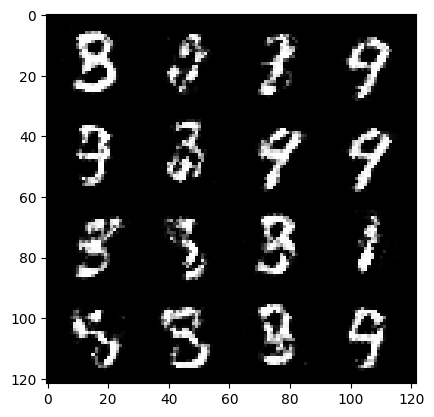

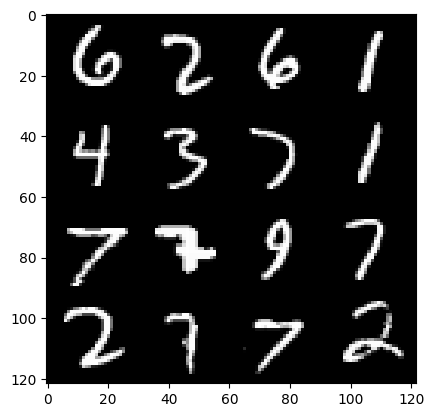

104: step 48900 / Gen loss: 3.161370658874509 / disc_loss: 0.18505185884734004


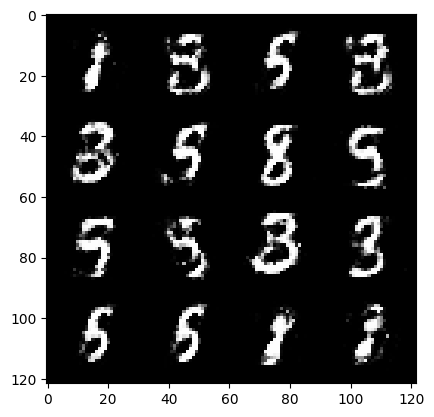

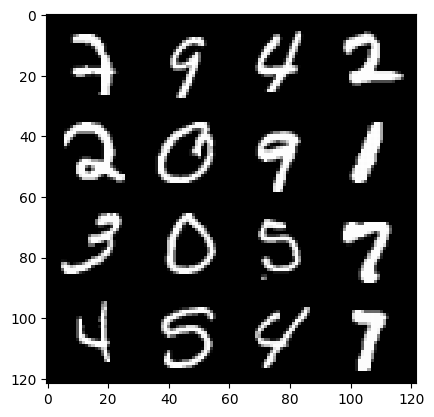

104: step 49200 / Gen loss: 3.077318708896639 / disc_loss: 0.19074674886961773


  0%|          | 0/469 [00:00<?, ?it/s]

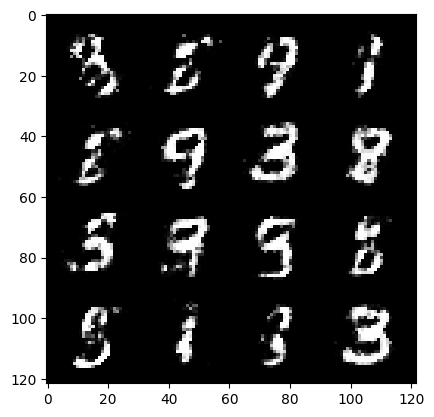

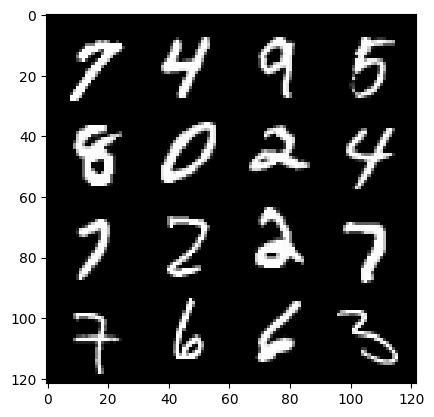

105: step 49500 / Gen loss: 3.1831944497426345 / disc_loss: 0.16046068891882892


  0%|          | 0/469 [00:00<?, ?it/s]

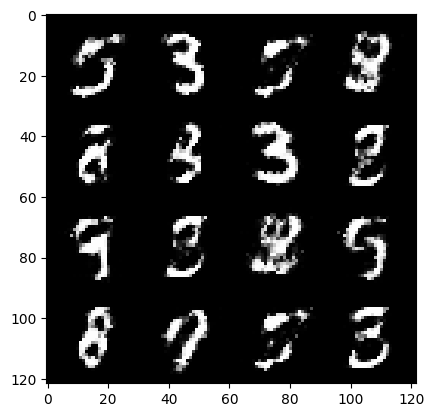

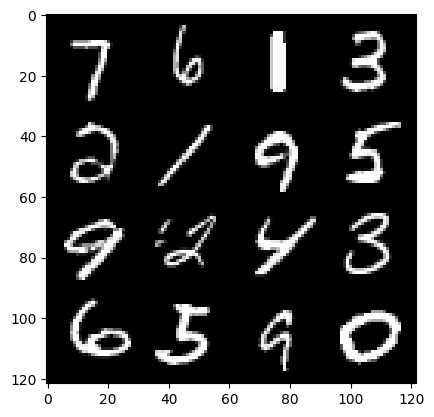

106: step 49800 / Gen loss: 3.036478451887767 / disc_loss: 0.19784915631016092


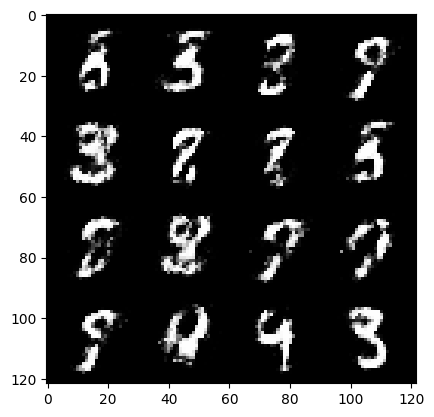

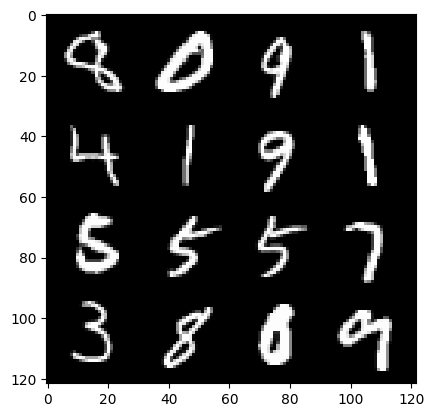

106: step 50100 / Gen loss: 3.147837798595429 / disc_loss: 0.1950518324474495


  0%|          | 0/469 [00:00<?, ?it/s]

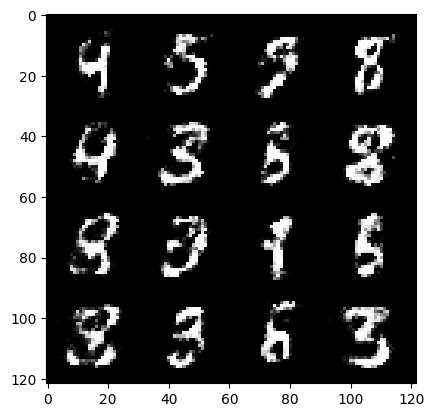

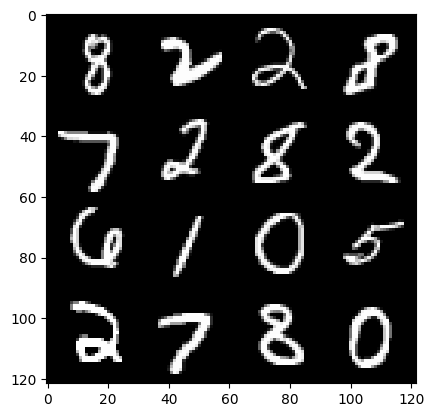

107: step 50400 / Gen loss: 3.196767973105113 / disc_loss: 0.2020170395324629


  0%|          | 0/469 [00:00<?, ?it/s]

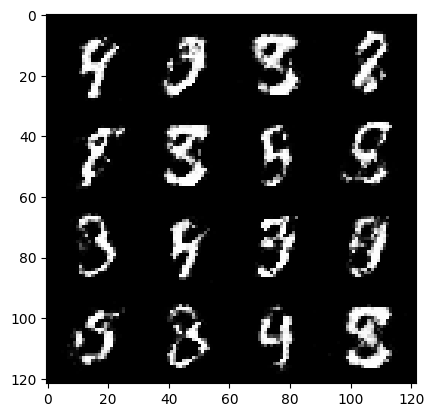

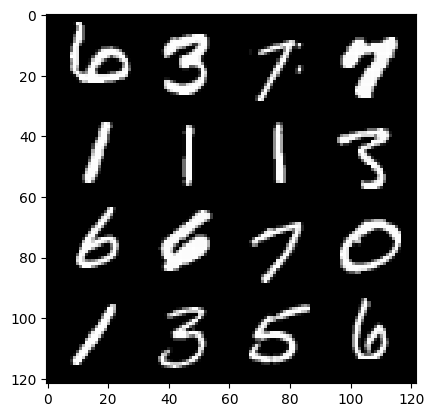

108: step 50700 / Gen loss: 2.9964415645599356 / disc_loss: 0.22444067706664392


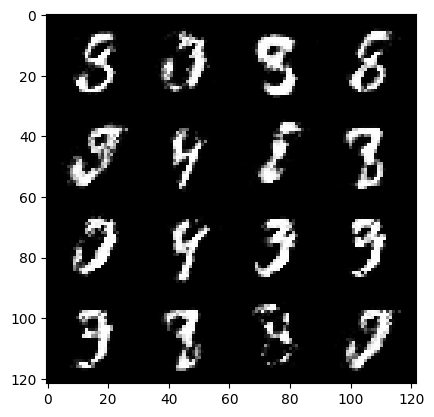

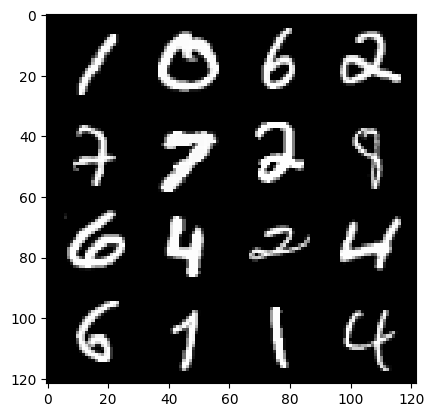

108: step 51000 / Gen loss: 3.02603672027588 / disc_loss: 0.22615509207049983


  0%|          | 0/469 [00:00<?, ?it/s]

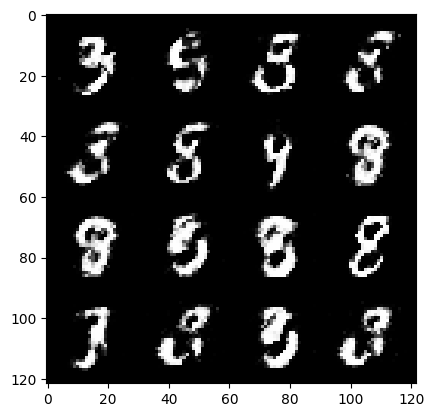

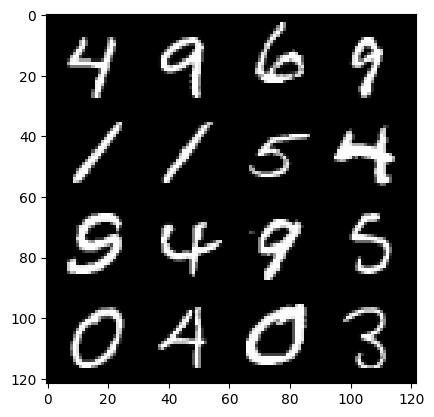

109: step 51300 / Gen loss: 2.9385673149426768 / disc_loss: 0.21856118137637776


  0%|          | 0/469 [00:00<?, ?it/s]

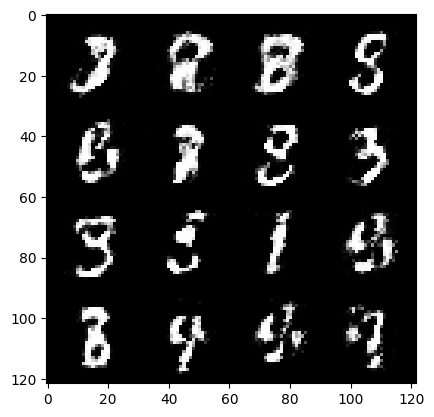

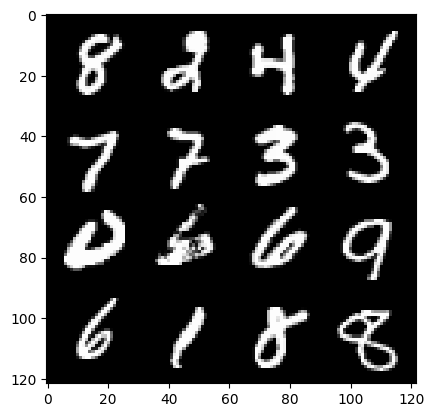

110: step 51600 / Gen loss: 3.0685822224617008 / disc_loss: 0.1993816329538823


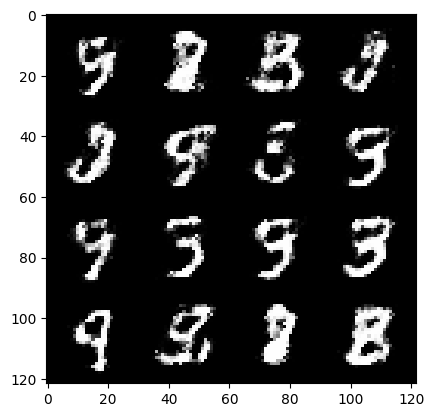

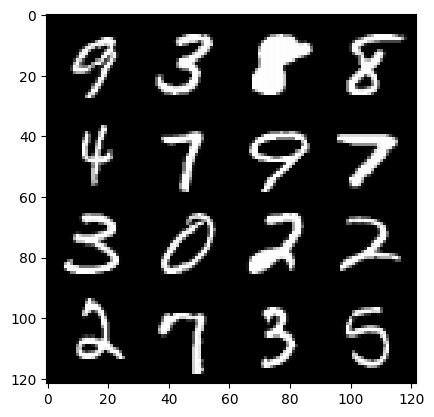

110: step 51900 / Gen loss: 2.8870951477686573 / disc_loss: 0.21882377152641627


  0%|          | 0/469 [00:00<?, ?it/s]

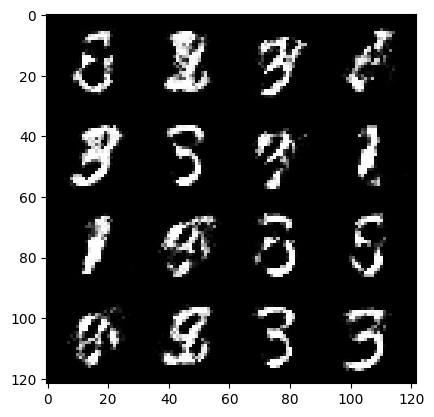

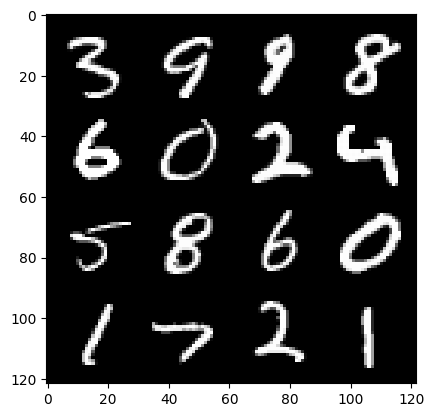

111: step 52200 / Gen loss: 2.837694515387216 / disc_loss: 0.22998530651132276


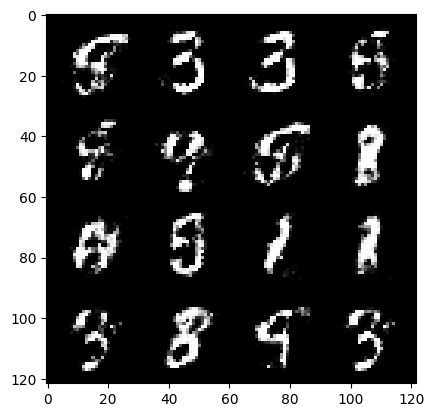

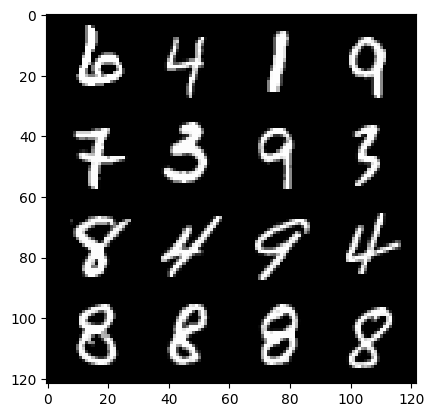

111: step 52500 / Gen loss: 2.7402998419602698 / disc_loss: 0.23544708391030633


  0%|          | 0/469 [00:00<?, ?it/s]

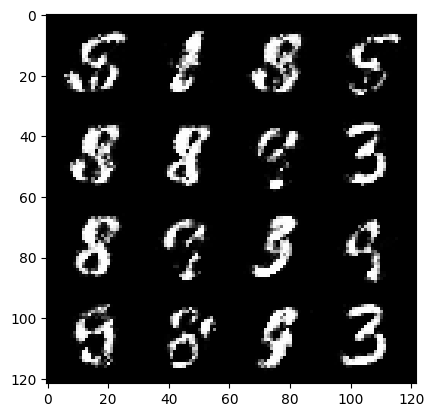

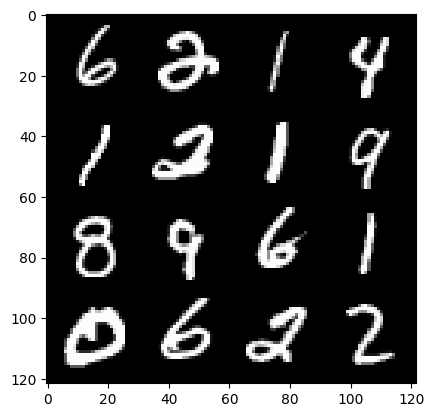

112: step 52800 / Gen loss: 2.8432190934816988 / disc_loss: 0.22957831238706897


  0%|          | 0/469 [00:00<?, ?it/s]

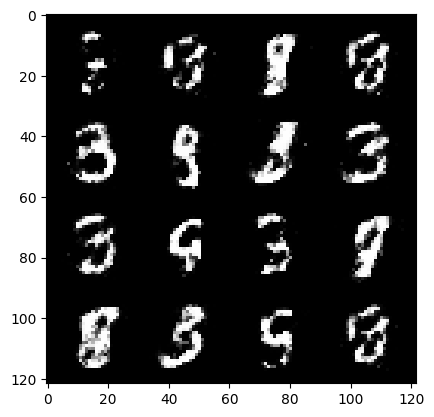

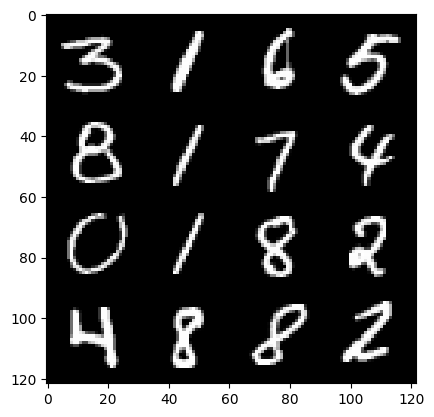

113: step 53100 / Gen loss: 2.9258676918347666 / disc_loss: 0.19758940237263858


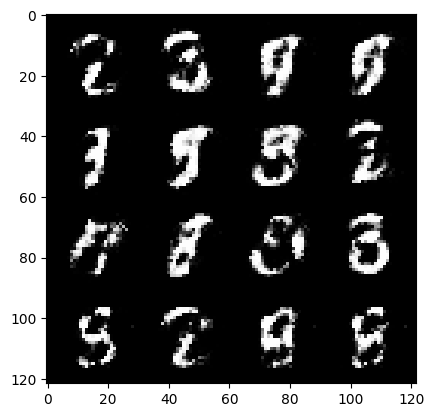

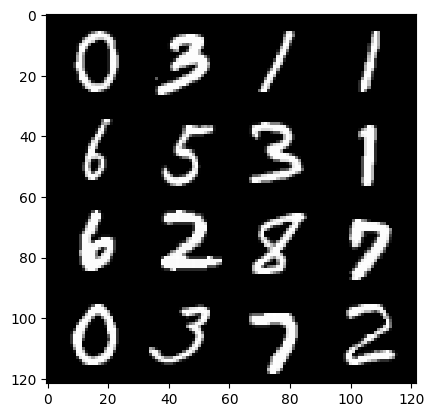

113: step 53400 / Gen loss: 2.859182958602907 / disc_loss: 0.23636222409705318


  0%|          | 0/469 [00:00<?, ?it/s]

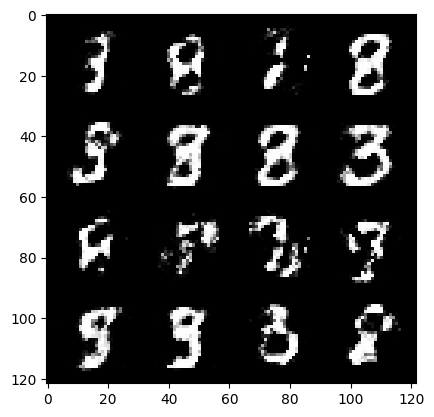

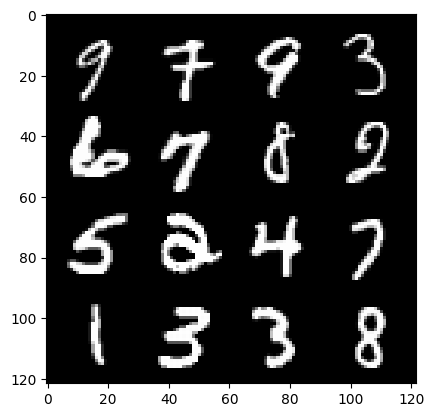

114: step 53700 / Gen loss: 3.015010841687522 / disc_loss: 0.21845156361659374


  0%|          | 0/469 [00:00<?, ?it/s]

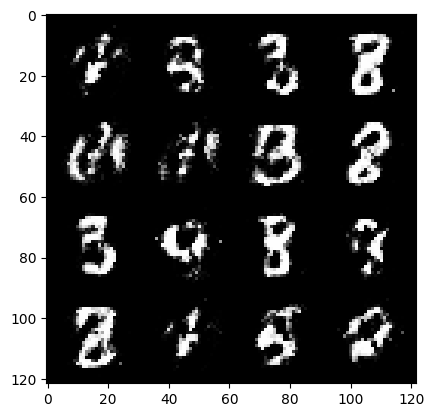

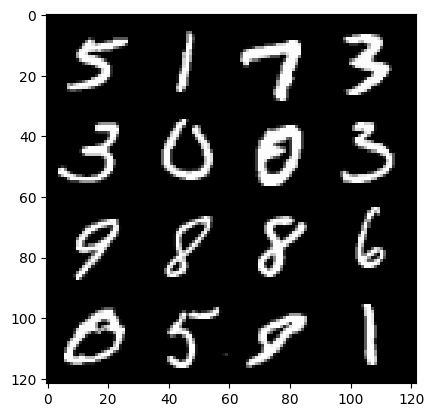

115: step 54000 / Gen loss: 2.9325747044881174 / disc_loss: 0.2230818588534989


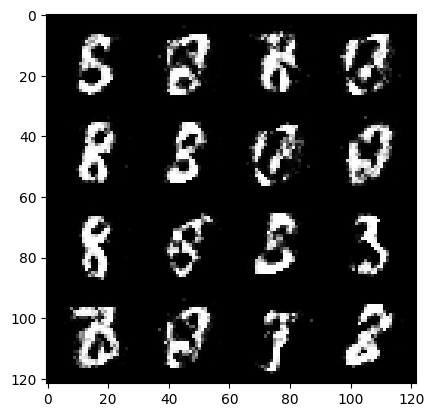

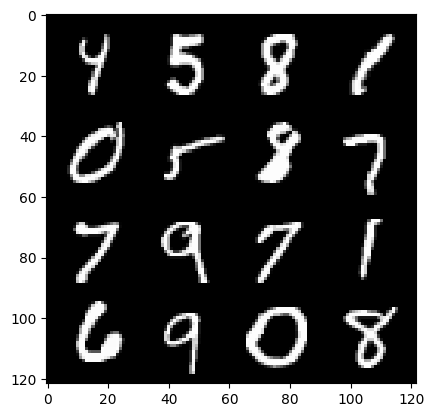

115: step 54300 / Gen loss: 2.84635638634364 / disc_loss: 0.24327806274096178


  0%|          | 0/469 [00:00<?, ?it/s]

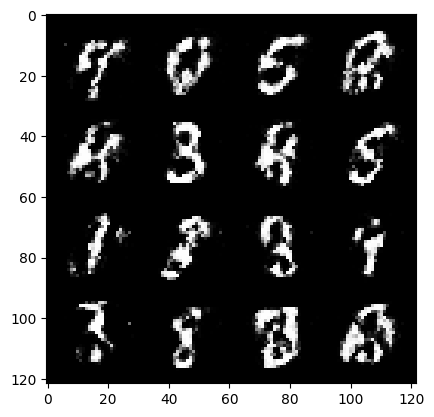

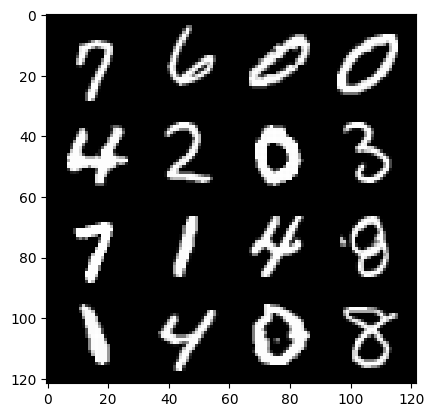

116: step 54600 / Gen loss: 2.7793620987733223 / disc_loss: 0.2325598708291849


  0%|          | 0/469 [00:00<?, ?it/s]

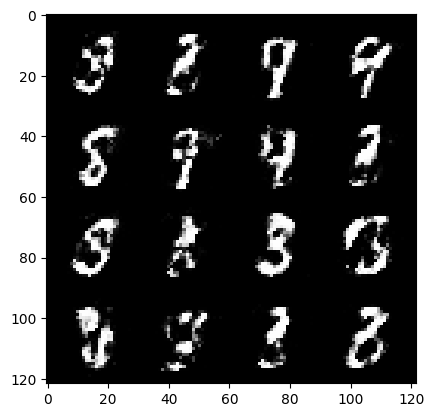

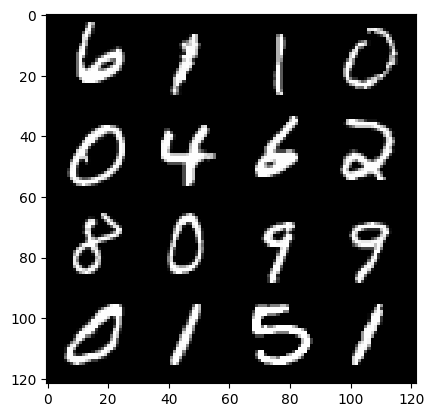

117: step 54900 / Gen loss: 2.855806250572202 / disc_loss: 0.2155369378626346


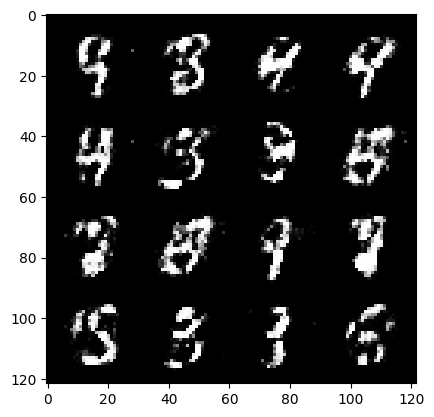

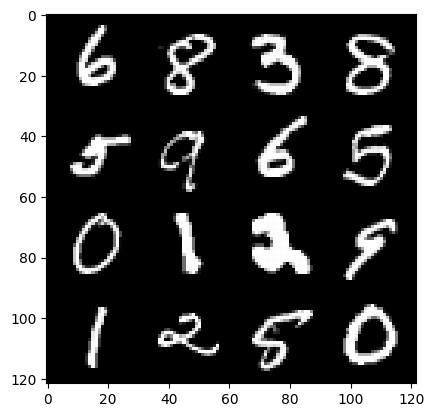

117: step 55200 / Gen loss: 2.9163382514317826 / disc_loss: 0.21764052028457326


  0%|          | 0/469 [00:00<?, ?it/s]

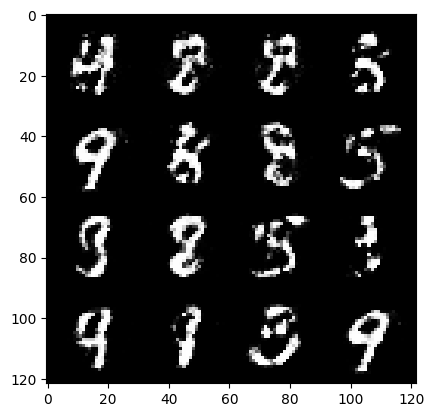

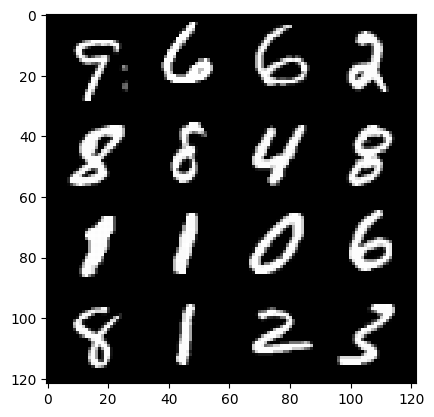

118: step 55500 / Gen loss: 2.828974045117696 / disc_loss: 0.2115311537186307


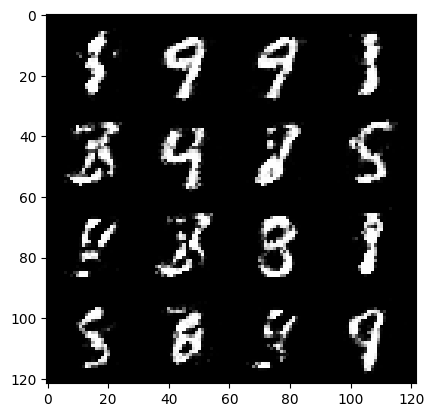

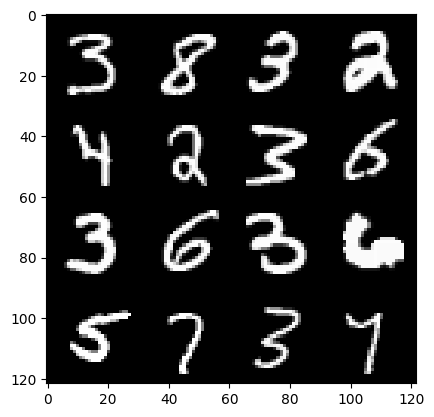

118: step 55800 / Gen loss: 2.8544499206542975 / disc_loss: 0.2218084003527958


  0%|          | 0/469 [00:00<?, ?it/s]

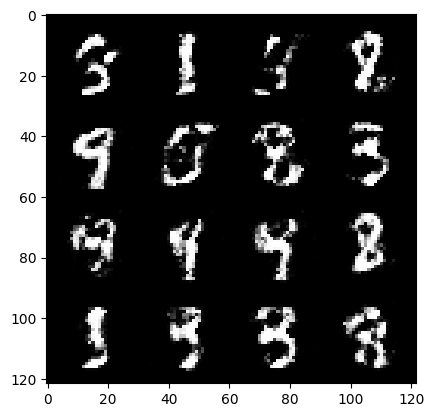

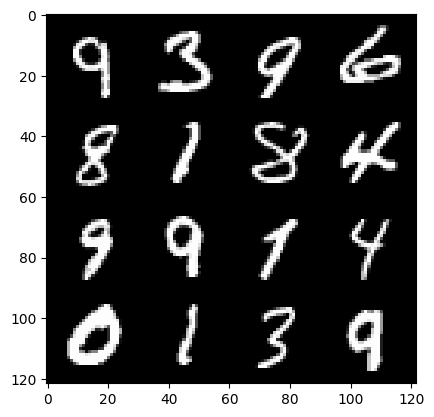

119: step 56100 / Gen loss: 2.8174710869789106 / disc_loss: 0.2318028821051122


  0%|          | 0/469 [00:00<?, ?it/s]

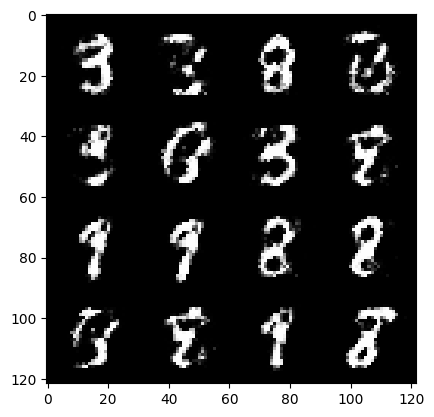

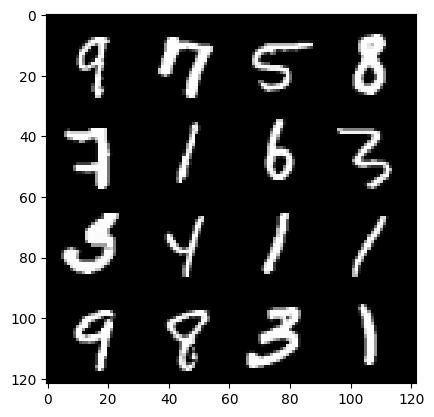

120: step 56400 / Gen loss: 2.6719001213709523 / disc_loss: 0.24376996094981818


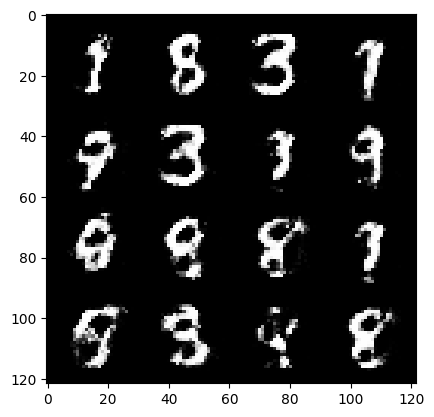

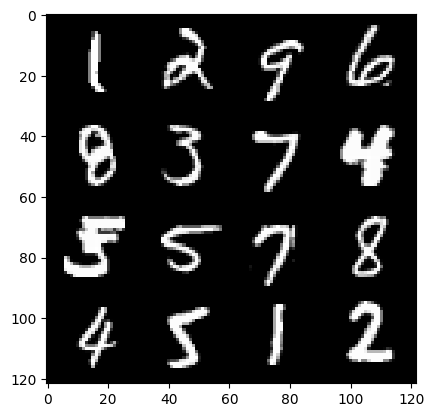

120: step 56700 / Gen loss: 2.797970093886056 / disc_loss: 0.2295997586597998


  0%|          | 0/469 [00:00<?, ?it/s]

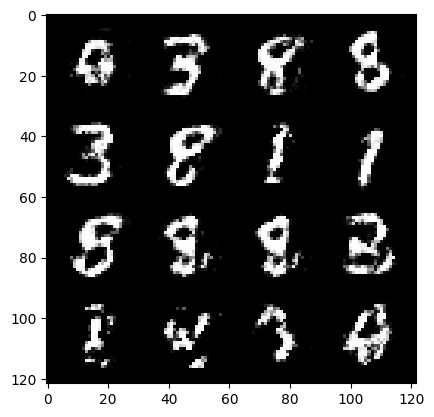

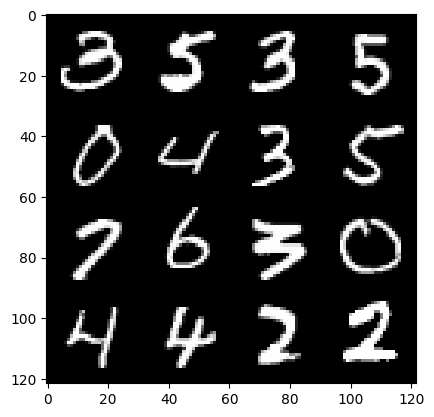

121: step 57000 / Gen loss: 2.8391140246391307 / disc_loss: 0.22214382444818817


  0%|          | 0/469 [00:00<?, ?it/s]

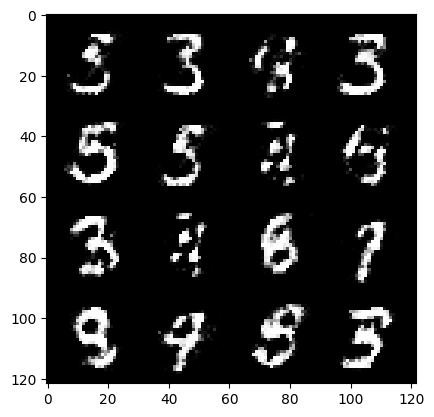

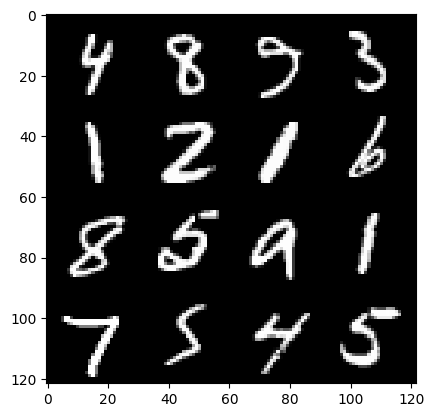

122: step 57300 / Gen loss: 2.882622542381286 / disc_loss: 0.20588930303851766


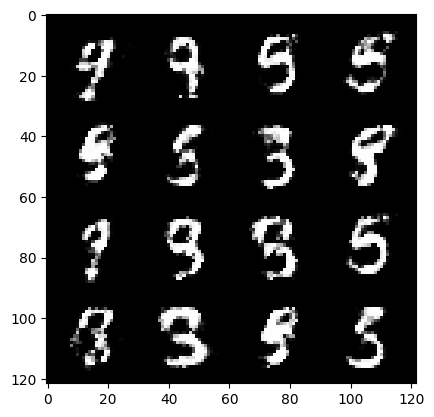

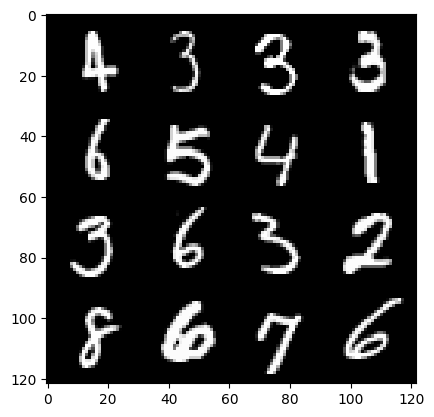

122: step 57600 / Gen loss: 2.751163938045501 / disc_loss: 0.22111540685097383


  0%|          | 0/469 [00:00<?, ?it/s]

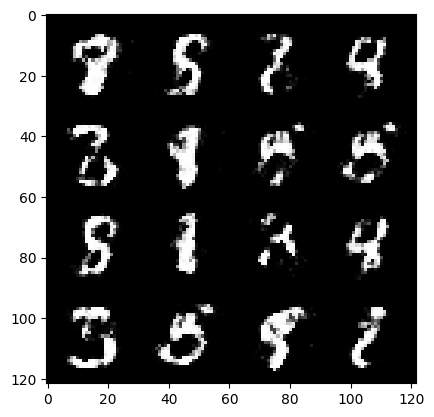

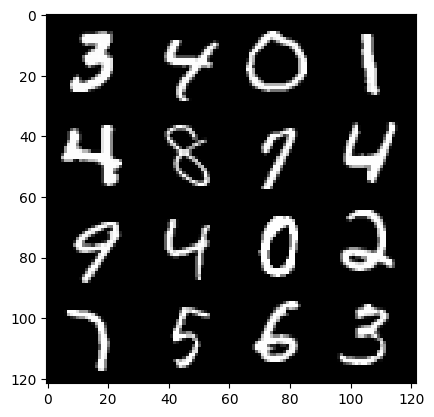

123: step 57900 / Gen loss: 2.7944959298769603 / disc_loss: 0.2125864091267189


  0%|          | 0/469 [00:00<?, ?it/s]

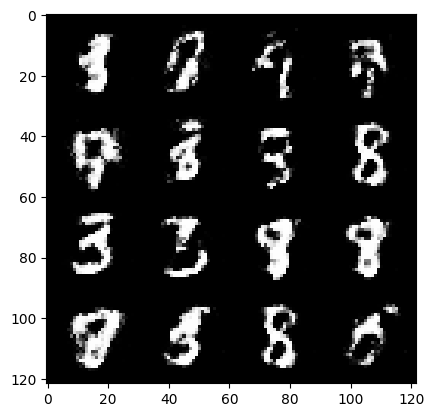

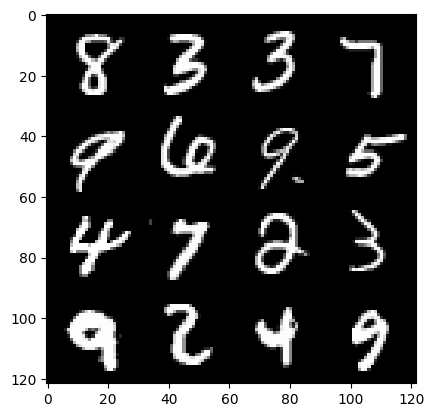

124: step 58200 / Gen loss: 2.785112404823303 / disc_loss: 0.23445436840256056


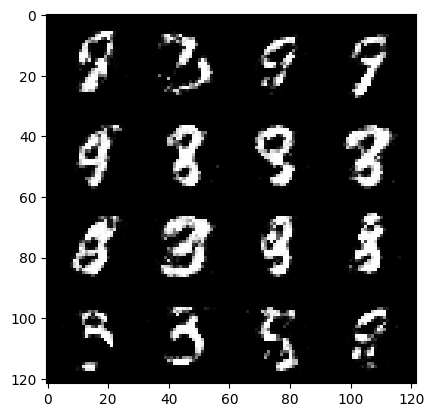

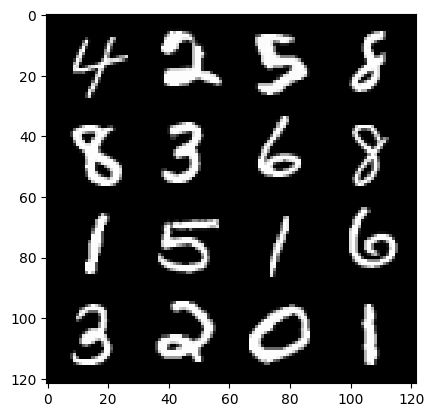

124: step 58500 / Gen loss: 2.581098406712214 / disc_loss: 0.2616370061039925


  0%|          | 0/469 [00:00<?, ?it/s]

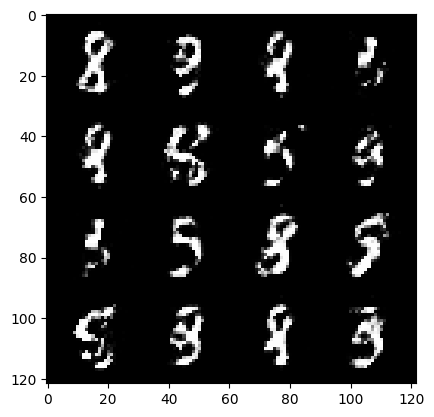

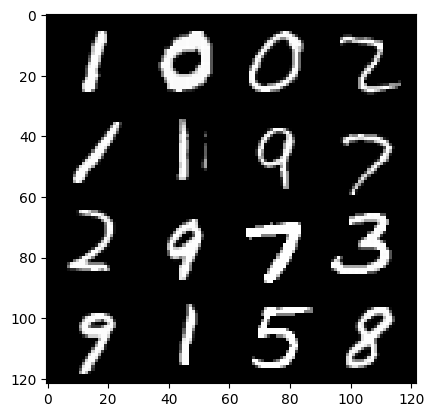

125: step 58800 / Gen loss: 2.6870366144180284 / disc_loss: 0.22807784075538315


  0%|          | 0/469 [00:00<?, ?it/s]

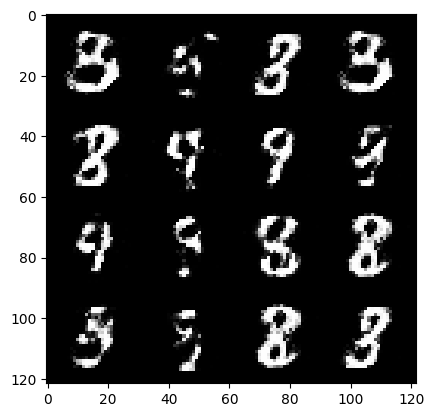

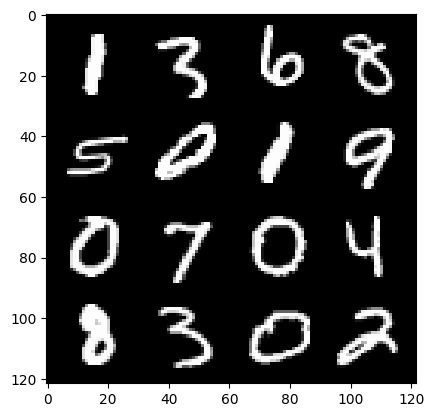

126: step 59100 / Gen loss: 2.7727010615666714 / disc_loss: 0.21577268173297223


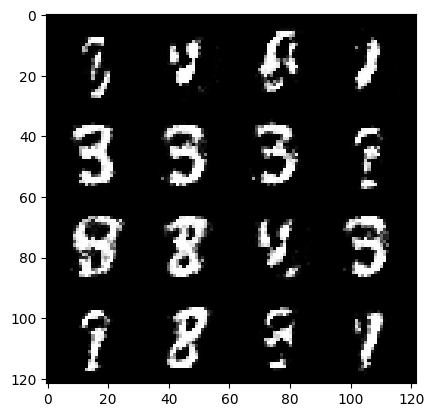

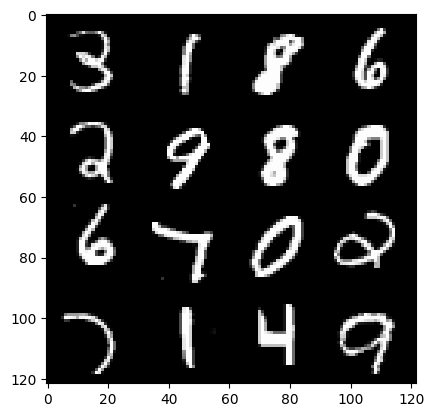

126: step 59400 / Gen loss: 2.5691224638621026 / disc_loss: 0.2510137539108594


  0%|          | 0/469 [00:00<?, ?it/s]

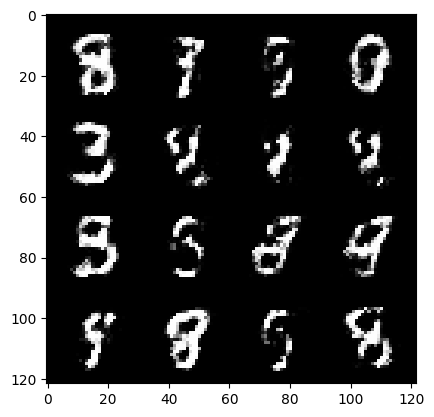

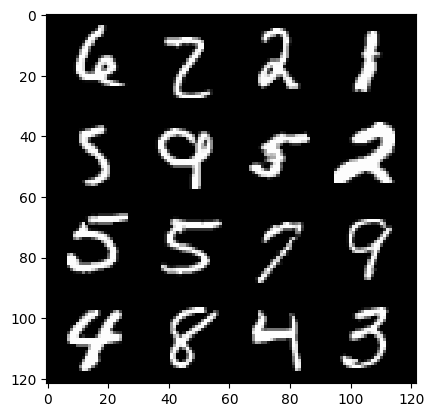

127: step 59700 / Gen loss: 2.581680158774056 / disc_loss: 0.25713733827074375


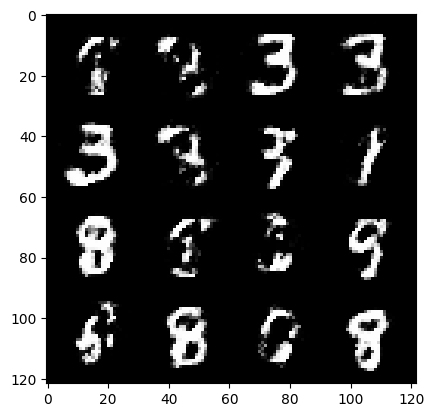

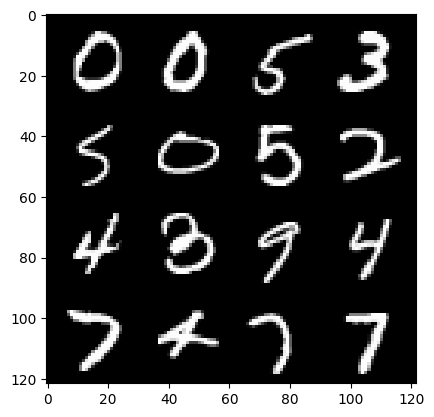

127: step 60000 / Gen loss: 2.611291317145031 / disc_loss: 0.25616370161374424


  0%|          | 0/469 [00:00<?, ?it/s]

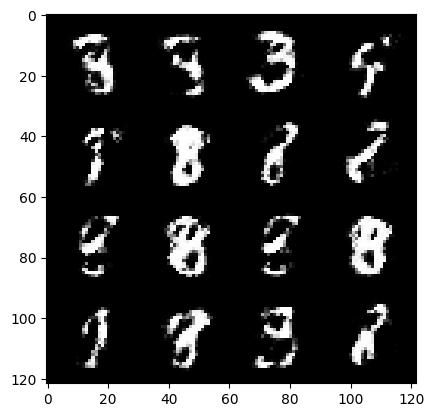

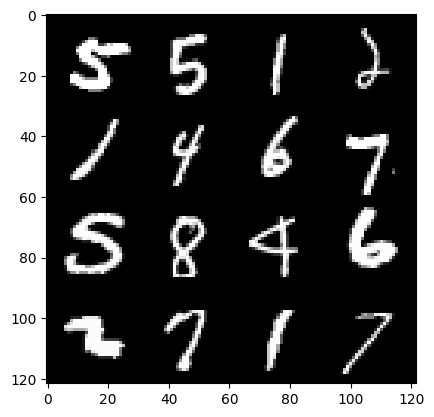

128: step 60300 / Gen loss: 2.5358078408241282 / disc_loss: 0.25327995836734785


  0%|          | 0/469 [00:00<?, ?it/s]

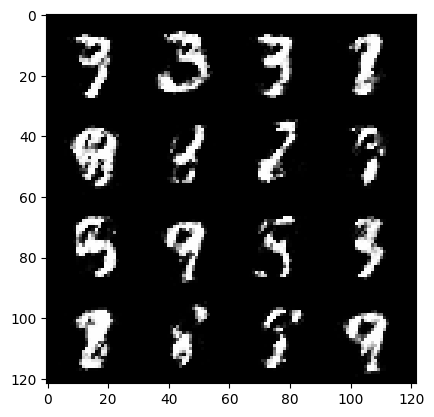

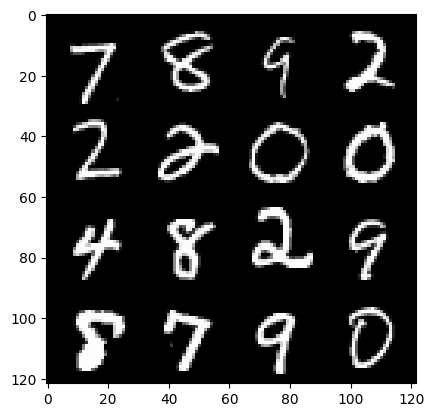

129: step 60600 / Gen loss: 2.548526366949084 / disc_loss: 0.24019114648302406


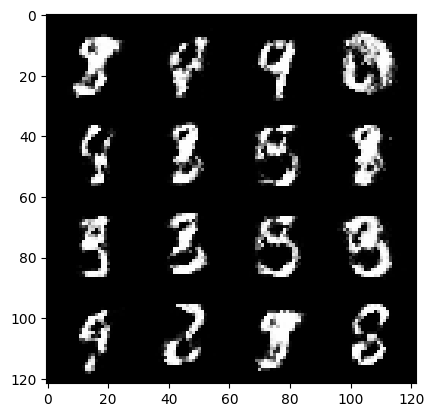

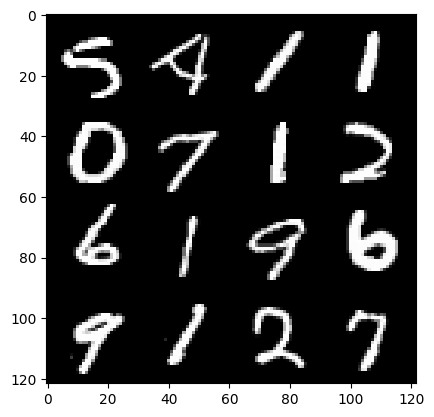

129: step 60900 / Gen loss: 2.5755249337355286 / disc_loss: 0.2475730933248995


  0%|          | 0/469 [00:00<?, ?it/s]

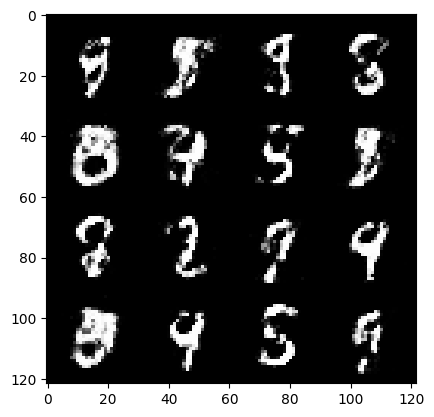

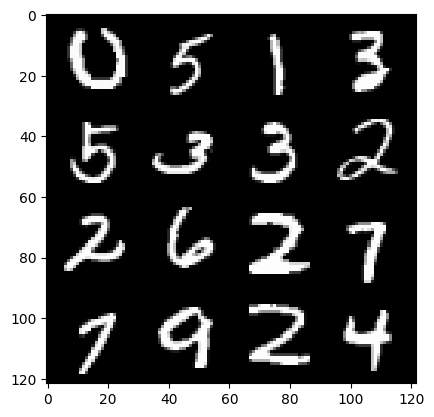

130: step 61200 / Gen loss: 2.5849353861808773 / disc_loss: 0.2613970236480235


  0%|          | 0/469 [00:00<?, ?it/s]

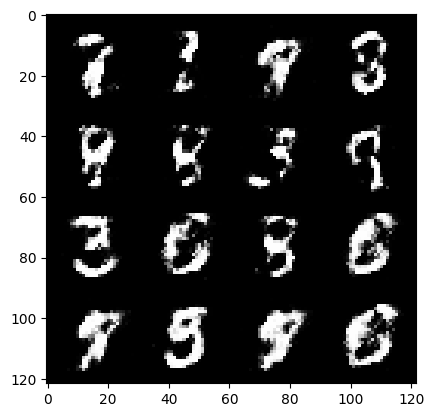

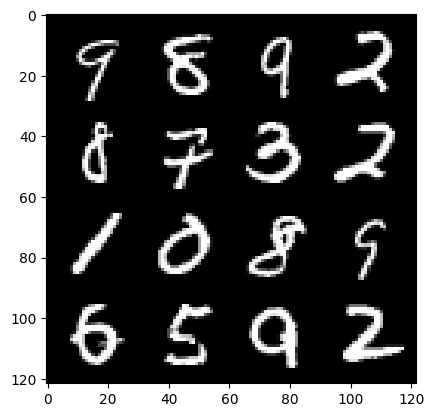

131: step 61500 / Gen loss: 2.648090464274088 / disc_loss: 0.23829684985180702


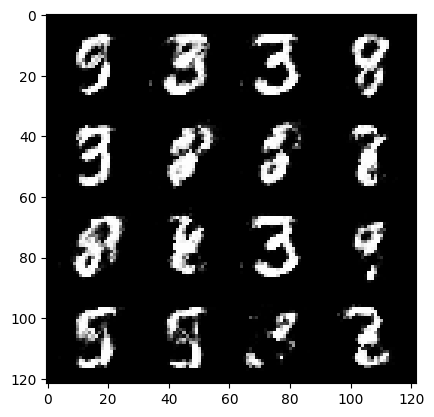

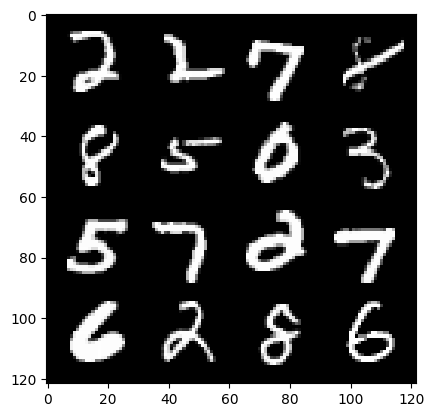

131: step 61800 / Gen loss: 2.60015629529953 / disc_loss: 0.24270197113354994


  0%|          | 0/469 [00:00<?, ?it/s]

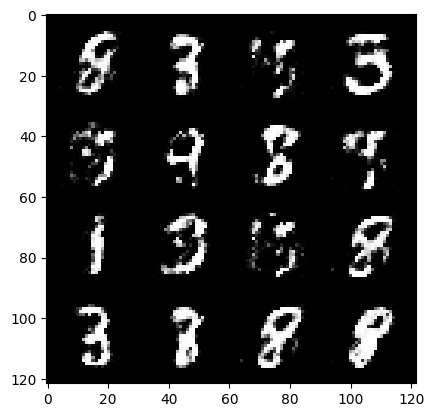

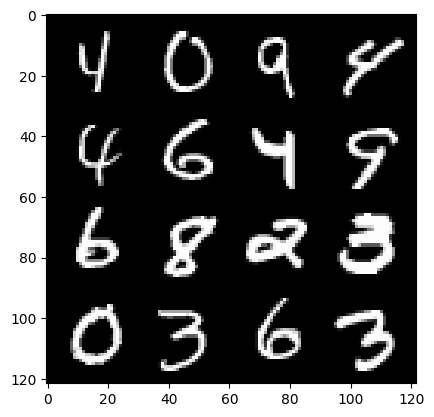

132: step 62100 / Gen loss: 2.4795470829804747 / disc_loss: 0.2706876303752262


  0%|          | 0/469 [00:00<?, ?it/s]

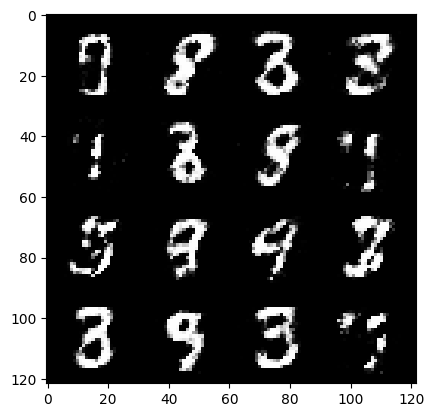

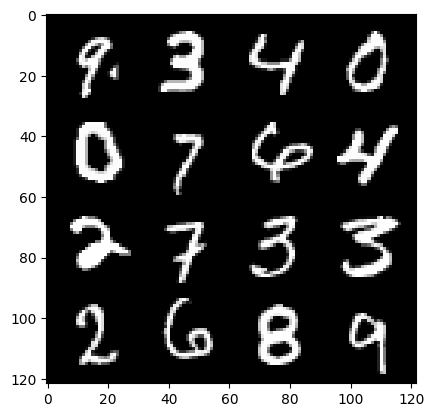

133: step 62400 / Gen loss: 2.522557931741078 / disc_loss: 0.25498358791073156


KeyboardInterrupt: 

In [ ]:
### 60000 / 128 = 468.75  = 469 steps in each epoch
### Each step is going to process 128 images = size of the batch (except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ### discriminator
    disc_opt.zero_grad()

    cur_bs=len(real) # real: 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)
    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    ### generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    ### visualization & stats
    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0,0
    cur_step+=1
